In [ ]:
# Paulsboro August Demurrage Invoice Data



In [ ]:
import pandas as pd
from google.colab import drive

df=pd.read_csv("/content/Paulsboro CSV.csv")



In [ ]:
df.columns

Index(['Plant ID/ Associated Area', 'Product ID', 'Transport Compamy ',
       'Origion City ', 'End Customer ', 'Days at Location',
       'Number of Delayed Shipments ', 'Demurrage Costs ', 'Car ID ',
       'Efficency Score '],
      dtype='object')

In [ ]:
df

,Plant ID/ Associated Area,Product ID,Transport Compamy,Origion City,End Customer,Days at Location,Number of Delayed Shipments,Demurrage Costs,Car ID,Efficency Score
0,286,"PET OIL, NEC.",NFS,BELLE CHASSE,CHEVRON ORONITE,0,0,0,COCX 291050,NaN
1,286,"PET OIL, NEC.",NFS,BELLE CHASSE,CHEVRON ORONITE,1,1,60,COCX 292017,NaN
2,286,"PET OIL, NEC.",NFS,BELLE CHASSE,CHEVRON ORONITE,19,1,1140,CTCX 719455,NaN
3,286,"PET OIL, NEC.",NFS,BELLE CHASSE,CHEVRON ORONITE,0,0,0,CTCX 719555,NaN
4,286,PET LUB OIL,NFS,BEAUMONT,EXXONMOBIL OIL CORP,0,0,0,HPLX 405510,NaN
...,...,...,...,...,...,...,...,...,...,...
91,286,PET LUB OIL,NFS,HOUSTON,STOLT NIELSEN USA INC,19,1,1140,XOMX 130069,NaN
92,286,PET LUB OIL,NFS,BAYONNE,GORDON TERMINAL SERVICE CO,21,1,1260,XOMX 130096,NaN
93,286,PET LUB OIL,NFS,BAYONNE,EXXONMOBIL PRODUCT SOLUTIONS CO,41,1,2460,XOMX 130098,NaN
94,286,PET LUB OIL,NFS,HOUSTON,STOLT NIELSEN USA INC,0,0,0,XOMX 130112,NaN


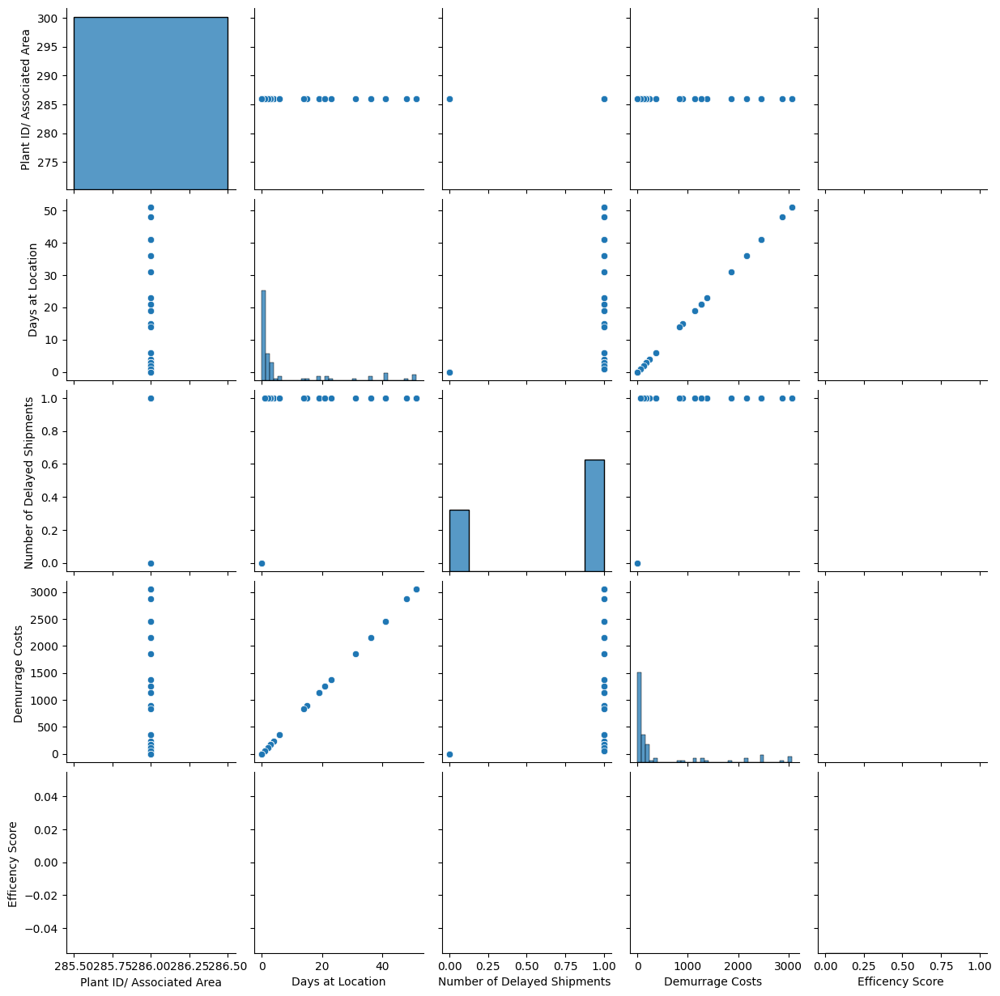

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
sns.pairplot(df)
plt.show()

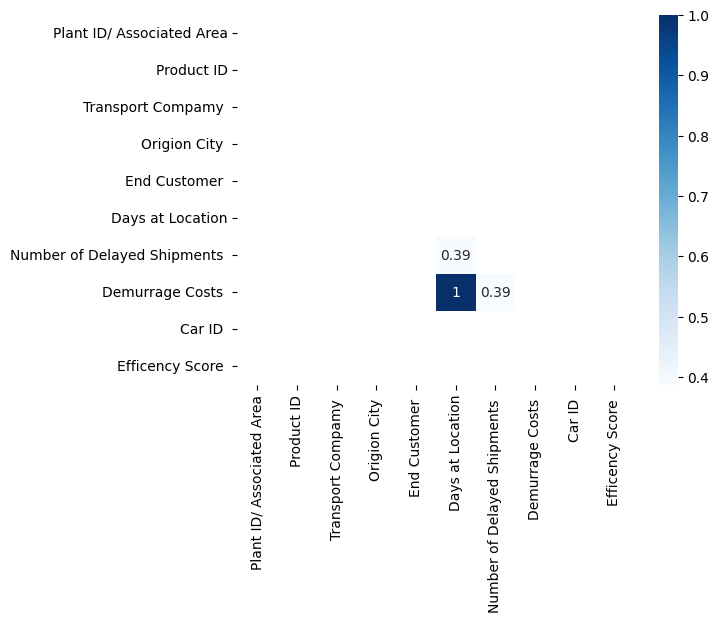

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Convert relevant columns to numeric, handling errors
for col in df.columns:
    try:
        df[col] = pd.to_numeric(df[col], errors='coerce')
    except:
        pass  # Handle cases where conversion is not possible

sns.heatmap(df.corr(),cmap="Blues", mask=np.triu(df.corr()),
                    annot=True)

plt.show()

In [ ]:
df.columns

Index(['Plant ID/ Associated Area', 'Product ID', 'Transport Compamy ',
       'Origion City ', 'End Customer ', 'Days at Location',
       'Number of Delayed Shipments ', 'Demurrage Costs ', 'Car ID ',
       'Efficency Score '],
      dtype='object')

Mean Squared Error: 4737.7885
R-squared: 0.8346
Feature: number_of_days_delayed, Importance: 0.9167
Feature: shipment_type, Importance: 0.0208
Feature: customer_name, Importance: 0.0142
Feature: railroad_company, Importance: 0.0404
Feature: number_of_delayed_shipments, Importance: 0.0080


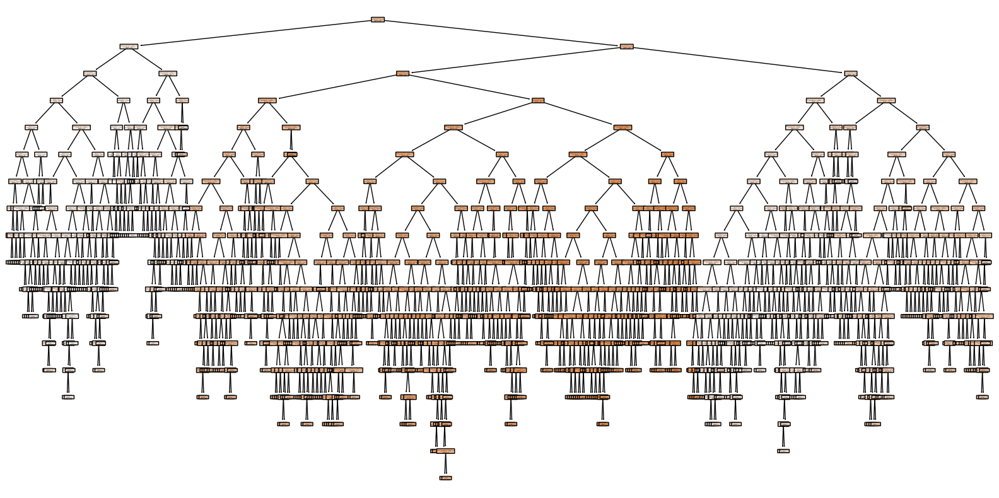


Decision tree structure:
Node 0 is a split node.
	Split feature: days_at_location with threshold 0.5
	Predicted value: 288.3531563806885
	Left child: 1, Right child: 280
Node 1 is a split node.
	Split feature: number_of_delayed_shipments with threshold 2.5
	Predicted value: 81.95286591796452
	Left child: 2, Right child: 197
Node 2 is a split node.
	Split feature: transport_company with threshold 3.5
	Predicted value: 71.18324989638268
	Left child: 3, Right child: 164
Node 3 is a split node.
	Split feature: lane_id with threshold 2.5
	Predicted value: 77.68331282308618
	Left child: 4, Right child: 51
Node 4 is a split node.
	Split feature: lane_id with threshold 1.5
	Predicted value: 65.38759930683598
	Left child: 5, Right child: 44
Node 5 is a split node.
	Split feature: end_customer with threshold 2.5
	Predicted value: 74.71510153762836
	Left child: 6, Right child: 17
Node 6 is a split node.
	Split feature: transport_company with threshold 2.5
	Predicted value: 97.02124535688002
	Lef

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, r2_score

# Generate artificial data
def generate_artificial_data():
    np.random.seed(42)

    # Number of samples
    n_samples = 500

    # Plant ID (only one plant)
plant_id = ['Paulsboro'] * n_samples

    # Seven different types of wax products
products = ['Wax Type 1', 'Wax Type 2', 'Wax Type 3', 'Wax Type 4', 'Wax Type 5', 'Wax Type 6', 'Wax Type 7']
product_id = np.random.choice(products, n_samples)

    # Eight lanes
lanes = [f'Lane_{i}' for i in range(1, 9)]
lane_id = np.random.choice(lanes, n_samples)

    # Five different transport companies
transport_companies = [f'Transport_{i}' for i in range(1, 6)]
transport_company = np.random.choice(transport_companies, n_samples)

    # Ten end customers
end_customers = [f'Customer_{i}' for i in range(1, 11)]
end_customer = np.random.choice(end_customers, n_samples)

    # Generate days_at_location
days_at_location = np.random.choice(['0-2', '3-5', '6-10', '11-15', '16-20', '21+'], n_samples)

    # Generate numeric discrete variable for number_of_delayed_shipments
number_of_delayed_shipments = np.random.poisson(lam=2, size=n_samples)

    # Generate continuous target variable for demurrage_cost
demurrage_cost = (days_at_location == '0-2').astype(int) * 50 + \
                     (days_at_location == '3-5').astype(int) * 100 + \
                     (days_at_location == '6-10').astype(int) * 200 + \
                     (days_at_location == '11-15').astype(int) * 300 + \
                     (days_at_location == '16-20').astype(int) * 400 + \
                     (days_at_location == '21+').astype(int) * 500 + \
                     number_of_delayed_shipments * 15 + \
                     np.random.normal(loc=0, scale=50, size=n_samples)  # Adding some noise'

    # Change the column name from "number_of_delayed_shipments" to "days_at_location"
data.rename(columns={'number_of_days_delayed': 'days_at_location'}, inplace=True)


    # Create a DataFrame
data = pd.DataFrame({
        'plant_id': plant_id,
        'product_id': product_id,
        'lane_id': lane_id,
        'transport_company': transport_company,
        'end_customer': end_customer,
        'days_at_location': days_at_location,
        'number_of_delayed_shipments': number_of_delayed_shipments,
        'demurrage_cost': demurrage_cost

    })

    # Save to CSV
data.to_csv('artificial_demurrage_data.csv', index=False)

# Generate artificial data
generate_artificial_data()

# Load your data
data = pd.read_csv('artificial_demurrage_data.csv')

# Encode categorical variables
label_encoders = {}
for column in ['plant_id', 'product_id', 'lane_id', 'transport_company', 'end_customer', 'days_at_location']:
    le = LabelEncoder()
    data[column] = le.fit_transform(data[column])
    label_encoders[column] = le

# Split data into features and target
X = data[['plant_id', 'product_id', 'lane_id', 'transport_company', 'end_customer', 'days_at_location', 'number_of_delayed_shipments']]
y = data['demurrage_cost']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the model
model = DecisionTreeRegressor(random_state=42)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse:.4f}')
print(f'R-squared: {r2:.4f}')

# Print feature importances
for feature, importance in zip(feature_names, importances):
    print(f'Feature: {feature}, Importance: {importance:.4f}')

# Plot and display the decision tree with values
plt.figure(figsize=(20,10))
plot_tree(model, feature_names=X.columns, filled=True, rounded=True, impurity=True)
plt.show()

# Extract decision tree attributes
n_nodes = model.tree_.node_count
children_left = model.tree_.children_left
children_right = model.tree_.children_right
feature = model.tree_.feature
threshold = model.tree_.threshold
value = model.tree_.value

print("\nDecision tree structure:")
for i in range(n_nodes):
    if children_left[i] == children_right[i]:  # leaf node
        print(f"Node {i} is a leaf node.")
        print(f"\tPredicted value: {value[i][0][0]}") # Access the predicted value correctly
    else:
        print(f"Node {i} is a split node.")
        print(f"\tSplit feature: {X.columns[feature[i]]} with threshold {threshold[i]}") # Use X.columns to get feature names
        print(f"\tPredicted value: {value[i][0][0]}") # Access the predicted value correctly
        print(f"\tLeft child: {children_left[i]}, Right child: {children_right[i]}")

In [ ]:
print("Encoder for end_customer:", label_encoders['end_customer'].classes_)
print("Encoder for end_customer:", label_encoders['end_customer'].classes_)
print("Encoder for product_id:", label_encoders['product_id'].classes_)

Encoder for end_customer: ['Customer_1' 'Customer_10' 'Customer_2' 'Customer_3' 'Customer_4'
 'Customer_5' 'Customer_6' 'Customer_7' 'Customer_8' 'Customer_9']
Encoder for end_customer: ['Customer_1' 'Customer_10' 'Customer_2' 'Customer_3' 'Customer_4'
 'Customer_5' 'Customer_6' 'Customer_7' 'Customer_8' 'Customer_9']
Encoder for product_id: ['Wax Type 1' 'Wax Type 2' 'Wax Type 3' 'Wax Type 4' 'Wax Type 5'
 'Wax Type 6' 'Wax Type 7']


In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Create the model
model = DecisionTreeRegressor(random_state=42)

# Train the model
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)


In [ ]:
# Calculate and print the metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse:.4f}')
print(f'R-squared: {r2:.4f}')


Mean Squared Error: 4737.7885
R-squared: 0.8346


In [ ]:
# Get feature importances
importances = model.feature_importances_
feature_names = X.columns

# Print feature importances
for feature, importance in zip(feature_names, importances):
    print(f'Feature: {feature}, Importance: {importance:.4f}')


Feature: plant_id, Importance: 0.0000
Feature: product_id, Importance: 0.0181
Feature: lane_id, Importance: 0.0213
Feature: transport_company, Importance: 0.0161
Feature: end_customer, Importance: 0.0220
Feature: days_at_location, Importance: 0.8957
Feature: number_of_delayed_shipments, Importance: 0.0267


In [ ]:
import joblib

# Save the model
joblib.dump(model, 'demurrage_model.pkl')

# Load the model
loaded_model = joblib.load('demurrage_model.pkl')

# Predict using the loaded model
loaded_model.predict(X_test)


array([237.57193833,  82.87450461, 476.1861758 , 645.20552604,
       483.44790086, 399.83955494, 128.90330524,  46.09058241,
       303.21564409, 562.09514809, 501.22252475, 306.68277505,
       439.206396  , 571.44163735,  68.68605031,  74.00457694,
        80.70720219, 224.68510341, 102.86821645, 477.08222036,
       354.45802314, 167.05496141,  68.68605031, 608.00918347,
       559.33395636, 539.58144817, 538.8923877 , 400.98840347,
        59.19094352, 579.54425608, 119.78654752, 443.29208296,
       657.29387251, 177.23972963, 273.57915348,  56.37283116,
       160.47248066, 107.28348121, 539.37610293, 449.37448585,
       372.31242543, 146.53466133, 488.71133636,  42.12712677,
       184.52588374,  11.00928588,  87.07899158, 282.06970458,
       102.95717908, 116.76360963, 504.12584588, 483.77759567,
       -20.19466757, 588.45955846, 115.55315439,  93.12546141,
       284.88568227,  12.37834459, 220.50050256, 376.02355616,
        -5.9176113 , 501.60922886, 143.06181741, 334.19

Mean Squared Error: 4434.8646
R-squared: 0.8717
Feature: number_of_days_delayed, Importance: 0.9167
Feature: shipment_type, Importance: 0.0208
Feature: customer_name, Importance: 0.0142
Feature: railroad_company, Importance: 0.0404
Feature: number_of_delayed_shipments, Importance: 0.0080


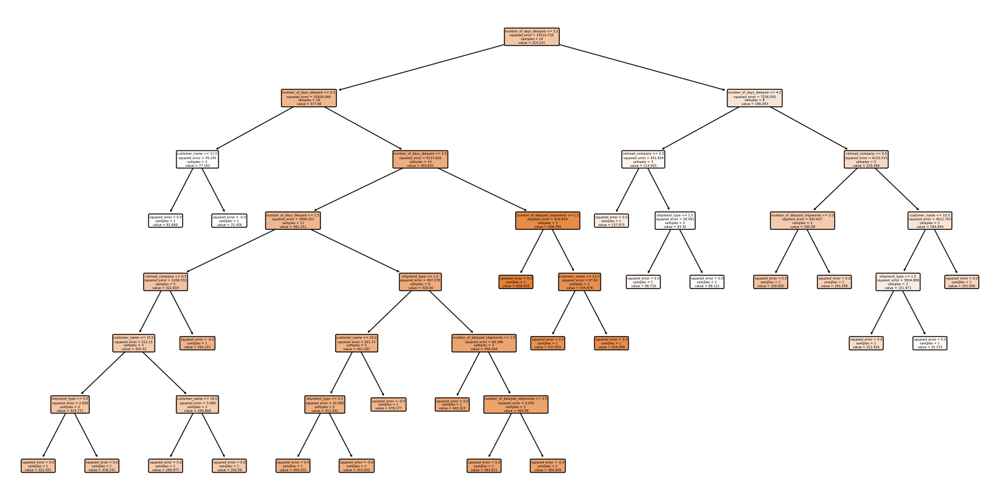


Decision tree structure:
Node 0 is a split node.
	Split feature: 0 with threshold 3.5
	Predicted value: [[314.12070712]]
	Left child: 1, Right child: 32
Node 1 is a split node.
	Split feature: 0 with threshold 0.5
	Predicted value: [[377.95960232]]
	Left child: 2, Right child: 5
Node 2 is a split node.
	Split feature: 2 with threshold 11.0
	Predicted value: [[77.16203479]]
	Left child: 3, Right child: 4
Node 3 is a leaf node.
	Predicted value: [[83.8884796]]
Node 4 is a leaf node.
	Predicted value: [[70.43558998]]
Node 5 is a split node.
	Split feature: 0 with threshold 2.5
	Predicted value: [[420.9306834]]
	Left child: 6, Right child: 27
Node 6 is a split node.
	Split feature: 0 with threshold 1.5
	Predicted value: [[381.15108404]]
	Left child: 7, Right child: 16
Node 7 is a split node.
	Split feature: 3 with threshold 6.5
	Predicted value: [[322.90384199]]
	Left child: 8, Right child: 15
Node 8 is a split node.
	Split feature: 2 with threshold 15.5
	Predicted value: [[305.3196702]]


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, r2_score
import joblib
import matplotlib.pyplot as plt

# Generate artificial data (if not already generated)
def generate_artificial_data():
    np.random.seed(42)

    # Number of samples
    n_samples = 30

    # Generate categorical variable for number_of_days_delayed
    number_of_days_delayed = np.random.choice(['0-2', '3-5', '6-10', '11-15', '16-20', '21+'], n_samples)

    # Generate categorical variable for shipment_type
    shipment_type = np.random.choice(['Bulk Liquid', 'Dry Goods', 'Refrigerated'], n_samples)

    # Generate categorical variable for customer_name
    customer_names = [f'Customer_{i}' for i in range(1, 101)]  # 100 unique customers
    customer_name = np.random.choice(customer_names, n_samples)

    # Generate categorical variable for railroad_company
    railroad_companies = [f'Railroad_{i}' for i in range(1, 11)]  # 10 unique railroad companies
    railroad_company = np.random.choice(railroad_companies, n_samples)

    # Generate numeric discrete variable for number_of_delayed_shipments
    number_of_delayed_shipments = np.random.poisson(lam=2, size=n_samples)

    # Generate continuous target variable for demurrage_cost
    demurrage_cost = (number_of_days_delayed == '0-2').astype(int) * 50 + \
                     (number_of_days_delayed == '3-5').astype(int) * 100 + \
                     (number_of_days_delayed == '6-10').astype(int) * 200 + \
                     (number_of_days_delayed == '11-15').astype(int) * 300 + \
                     (number_of_days_delayed == '16-20').astype(int) * 400 + \
                     (number_of_days_delayed == '21+').astype(int) * 500 + \
                     number_of_delayed_shipments * 15 + \
                     np.random.normal(loc=0, scale=50, size=n_samples)  # Adding some noise

    # Create a DataFrame
    data = pd.DataFrame({
        'number_of_days_delayed': number_of_days_delayed,
        'shipment_type': shipment_type,
        'customer_name': customer_name,
        'railroad_company': railroad_company,
        'number_of_delayed_shipments': number_of_delayed_shipments,
        'demurrage_cost': demurrage_cost
    })

    # Save to CSV
    data.to_csv('artificial_demurrage_data.csv', index=False)

# Generate artificial data
generate_artificial_data()

# Load your data
data = pd.read_csv('artificial_demurrage_data.csv')

# Encode categorical variables
label_encoders = {}
for column in ['shipment_type', 'customer_name', 'railroad_company', 'number_of_days_delayed']:
    le = LabelEncoder()
    data[column] = le.fit_transform(data[column])
    label_encoders[column] = le

# Split data into features and target
X = data[['number_of_days_delayed', 'shipment_type', 'customer_name', 'railroad_company', 'number_of_delayed_shipments']]
y = data['demurrage_cost']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the model
model = DecisionTreeRegressor(random_state=42)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse:.4f}')
print(f'R-squared: {r2:.4f}')

# Get feature importances
importances = model.feature_importances_
feature_names = X.columns

# Print feature importances
for feature, importance in zip(feature_names, importances):
    print(f'Feature: {feature}, Importance: {importance:.4f}')

# Save the model
joblib.dump(model, 'demurrage_model.pkl')

# Load the model
loaded_model = joblib.load('demurrage_model.pkl')

# Predict using the loaded model
loaded_model.predict(X_test)

# Plot and display the decision tree with values
plt.figure(figsize=(20,10))
plot_tree(model, feature_names=feature_names, filled=True, rounded=True, impurity=True)
plt.show()

# Extract and print values and efficiencies for each node
n_nodes = model.tree_.node_count
children_left = model.tree_.children_left
children_right = model.tree_.children_right
feature = model.tree_.feature
threshold = model.tree_.threshold
value = model.tree_.value

print("\nDecision tree structure:")
for i in range(n_nodes):
    if children_left[i] == children_right[i]:  # leaf node
        print(f"Node {i} is a leaf node.")
        print(f"\tPredicted value: {value[i]}")
    else:
        print(f"Node {i} is a split node.")
        print(f"\tSplit feature: {feature[i]} with threshold {threshold[i]}")
        print(f"\tPredicted value: {value[i]}")
        print(f"\tLeft child: {children_left[i]}, Right child: {children_right[i]}")


In [ ]:
print("Encoder for customer_name:", label_encoders['customer_name'].classes_)
print("Encoder for shipment_type:", label_encoders['shipment_type'].classes_)
print("Encoder for railroad_company:", label_encoders['railroad_company'].classes_)

Encoder for customer_name: ['Customer_100' 'Customer_14' 'Customer_15' 'Customer_18' 'Customer_2'
 'Customer_34' 'Customer_35' 'Customer_36' 'Customer_4' 'Customer_44'
 'Customer_47' 'Customer_48' 'Customer_50' 'Customer_54' 'Customer_6'
 'Customer_62' 'Customer_63' 'Customer_72' 'Customer_74' 'Customer_78'
 'Customer_8' 'Customer_81' 'Customer_87' 'Customer_90' 'Customer_93'
 'Customer_95']
Encoder for shipment_type: ['Bulk Liquid' 'Dry Goods' 'Refrigerated']
Encoder for railroad_company: ['Railroad_1' 'Railroad_10' 'Railroad_2' 'Railroad_3' 'Railroad_5'
 'Railroad_7' 'Railroad_8' 'Railroad_9']


In [ ]:
# Extract and print values and efficiencies for each node
n_nodes = model.tree_.node_count
children_left = model.tree_.children_left
children_right = model.tree_.children_right
feature = model.tree_.feature
threshold = model.tree_.threshold
value = model.tree_.value

print("\nDecision tree structure:")
for i in range(n_nodes):
    if children_left[i] == children_right[i]:  # leaf node
        print(f"Node {i} is a leaf node.")
        print(f"\tPredicted value: {value[i]}")
    else:
        print(f"Node {i} is a split node.")
        print(f"\tSplit feature: {feature[i]} with threshold {threshold[i]}")
        print(f"\tPredicted value: {value[i]}")
        print(f"\tLeft child: {children_left[i]}, Right child: {children_right[i]}")


Decision tree structure:
Node 0 is a split node.
	Split feature: 0 with threshold 3.5
	Predicted value: [[314.12070712]]
	Left child: 1, Right child: 32
Node 1 is a split node.
	Split feature: 0 with threshold 0.5
	Predicted value: [[377.95960232]]
	Left child: 2, Right child: 5
Node 2 is a split node.
	Split feature: 2 with threshold 11.0
	Predicted value: [[77.16203479]]
	Left child: 3, Right child: 4
Node 3 is a leaf node.
	Predicted value: [[83.8884796]]
Node 4 is a leaf node.
	Predicted value: [[70.43558998]]
Node 5 is a split node.
	Split feature: 0 with threshold 2.5
	Predicted value: [[420.9306834]]
	Left child: 6, Right child: 27
Node 6 is a split node.
	Split feature: 0 with threshold 1.5
	Predicted value: [[381.15108404]]
	Left child: 7, Right child: 16
Node 7 is a split node.
	Split feature: 3 with threshold 6.5
	Predicted value: [[322.90384199]]
	Left child: 8, Right child: 15
Node 8 is a split node.
	Split feature: 2 with threshold 15.5
	Predicted value: [[305.3196702]]


Mean Squared Error: 4434.8646
R-squared: 0.8717
Feature: number_of_days_delayed, Importance: 0.9167
Feature: shipment_type, Importance: 0.0208
Feature: customer_name, Importance: 0.0142
Feature: railroad_company, Importance: 0.0404
Feature: number_of_delayed_shipments, Importance: 0.0080


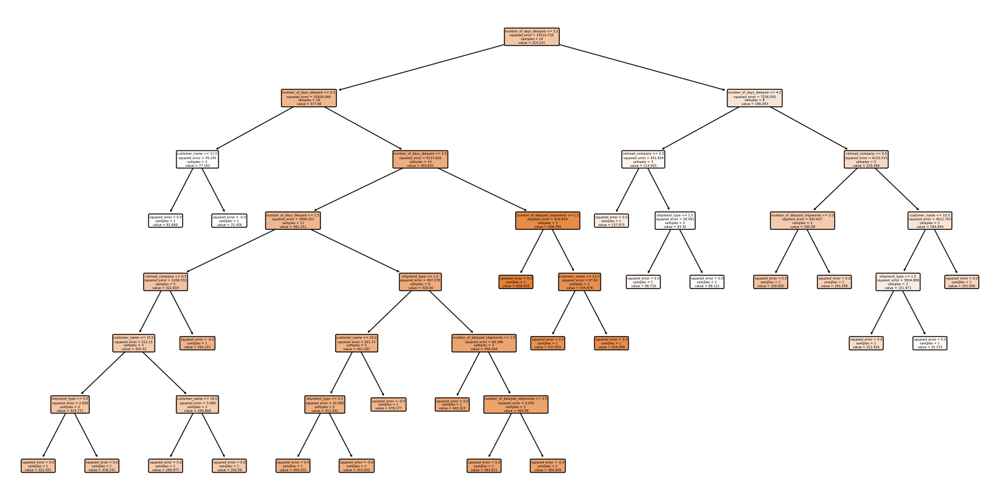


Decision tree structure:
Node 0 is a split node.
	Split feature: 0 with threshold 3.5
	Predicted value: [[314.12070712]]
	Left child: 1, Right child: 32
Node 1 is a split node.
	Split feature: 0 with threshold 0.5
	Predicted value: [[377.95960232]]
	Left child: 2, Right child: 5
Node 2 is a split node.
	Split feature: 2 with threshold 11.0
	Predicted value: [[77.16203479]]
	Left child: 3, Right child: 4
Node 3 is a leaf node.
	Predicted value: [[83.8884796]]
Node 4 is a leaf node.
	Predicted value: [[70.43558998]]
Node 5 is a split node.
	Split feature: 0 with threshold 2.5
	Predicted value: [[420.9306834]]
	Left child: 6, Right child: 27
Node 6 is a split node.
	Split feature: 0 with threshold 1.5
	Predicted value: [[381.15108404]]
	Left child: 7, Right child: 16
Node 7 is a split node.
	Split feature: 3 with threshold 6.5
	Predicted value: [[322.90384199]]
	Left child: 8, Right child: 15
Node 8 is a split node.
	Split feature: 2 with threshold 15.5
	Predicted value: [[305.3196702]]


In [ ]:
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, r2_score
import joblib
import matplotlib.pyplot as plt

# Generate artificial data (if not already generated)
def generate_artificial_data():
    np.random.seed(42)

    # Number of samples
    n_samples = 30

    # Generate categorical variable for number_of_days_delayed
    number_of_days_delayed = np.random.choice(['0-2', '3-5', '6-10', '11-15', '16-20', '21+'], n_samples)

    # Generate categorical variable for shipment_type
    shipment_type = np.random.choice(['Bulk Liquid', 'Dry Goods', 'Refrigerated'], n_samples)

    # Generate categorical variable for customer_name
    customer_names = [f'Customer_{i}' for i in range(1, 101)]  # 100 unique customers
    customer_name = np.random.choice(customer_names, n_samples)

    # Generate categorical variable for railroad_company
    railroad_companies = [f'Railroad_{i}' for i in range(1, 11)]  # 10 unique railroad companies
    railroad_company = np.random.choice(railroad_companies, n_samples)

    # Generate numeric discrete variable for number_of_delayed_shipments
    number_of_delayed_shipments = np.random.poisson(lam=2, size=n_samples)

    # Generate continuous target variable for demurrage_cost
    demurrage_cost = (number_of_days_delayed == '0-2').astype(int) * 50 + \
                     (number_of_days_delayed == '3-5').astype(int) * 100 + \
                     (number_of_days_delayed == '6-10').astype(int) * 200 + \
                     (number_of_days_delayed == '11-15').astype(int) * 300 + \
                     (number_of_days_delayed == '16-20').astype(int) * 400 + \
                     (number_of_days_delayed == '21+').astype(int) * 500 + \
                     number_of_delayed_shipments * 15 + \
                     np.random.normal(loc=0, scale=50, size=n_samples)  # Adding some noise

    # Create a DataFrame
    data = pd.DataFrame({
        'number_of_days_delayed': number_of_days_delayed,
        'shipment_type': shipment_type,
        'customer_name': customer_name,
        'railroad_company': railroad_company,
        'number_of_delayed_shipments': number_of_delayed_shipments,
        'demurrage_cost': demurrage_cost
    })

    # Save to CSV
    data.to_csv('artificial_demurrage_data.csv', index=False)

# Generate artificial data
generate_artificial_data()

# Load your data
data = pd.read_csv('artificial_demurrage_data.csv')

# Encode categorical variables
label_encoders = {}
for column in ['shipment_type', 'customer_name', 'railroad_company', 'number_of_days_delayed']:
    le = LabelEncoder()
    data[column] = le.fit_transform(data[column])
    label_encoders[column] = le

# Split data into features and target
X = data[['number_of_days_delayed', 'shipment_type', 'customer_name', 'railroad_company', 'number_of_delayed_shipments']]
y = data['demurrage_cost']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the model
model = DecisionTreeRegressor(random_state=42)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse:.4f}')
print(f'R-squared: {r2:.4f}')

# Get feature importances
importances = model.feature_importances_
feature_names = X.columns

# Print feature importances
for feature, importance in zip(feature_names, importances):
    print(f'Feature: {feature}, Importance: {importance:.4f}')

# Save the model
joblib.dump(model, 'demurrage_model.pkl')

# Load the model
loaded_model = joblib.load('demurrage_model.pkl')

# Predict using the loaded model
loaded_model.predict(X_test)

# Plot and display the decision tree with values
plt.figure(figsize=(20,10))
plot_tree(model, feature_names=feature_names, filled=True, rounded=True, impurity=True)
plt.show()

# Extract and print values and efficiencies for each node
n_nodes = model.tree_.node_count
children_left = model.tree_.children_left
children_right = model.tree_.children_right
feature = model.tree_.feature
threshold = model.tree_.threshold
value = model.tree_.value

print("\nDecision tree structure:")
for i in range(n_nodes):
    if children_left[i] == children_right[i]:  # leaf node
        print(f"Node {i} is a leaf node.")
        print(f"\tPredicted value: {value[i]}")
    else:
        print(f"Node {i} is a split node.")
        print(f"\tSplit feature: {feature[i]} with threshold {threshold[i]}")
        print(f"\tPredicted value: {value[i]}")
        print(f"\tLeft child: {children_left[i]}, Right child: {children_right[i]}")

##Paulsboro

In [ ]:
import pandas as pd
from google.colab import drive
url11= "/content/Paulsboro CSV.csv"
df = pd.read_csv(url11)

In [ ]:
df.head()

,Plant ID/ Associated Area,Product ID,Transport Compamy,Origion City,End Customer,Days at Location,Number of Delayed Shipments,Demurrage Costs,Car ID,Efficency Score
0,286,"PET OIL, NEC.",NFS,BELLE CHASSE,CHEVRON ORONITE,0,0,0,COCX 291050,NaN
1,286,"PET OIL, NEC.",NFS,BELLE CHASSE,CHEVRON ORONITE,1,1,60,COCX 292017,NaN
2,286,"PET OIL, NEC.",NFS,BELLE CHASSE,CHEVRON ORONITE,19,1,1140,CTCX 719455,NaN
3,286,"PET OIL, NEC.",NFS,BELLE CHASSE,CHEVRON ORONITE,0,0,0,CTCX 719555,NaN
4,286,PET LUB OIL,NFS,BEAUMONT,EXXONMOBIL OIL CORP,0,0,0,HPLX 405510,NaN


Mean Squared Error: 0.0000
R-squared: 1.0000
Feature: Days at Location, Importance: 0.9983
Feature: Number of Delayed Shipments , Importance: 0.0000
Feature: Origion City , Importance: 0.0013
Feature: End Customer , Importance: 0.0004


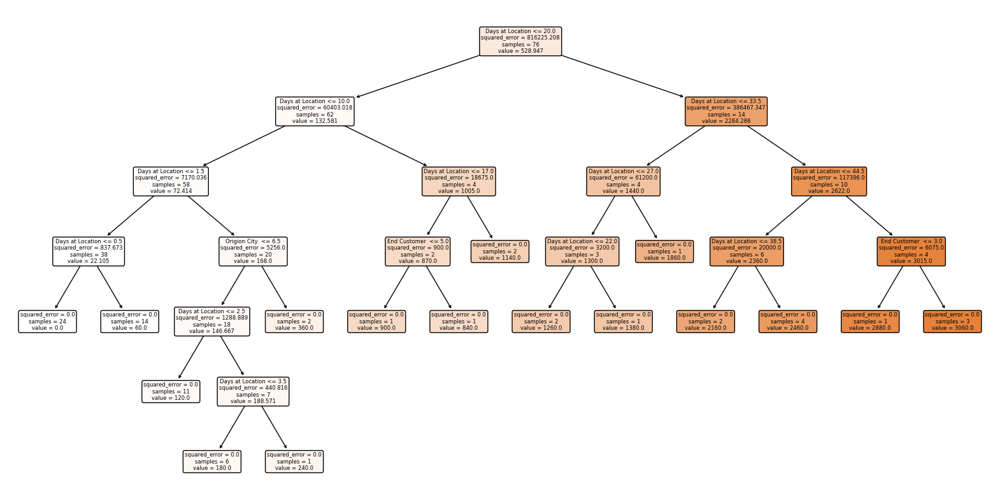


Decision tree structure:
Node 0 is a split node.
	Split feature: 0 with threshold 20.0
	Predicted value: [[528.94736842]]
	Left child: 1, Right child: 18
Node 1 is a split node.
	Split feature: 0 with threshold 10.0
	Predicted value: [[132.58064516]]
	Left child: 2, Right child: 13
Node 2 is a split node.
	Split feature: 0 with threshold 1.5
	Predicted value: [[72.4137931]]
	Left child: 3, Right child: 6
Node 3 is a split node.
	Split feature: 0 with threshold 0.5
	Predicted value: [[22.10526316]]
	Left child: 4, Right child: 5
Node 4 is a leaf node.
	Predicted value: [[0.]]
Node 5 is a leaf node.
	Predicted value: [[60.]]
Node 6 is a split node.
	Split feature: 2 with threshold 6.5
	Predicted value: [[168.]]
	Left child: 7, Right child: 12
Node 7 is a split node.
	Split feature: 0 with threshold 2.5
	Predicted value: [[146.66666667]]
	Left child: 8, Right child: 9
Node 8 is a leaf node.
	Predicted value: [[120.]]
Node 9 is a split node.
	Split feature: 0 with threshold 3.5
	Predicted

In [ ]:
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, r2_score
import joblib
import matplotlib.pyplot as plt

# Load the dataset
data =df

# Initialize LabelEncoders
le_origin_city = LabelEncoder()
le_end_customer = LabelEncoder()

# Fit and transform the categorical columns, replacing the original columns
df['Origion City '] = le_origin_city.fit_transform(df['Origion City ']) # Encode and replace 'Origin City' column
df['End Customer '] = le_end_customer.fit_transform(df['End Customer ']) # Encode and replace 'End Customer' column

# Select features and target variable, use the encoded columns
X = df[['Days at Location', 'Number of Delayed Shipments ',  "Origion City ", "End Customer "]]
y = df['Demurrage Costs ']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the model
model = DecisionTreeRegressor(random_state=42)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse:.4f}')
print(f'R-squared: {r2:.4f}')

# Get feature importances
importances = model.feature_importances_
feature_names = X.columns

# Print feature importances
for feature, importance in zip(feature_names, importances):
    print(f'Feature: {feature}, Importance: {importance:.4f}')

# Save the model
joblib.dump(model, 'demurrage_model.pkl')

# Load the model
loaded_model = joblib.load('demurrage_model.pkl')

# Predict using the loaded model
loaded_model.predict(X_test)

# Plot and display the decision tree with values
plt.figure(figsize=(20,10))
plot_tree(model, feature_names=feature_names, filled=True, rounded=True, impurity=True)
plt.show()

# Extract and print values and efficiencies for each node
n_nodes = model.tree_.node_count
children_left = model.tree_.children_left
children_right = model.tree_.children_right
feature = model.tree_.feature
threshold = model.tree_.threshold
value = model.tree_.value

print("\nDecision tree structure:")
for i in range(n_nodes):
    if children_left[i] == children_right[i]:  # leaf node
        print(f"Node {i} is a leaf node.")
        print(f"\tPredicted value: {value[i]}")
    else:
        print(f"Node {i} is a split node.")
        print(f"\tSplit feature: {feature[i]} with threshold {threshold[i]}")
        print(f"\tPredicted value: {value[i]}")
        print(f"\tLeft child: {children_left[i]}, Right child: {children_right[i]}")



In [ ]:
print("Encoder for origin_city:", le_origin_city.classes_)
print("Encoder for end_customer:", le_end_customer.classes_)

Encoder for origin_city: ['BATON ROUGE' 'BAYONNE' 'BEAUMONT' 'BELLE CHASSE' 'BRAITHWAITE'
 'DEER PARK' 'HOUSTON' 'MILLVILLE']
Encoder for end_customer: ['CHEVRON ORONITE' 'EXXONMOBIL LUB PETRO SPECIAL' 'EXXONMOBIL OIL CORP'
 'EXXONMOBIL PRODUCT SOLUTIONS C' 'EXXONMOBIL PRODUCT SOLUTIONS CO'
 'EXXONMOBILLP&S' 'GORDON TERMINAL SERVICE CO' 'STOLT NIELSEN USA INC'
 'STOLTHAVEN NEW ORLEANS']


Mean Squared Error: 570790.2583
R-squared: -105.4113
Feature: Number of Delayed Shipments , Importance: 0.3246
Feature: Origion City , Importance: 0.3561
Feature: End Customer , Importance: 0.3193


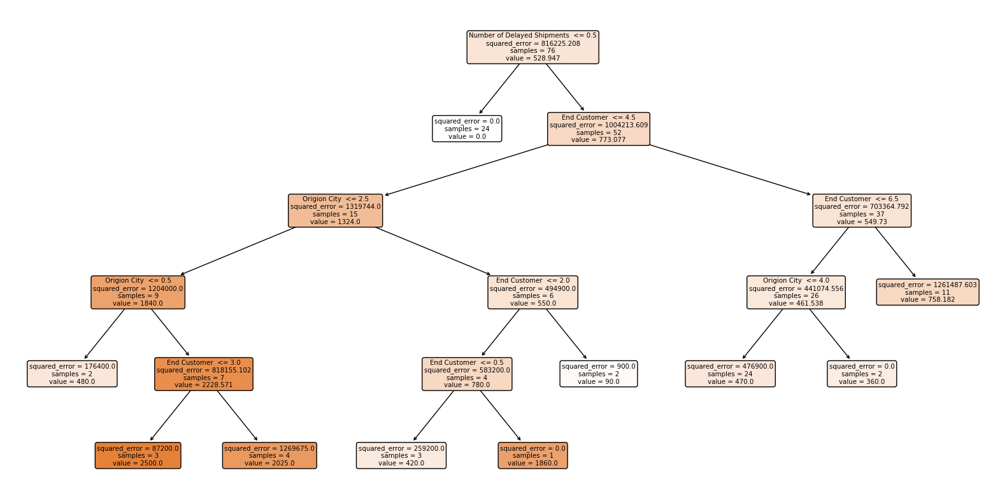


Decision tree structure:
Node 0 is a split node.
	Split feature: 0 with threshold 0.5
	Predicted value: [[528.94736842]]
	Left child: 1, Right child: 2
Node 1 is a leaf node.
	Predicted value: [[0.]]
Node 2 is a split node.
	Split feature: 2 with threshold 4.5
	Predicted value: [[773.07692308]]
	Left child: 3, Right child: 14
Node 3 is a split node.
	Split feature: 1 with threshold 2.5
	Predicted value: [[1324.]]
	Left child: 4, Right child: 9
Node 4 is a split node.
	Split feature: 1 with threshold 0.5
	Predicted value: [[1840.]]
	Left child: 5, Right child: 6
Node 5 is a leaf node.
	Predicted value: [[480.]]
Node 6 is a split node.
	Split feature: 2 with threshold 3.0
	Predicted value: [[2228.57142857]]
	Left child: 7, Right child: 8
Node 7 is a leaf node.
	Predicted value: [[2500.]]
Node 8 is a leaf node.
	Predicted value: [[2025.]]
Node 9 is a split node.
	Split feature: 2 with threshold 2.0
	Predicted value: [[550.]]
	Left child: 10, Right child: 13
Node 10 is a split node.
	Spli

In [ ]:
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, r2_score
import joblib
import matplotlib.pyplot as plt

# Load the dataset
data =df

# Initialize LabelEncoders
le_origin_city = LabelEncoder()
le_end_customer = LabelEncoder()

# Fit and transform the categorical columns, replacing the original columns
df['Origion City '] = le_origin_city.fit_transform(df['Origion City ']) # Encode and replace 'Origin City' column
df['End Customer '] = le_end_customer.fit_transform(df['End Customer ']) # Encode and replace 'End Customer' column

# Select features and target variable, use the encoded columns
X = df[['Number of Delayed Shipments ',  "Origion City ", "End Customer "]]
y = df['Demurrage Costs ']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the model
model = DecisionTreeRegressor(random_state=42)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse:.4f}')
print(f'R-squared: {r2:.4f}')

# Get feature importances
importances = model.feature_importances_
feature_names = X.columns

# Print feature importances
for feature, importance in zip(feature_names, importances):
    print(f'Feature: {feature}, Importance: {importance:.4f}')

# Save the model
joblib.dump(model, 'demurrage_model.pkl')

# Load the model
loaded_model = joblib.load('demurrage_model.pkl')

# Predict using the loaded model
loaded_model.predict(X_test)

# Plot and display the decision tree with values
plt.figure(figsize=(20,10))
plot_tree(model, feature_names=feature_names, filled=True, rounded=True, impurity=True)
plt.show()

# Extract and print values and efficiencies for each node
n_nodes = model.tree_.node_count
children_left = model.tree_.children_left
children_right = model.tree_.children_right
feature = model.tree_.feature
threshold = model.tree_.threshold
value = model.tree_.value

print("\nDecision tree structure:")
for i in range(n_nodes):
    if children_left[i] == children_right[i]:  # leaf node
        print(f"Node {i} is a leaf node.")
        print(f"\tPredicted value: {value[i]}")
    else:
        print(f"Node {i} is a split node.")
        print(f"\tSplit feature: {feature[i]} with threshold {threshold[i]}")
        print(f"\tPredicted value: {value[i]}")
        print(f"\tLeft child: {children_left[i]}, Right child: {children_right[i]}")


In [ ]:
print("Encoder for origin_city:", le_origin_city.classes_)
print("Encoder for end_customer:", le_end_customer.classes_)

Encoder for origin_city: [0 1 2 3 4 5 6 7]
Encoder for end_customer: [0 1 2 3 4 5 6 7 8]


## IAU Run Demurrage

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
url24 = "/content/IAU Data Set.1.csv"

# Use pd.read_csv to read the CSV file
df = pd.read_csv(url24)

In [ ]:
df.columns

Index(['Year of Date Toggle Filter', 'Quarter of Date Toggle Filter',
       'Chart Selection', 'Business Line', 'Date Toggle Filter', 'Dest City',
       'Invoice Company', 'Invoice Desk Company', 'Invoice Desk Type',
       'Origin City', 'Origin St', 'div_desc_costcenter', 'Invoice Date',
       'Invoice Num', 'Invoice Type Descr', 'Distinct Invoice Count',
       'Local Amount', 'Invoice Subtype Descr', 'Clearing Date', 'Plant',
       'Car No', 'Vendor Name'],
      dtype='object')

In [ ]:
df['Origin City'].unique()

array(['ANCHORAGE', 'BEAUMONT', 'BATONROUGE', 'ANGLETON', 'TORONTO',
       'LEDUC', 'BUTLER', 'PAVONIA', 'PAVONIA JCT', 'FAIRFAX', 'CICERO',
       'LINNTON', 'LOS ANGELES', 'OLATHE', 'EDMONTON', 'CALGARY',
       'BATON ROUGE', 'BUTLER JCT', nan, 'MONTREAL', 'COTE DES NEIGES',
       'SASKATOON', 'MONTREALEAST', 'HOUSTON', 'PORT ALLEN'], dtype=object)

In [ ]:
df

,Year of Date Toggle Filter,Quarter of Date Toggle Filter,Chart Selection,Business Line,Date Toggle Filter,Dest City,Invoice Company,Invoice Desk Company,Invoice Desk Type,Origin City,...,Invoice Date,Invoice Num,Invoice Type Descr,Distinct Invoice Count,Local Amount,Invoice Subtype Descr,Clearing Date,Plant,Car No,Vendor Name
0,2023,2,LUBES,LUBES,5/4/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/5/2023 0:00,3.257887e+08,EM Accessorial,1,510.00,Demurrage,5/4/2023 0:00,00UY,662348.0,UP - Union Pacific Railroad Company
1,2023,2,LUBES,LUBES,5/15/2023 0:00,NaN,EM,EM,Accessorial,BEAUMONT,...,7/11/2022 0:00,3.209563e+08,EM Accessorial,1,1696.00,Demurrage,5/15/2023 0:00,00CX,0.0,UP - Union Pacific Railroad Company
2,2023,2,LUBES,LUBES,5/25/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/28/2023 0:00,3.261905e+08,EM Accessorial,1,340.00,Demurrage,5/25/2023 0:00,00UY,224754.0,UP - Union Pacific Railroad Company
3,2023,2,LUBES,LUBES,5/25/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/28/2023 0:00,3.261905e+08,EM Accessorial,1,340.00,Demurrage,5/25/2023 0:00,00UY,892307.0,UP - Union Pacific Railroad Company
4,2023,2,LUBES,LUBES,5/25/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/28/2023 0:00,3.261905e+08,EM Accessorial,1,255.00,Demurrage,5/25/2023 0:00,00UY,32963.0,UP - Union Pacific Railroad Company
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,2024,1,LUBES,LUBES,1/24/2024 0:00,NaN,EM,EM,Accessorial,BEAUMONT,...,10/10/2023 0:00,9.612291e+09,EM Accessorial,1,3780.00,Demurrage,1/24/2024 0:00,00CX,0.0,KCS - Kansas City Southern
220,2024,1,LUBES,LUBES,1/8/2024 0:00,NaN,EM,EM,Accessorial,COTE DES NEIGES,...,10/11/2023 0:00,5.060276e+08,EM Accessorial,1,67.67,Demurrage,1/8/2024 0:00,NaN,28121.0,CP - Canadian Pacific Railway System
221,2024,1,LUBES,LUBES,1/8/2024 0:00,NaN,EM,EM,Accessorial,COTE DES NEIGES,...,9/14/2023 0:00,5.050268e+08,EM Accessorial,1,135.75,Demurrage,1/8/2024 0:00,00A9,100200.0,CP - Canadian Pacific Railway System
222,2024,1,LUBES,LUBES,1/5/2024 0:00,NaN,EM,EM,Accessorial,MONTREAL,...,11/3/2023 0:00,5.070276e+08,EM Accessorial,1,348.38,Demurrage,1/5/2024 0:00,NaN,100392.0,CP - Canadian Pacific Railway System


In [ ]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

# Assuming 'y_test' and 'y_pred' are numpy arrays of the actual and predicted values
# We will generate a Q-Q plot to compare the distributions of the actual and predicted values

# Function to create a Q-Q plot
def qq_plot(data1, data2, title='Q-Q Plot', xlabel='Quantiles of First Dataset', ylabel='Quantiles of Second Dataset'):
    # Calculate quantiles
    quantiles1 = np.percentile(data1, np.linspace(0, 100, num=len(data1)))
    quantiles2 = np.percentile(data2, np.linspace(0, 100, num=len(data2)))

    # Calculate the min and max values for the plot
    min_quantile = min(np.min(quantiles1), np.min(quantiles2))
    max_quantile = max(np.max(quantiles1), np.max(quantiles2))

    # Create a Q-Q plot
    plt.scatter(quantiles1, quantiles2)
    plt.plot([min_quantile, max_quantile], [min_quantile, max_quantile], color='r')  # Plot the
    plt.show()

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder

# 1 Select Varaibles
X = df[['Vendor Name']]

# Convert categorical feature to numerical using one-hot encoding
encoder = OneHotEncoder()
X_encoded = encoder.fit_transform(X)

y = df["Local Amount"]

#2. Creating the ML model
line_reg = LinearRegression()

#Training Model (fitting)
line_reg.fit(X_encoded, y)  # Use the encoded features

# 4. Checking my model
score = line_reg.score(X_encoded, y)  # Use the encoded features
print(score)

0.6222480144960001


In [ ]:
print('The slope m is:', line_reg.coef_)
print('The intercept b is:', line_reg.intercept_)

The slope m is: [   785.78502648  38722.08502648  12124.88502648 -11512.71497352
  -8003.19379705  -6046.5967917    1182.51579571  -9773.30033937
 -17479.46497352]
The intercept b is: 11876.714973518423


In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder

# 1 Select Varaibles
X = df[['Vendor Name']]

# Convert categorical feature to numerical using one-hot encoding
encoder = OneHotEncoder()
X_encoded = encoder.fit_transform(X)

y = df["Local Amount"]

#2. Creating the ML model
line_reg = LinearRegression()

#Training Model (fitting)
line_reg.fit(X_encoded, y)  # Use the encoded features

# 4. Checking my model
score = line_reg.score(X_encoded, y)  # Use the encoded features
print("R^2 Score:", score)

# Get feature names from the encoder
feature_names = encoder.get_feature_names_out(['Vendor Name'])

# Print slopes with corresponding vendor names
for feature, coef in zip(feature_names, line_reg.coef_):
    print(f"{feature}: {coef:.2f}")

R^2 Score: 0.6222480144960001
Vendor Name_BNSF Railroad: 785.79
Vendor Name_Belt Railway Company of Chicago: 38722.09
Vendor Name_Buffalo & Pittsburgh Railroad: 12124.89
Vendor Name_CN - Canadian National Railways: -11512.71
Vendor Name_CP - Canadian Pacific Railway System: -8003.19
Vendor Name_KCS - Kansas City Southern: -6046.60
Vendor Name_NS - Norfolk Southern Railroad: 1182.52
Vendor Name_Portland & Western Railroad: -9773.30
Vendor Name_UP - Union Pacific Railroad Company: -17479.46


Associated Demurrage Equations Per Rail Vendor
$$
Coefficent of Demurrage Expectation = Slope ( Invoice #'s ) + 11877
$$

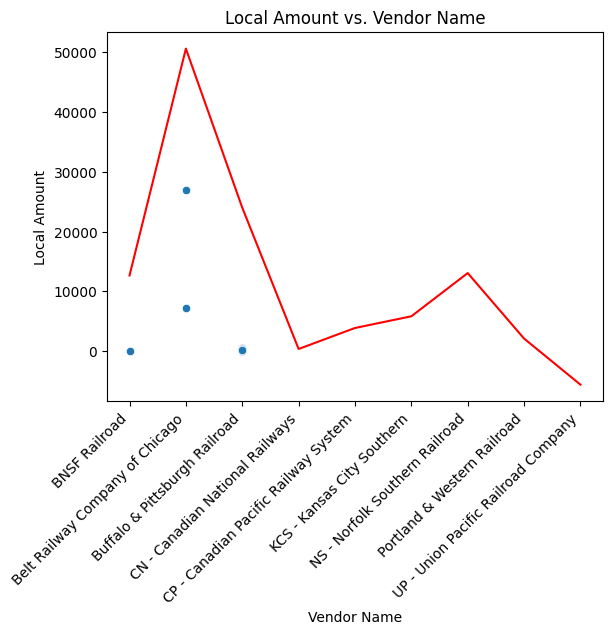

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Create sample data for prediction, covering all vendor names
sample_vendors = pd.DataFrame({'Vendor Name': encoder.categories_[0]})
sample_vendors_encoded = encoder.transform(sample_vendors)

# Predict amounts for the sample vendors
y_reg = line_reg.predict(sample_vendors_encoded)

# Visualize (assuming 'df_clean' is available and contains 'Vendor Name' and 'Local Amount')
sns.scatterplot(data=df_clean, x="Vendor Name", y='Local Amount')

# Plot predictions - use original vendor names for x-axis
sns.lineplot(x=encoder.categories_[0], y=y_reg, color='red')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Vendor Name')
plt.ylabel('Local Amount')
plt.title('Local Amount vs. Vendor Name')
plt.show()

Mean Squared Error: 94110941.1682
R-squared: 0.6066
Feature: Quarter of Date Toggle Filter, Importance: 0.0515
Feature: Origin City, Importance: 0.1554
Feature: Vendor Name , Importance: 0.7931


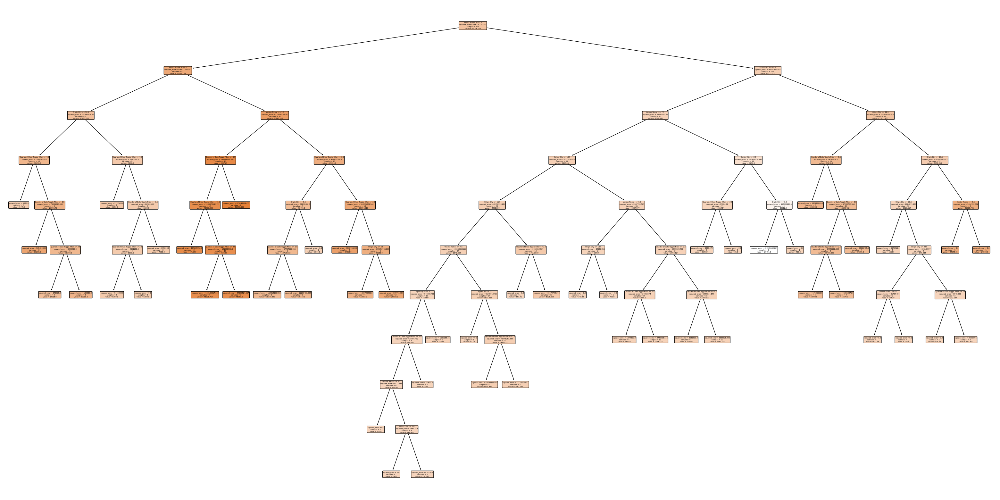


Decision tree structure:
Node 0 is a split node.
	Split feature: 2 with threshold 2.5
	Predicted value: [[12036.0047486]]
	Left child: 1, Right child: 36
Node 1 is a split node.
	Split feature: 2 with threshold 0.5
	Predicted value: [[28762.78947368]]
	Left child: 2, Right child: 17
Node 2 is a split node.
	Split feature: 1 with threshold 16.5
	Predicted value: [[13705.26315789]]
	Left child: 3, Right child: 10
Node 3 is a split node.
	Split feature: 0 with threshold 1.5
	Predicted value: [[19650.]]
	Left child: 4, Right child: 5
Node 4 is a leaf node.
	Predicted value: [[5475.]]
Node 5 is a split node.
	Split feature: 0 with threshold 2.5
	Predicted value: [[23193.75]]
	Left child: 6, Right child: 7
Node 6 is a leaf node.
	Predicted value: [[31200.]]
Node 7 is a split node.
	Split feature: 0 with threshold 3.5
	Predicted value: [[18390.]]
	Left child: 8, Right child: 9
Node 8 is a leaf node.
	Predicted value: [[14925.]]
Node 9 is a leaf node.
	Predicted value: [[20700.]]
Node 10 is a

In [ ]:
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, r2_score
import joblib
import matplotlib.pyplot as plt

# Load the dataset
data =df

# Initialize LabelEncoders
le_origion_city = LabelEncoder()
le_vendor_name = LabelEncoder()

# Fit and transform the categorical columns, replacing the original columns
df['Origin City'] = le_origin_city.fit_transform(df['Origin City'])
df['Vendor Name '] = le_vendor_name.fit_transform(df['Vendor Name'])

# Select features and target variable, use the encoded columns
X = df[['Quarter of Date Toggle Filter', 'Origin City','Vendor Name ', ]]
y = df['Local Amount']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the model
model = DecisionTreeRegressor(random_state=42)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse:.4f}')
print(f'R-squared: {r2:.4f}')

# Get feature importances
importances = model.feature_importances_
feature_names = X.columns

# Print feature importances
for feature, importance in zip(feature_names, importances):
    print(f'Feature: {feature}, Importance: {importance:.4f}')

# Save the model
joblib.dump(model, 'demurrage_model.pkl')

# Load the model
loaded_model = joblib.load('demurrage_model.pkl')

# Predict using the loaded model
loaded_model.predict(X_test)

# Plot and display the decision tree with values
plt.figure(figsize=(40,20))
plot_tree(model, feature_names=feature_names, filled=True, rounded=True, impurity=True)
plt.show()

# Extract and print values and efficiencies for each node
n_nodes = model.tree_.node_count
children_left = model.tree_.children_left
children_right = model.tree_.children_right
feature = model.tree_.feature
threshold = model.tree_.threshold
value = model.tree_.value

print("\nDecision tree structure:")
for i in range(n_nodes):
    if children_left[i] == children_right[i]:  # leaf node
        print(f"Node {i} is a leaf node.")
        print(f"\tPredicted value: {value[i]}")
    else:
        print(f"Node {i} is a split node.")
        print(f"\tSplit feature: {feature[i]} with threshold {threshold[i]}")
        print(f"\tPredicted value: {value[i]}")
        print(f"\tLeft child: {children_left[i]}, Right child: {children_right[i]}")


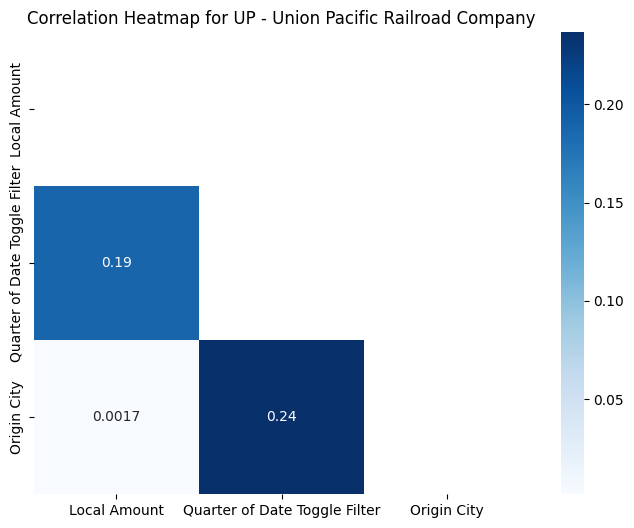

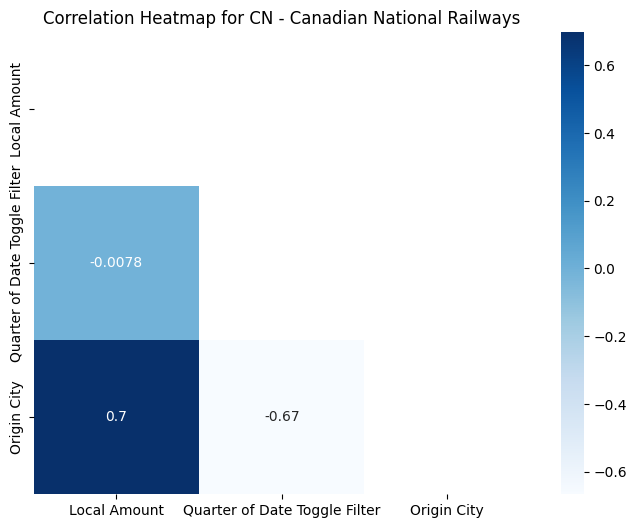

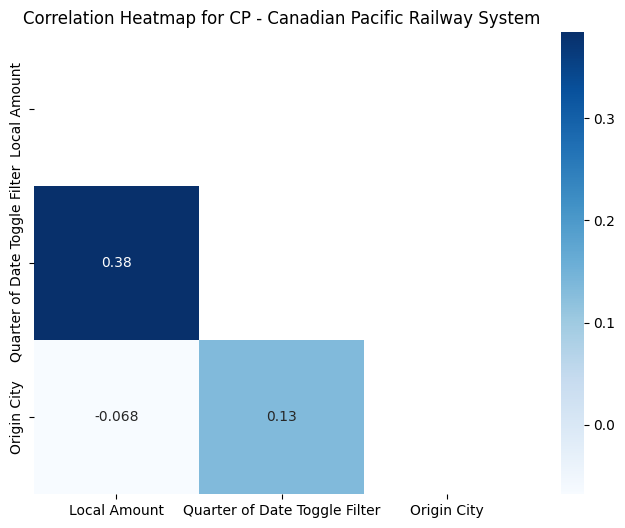

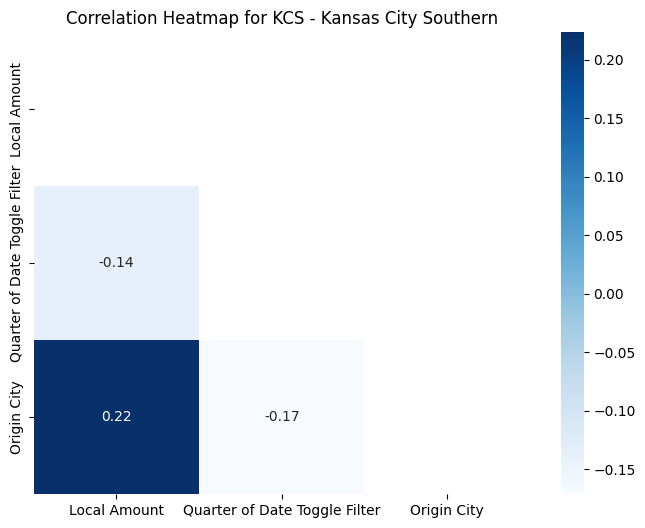

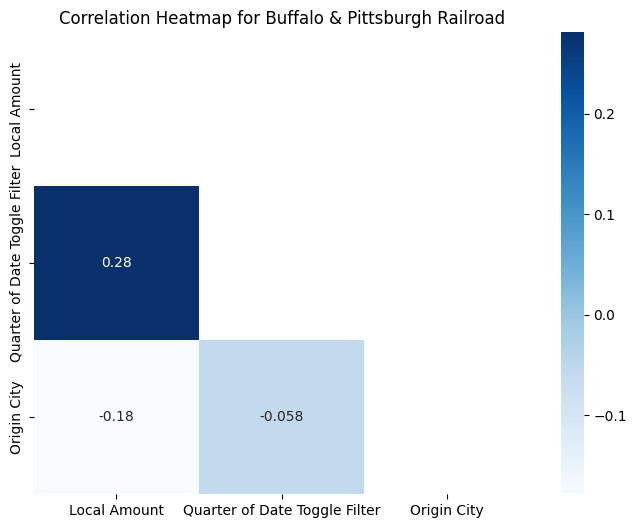

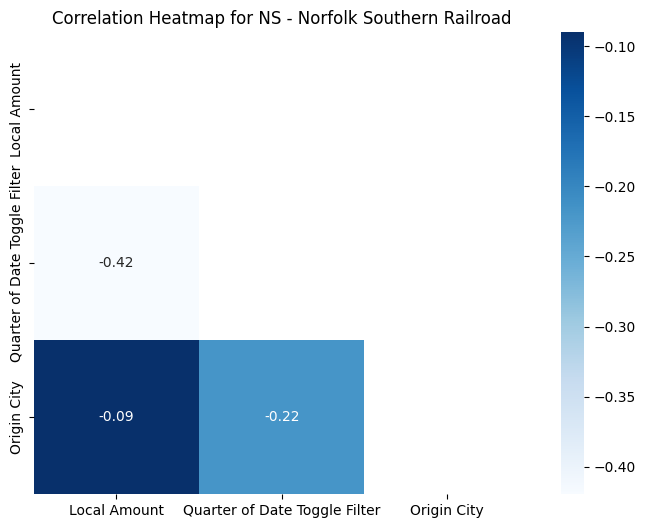

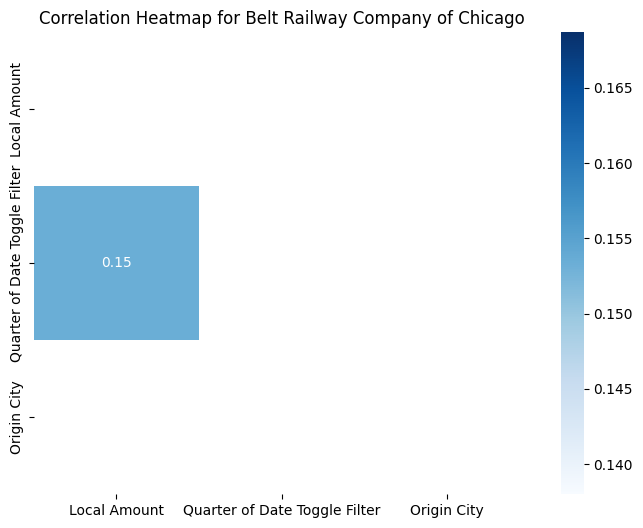

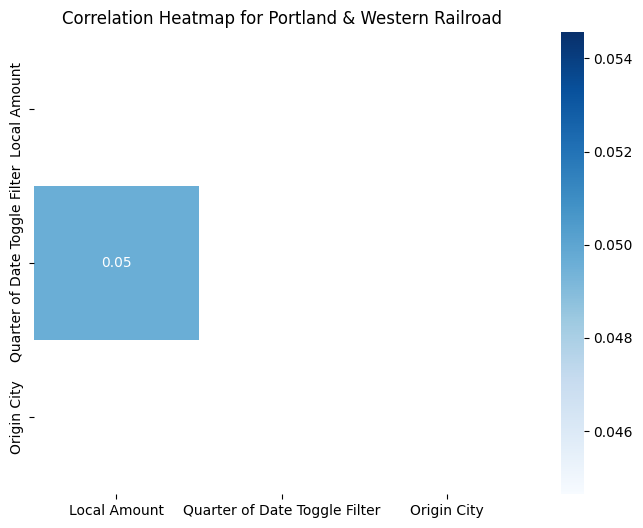

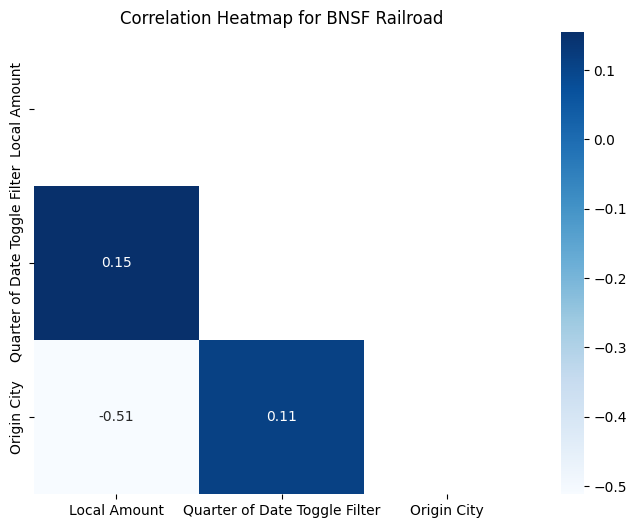

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'df' is your DataFrame containing the data including 'Vendor Name' and other numerical features
# Replace 'Other Numerical Feature 1', 'Other Numerical Feature 2', etc. with actual column names
numerical_features = ['Local Amount', 'Quarter of Date Toggle Filter', 'Origin City']

for vendor in df['Vendor Name'].unique():
    df_vendor = df[df['Vendor Name'] == vendor][numerical_features]

    plt.figure(figsize=(8, 6))  # Adjust figure size as needed
    sns.heatmap(df_vendor.corr(), cmap="Blues", mask=np.triu(df_vendor.corr()), annot=True)
    plt.title(f'Correlation Heatmap for {vendor}')
    plt.show()

In [ ]:
# Add the new column with data if needed
df['Local Amount'] = 0  # Replace 0 with actual data if available

# Verify the change
print(df.columns)

Index(['Quarter of Date Toggle Filter', 'Origin City', 'Vendor Name',
       'Local Amount'],
      dtype='object')


In [ ]:
# Print the names of the origin cities
print("Names of origin cities:", le_origin_city.classes_)

# Print the names of the vendors
print("Names of vendors:", le_vendor_name.classes_)

Names of origin cities: ['ANCHORAGE' 'ANGLETON' 'BATON ROUGE' 'BATONROUGE' 'BEAUMONT' 'BUTLER'
 'BUTLER JCT' 'CALGARY' 'CICERO' 'COTE DES NEIGES' 'EDMONTON' 'FAIRFAX'
 'HOUSTON' 'LEDUC' 'LINNTON' 'LOS ANGELES' 'MONTREAL' 'MONTREALEAST'
 'OLATHE' 'PAVONIA' 'PAVONIA JCT' 'PORT ALLEN' 'SASKATOON' 'TORONTO' nan]
Names of vendors: ['BNSF Railroad' 'Belt Railway Company of Chicago'
 'Buffalo & Pittsburgh Railroad' 'CN - Canadian National Railways'
 'CP - Canadian Pacific Railway System' 'KCS - Kansas City Southern'
 'NS - Norfolk Southern Railroad' 'Portland & Western Railroad'
 'UP - Union Pacific Railroad Company']


Confusion Matrix

In [ ]:
# Initialize LabelEncoders
le_origion_city = LabelEncoder()
le_vendor_name = LabelEncoder()

# Fit and transform the categorical columns, replacing the original columns
df['Origin City'] = le_origin_city.fit_transform(df['Origin City'])
df['Vendor Name'] = le_vendor_name.fit_transform(df['Vendor Name'])

# Select features and target variable, use the encoded columns
X = df[['Quarter of Date Toggle Filter', 'Origin City','Vendor Name', ]]
y = df['Local Amount']

[]

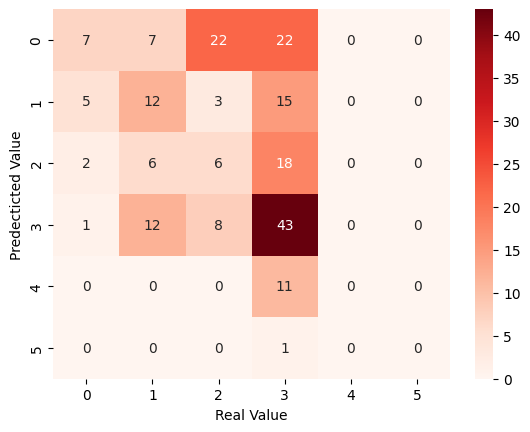

In [ ]:
sns.heatmap(cm, cmap="Reds", annot=True, fmt="G")

plt.xlabel("Real Value")
plt.ylabel("Predecticted Value")
plt.plot()

In [ ]:
(8)/len(y)

0.03571428571428571

Metrics and Classification Report

In [ ]:
cm

array([[ 7,  7, 22, 22,  0,  0],
       [ 5, 12,  3, 15,  0,  0],
       [ 2,  6,  6, 18,  0,  0],
       [ 1, 12,  8, 43,  0,  0],
       [ 0,  0,  0, 11,  0,  0],
       [ 0,  0,  0,  1,  0,  0]])

In [ ]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer

# Choosing X and y
X = df[['Quarter of Date Toggle Filter', 'Origin City','Vendor Name', ]]
y = df['Local Amount']

# Encode categorical features using LabelEncoder
label_encoders = {}
for column in ['Origin City','Vendor Name', ]:
    le = LabelEncoder()
    X[column] = le.fit_transform(X[column])
    label_encoders[column] = le # store the encoder for later use

# Impute missing values using SimpleImputer
imputer = SimpleImputer(strategy='most_frequent')
X = imputer.fit_transform(X)

# Handle NaNs in the target variable 'y'
y = y.fillna(y.value_counts().index[0])

# Instantiating a new object
clf= LogisticRegression()

#Training our model object with our training data
clf.fit(X,y)

# Assessing our model by calculating Accuracy
clf.score(X,y)

<ipython-input-138-9841df4b243a>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[column] = le.fit_transform(X[column])
<ipython-input-138-9841df4b243a>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[column] = le.fit_transform(X[column])


0.5714285714285714

## Including Plant

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
url26 = "/content/IAU.Plant.csv"

# Use pd.read_csv to read the CSV file
df = pd.read_csv(url26)

In [ ]:

df['Plant'].unique()

array(['00UY', '00CX', '01UQ', '00A9', '00CY', '00FG', '02J4', '00FH',
       'USZ9', '02JR', '01UR'], dtype=object)

In [ ]:
df.columns

Index(['Year of Date Toggle Filter', 'Quarter of Date Toggle Filter',
       'Chart Selection', 'Business Line', 'Date Toggle Filter', 'Dest City',
       'Invoice Company', 'Invoice Desk Company', 'Invoice Desk Type',
       'Origin City', 'Origin St', 'div_desc_costcenter', 'Invoice Date',
       'Invoice Num', 'Invoice Type Descr', 'Distinct Invoice Count',
       'Local Amount', 'Invoice Subtype Descr', 'Clearing Date', 'Plant',
       'Car No', 'Vendor Name'],
      dtype='object')

In [ ]:
df

,Year of Date Toggle Filter,Quarter of Date Toggle Filter,Chart Selection,Business Line,Date Toggle Filter,Dest City,Invoice Company,Invoice Desk Company,Invoice Desk Type,Origin City,...,Invoice Date,Invoice Num,Invoice Type Descr,Distinct Invoice Count,Local Amount,Invoice Subtype Descr,Clearing Date,Plant,Car No,Vendor Name
0,2023,2,LUBES,LUBES,5/4/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/5/2023 0:00,3.257887e+08,EM Accessorial,1,510.00,Demurrage,5/4/2023 0:00,00UY,662348.0,UP - Union Pacific Railroad Company
1,2023,2,LUBES,LUBES,5/15/2023 0:00,NaN,EM,EM,Accessorial,BEAUMONT,...,7/11/2022 0:00,3.209563e+08,EM Accessorial,1,1696.00,Demurrage,5/15/2023 0:00,00CX,0.0,UP - Union Pacific Railroad Company
2,2023,2,LUBES,LUBES,5/25/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/28/2023 0:00,3.261905e+08,EM Accessorial,1,340.00,Demurrage,5/25/2023 0:00,00UY,224754.0,UP - Union Pacific Railroad Company
3,2023,2,LUBES,LUBES,5/25/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/28/2023 0:00,3.261905e+08,EM Accessorial,1,340.00,Demurrage,5/25/2023 0:00,00UY,892307.0,UP - Union Pacific Railroad Company
4,2023,2,LUBES,LUBES,5/25/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/28/2023 0:00,3.261905e+08,EM Accessorial,1,255.00,Demurrage,5/25/2023 0:00,00UY,32963.0,UP - Union Pacific Railroad Company
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92,2023,2,LUBES,LUBES,5/25/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/28/2023 0:00,3.261905e+08,EM Accessorial,1,255.00,Demurrage,5/25/2023 0:00,00UY,224104.0,UP - Union Pacific Railroad Company
93,2023,2,LUBES,LUBES,6/12/2023 0:00,BATONROUGE,EM,EM,Accessorial,BATONROUGE,...,5/14/2023 0:00,7.559435e+08,EM Accessorial,1,100.00,Demurrage,6/12/2023 0:00,01UQ,130053.0,CN - Canadian National Railways
94,2024,1,LUBES,LUBES,1/24/2024 0:00,NaN,EM,EM,Accessorial,BEAUMONT,...,10/10/2023 0:00,9.612291e+09,EM Accessorial,1,11340.00,Demurrage,1/24/2024 0:00,00CX,0.0,KCS - Kansas City Southern
95,2024,1,LUBES,LUBES,1/24/2024 0:00,NaN,EM,EM,Accessorial,BEAUMONT,...,10/10/2023 0:00,9.612291e+09,EM Accessorial,1,3780.00,Demurrage,1/24/2024 0:00,00CX,0.0,KCS - Kansas City Southern


Index(['Year of Date Toggle Filter', 'Quarter of Date Toggle Filter',
       'Chart Selection', 'Business Line', 'Date Toggle Filter', 'Dest City',
       'Invoice Company', 'Invoice Desk Company', 'Invoice Desk Type',
       'Origin City', 'Origin St', 'div_desc_costcenter', 'Invoice Date',
       'Invoice Num', 'Invoice Type Descr', 'Distinct Invoice Count',
       'Local Amount', 'Invoice Subtype Descr', 'Clearing Date', 'Plant',
       'Car No', 'Vendor Name'],
      dtype='object')
Shapiro-Wilk Test: Statistic=0.874, p-value=0.000
Sample does not look Gaussian (reject H0)


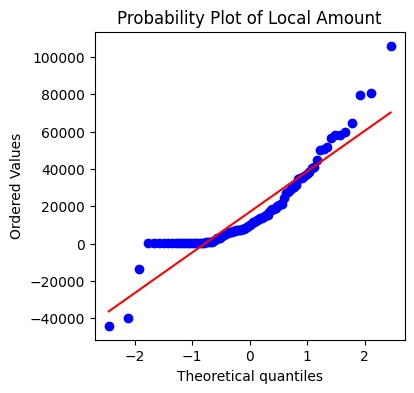

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats

url26 = "/content/IAU.Plant.csv"

# Use pd.read_csv to read the CSV file
df = pd.read_csv(url26)

# Print the available columns to verify the correct column name
print(df.columns)

# Choose the column you want to test for normality
column_to_test = 'Local Amount'  # Replace 'Value' with the actual column name if needed

# Extract the data
data = df[column_to_test]

# Perform the Shapiro-Wilk test
statistic, p_value = stats.shapiro(data)

# Print the results
print(f"Shapiro-Wilk Test: Statistic={statistic:.3f}, p-value={p_value:.3f}")

# Interpret the results
alpha = 0.05  # Set your significance level
if p_value > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

# Create a probability plot
fig, ax = plt.subplots(figsize=(4, 4))
stats.probplot(data, plot=ax)
plt.title(f"Probability Plot of {column_to_test}")
plt.show()

Mean Squared Error: 120263273.1287
R-squared: 0.4973
Feature: Quarter of Date Toggle Filter, Importance: 0.0680
Feature: Origin City, Importance: 0.0345
Feature: Vendor Name , Importance: 0.5427
Feature: Plant, Importance: 0.3548


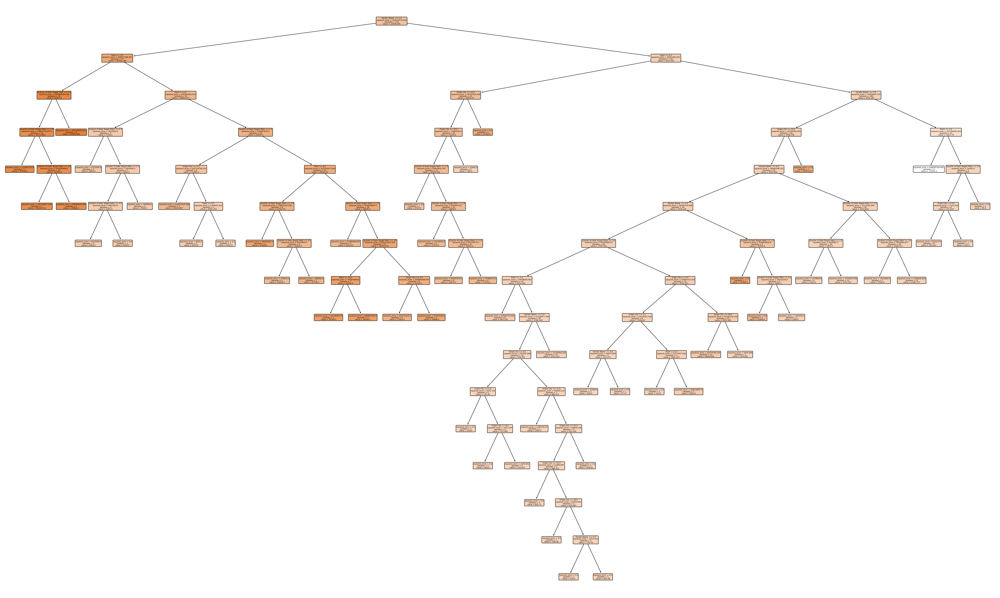


Decision tree structure:
Node 0 is a split node.
	Split feature: 2 with threshold 2.5
	Predicted value: [[12036.0047486]]
	Left child: 1, Right child: 38
Node 1 is a split node.
	Split feature: 3 with threshold 3.5
	Predicted value: [[28762.78947368]]
	Left child: 2, Right child: 9
Node 2 is a split node.
	Split feature: 0 with threshold 3.5
	Predicted value: [[48475.5]]
	Left child: 3, Right child: 8
Node 3 is a split node.
	Split feature: 0 with threshold 1.5
	Predicted value: [[45737.83333333]]
	Left child: 4, Right child: 5
Node 4 is a leaf node.
	Predicted value: [[47162.]]
Node 5 is a split node.
	Split feature: 0 with threshold 2.5
	Predicted value: [[45453.]]
	Left child: 6, Right child: 7
Node 6 is a leaf node.
	Predicted value: [[45226.71428571]]
Node 7 is a leaf node.
	Predicted value: [[45981.]]
Node 8 is a leaf node.
	Predicted value: [[53950.83333333]]
Node 9 is a split node.
	Split feature: 3 with threshold 6.0
	Predicted value: [[19664.61538462]]
	Left child: 10, Right

In [ ]:
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, r2_score
import joblib
import matplotlib.pyplot as plt

# Load the dataset
data =df

# Initialize LabelEncoders
le_origin_city = LabelEncoder()
le_vendor_name = LabelEncoder()
le_plant = LabelEncoder()

# Fit and transform the categorical columns, replacing the original columns
df['Origin City'] = le_origin_city.fit_transform(df['Origin City'])
df['Vendor Name '] = le_vendor_name.fit_transform(df['Vendor Name'])
df['Plant'] = le_plant.fit_transform(df['Plant'])

# Select features and target variable, use the encoded columns
X = df[['Quarter of Date Toggle Filter', 'Origin City','Vendor Name ', 'Plant']]
y = df['Local Amount']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the model
model = DecisionTreeRegressor(random_state=42)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse:.4f}')
print(f'R-squared: {r2:.4f}')

# Get feature importances
importances = model.feature_importances_
feature_names = X.columns

# Print feature importances
for feature, importance in zip(feature_names, importances):
    print(f'Feature: {feature}, Importance: {importance:.4f}')

# Save the model
joblib.dump(model, 'demurrage_model.pkl')

# Load the model
loaded_model = joblib.load('demurrage_model.pkl')

# Predict using the loaded model
loaded_model.predict(X_test)

# Plot and display the decision tree with values
plt.figure(figsize=(50,30))
plot_tree(model, feature_names=feature_names, filled=True, rounded=True, impurity=True)
plt.show()

# Extract and print values and efficiencies for each node
n_nodes = model.tree_.node_count
children_left = model.tree_.children_left
children_right = model.tree_.children_right
feature = model.tree_.feature
threshold = model.tree_.threshold
value = model.tree_.value

print("\nDecision tree structure:")
for i in range(n_nodes):
    if children_left[i] == children_right[i]:  # leaf node
        print(f"Node {i} is a leaf node.")
        print(f"\tPredicted value: {value[i]}")
    else:
        print(f"Node {i} is a split node.")
        print(f"\tSplit feature: {feature[i]} with threshold {threshold[i]}")
        print(f"\tPredicted value: {value[i]}")
        print(f"\tLeft child: {children_left[i]}, Right child: {children_right[i]}")

In [ ]:
df['Vendor Name'].unique()

array(['UP - Union Pacific Railroad Company',
       'CN - Canadian National Railways',
       'CP - Canadian Pacific Railway System',
       'KCS - Kansas City Southern', 'Buffalo & Pittsburgh Railroad',
       'NS - Norfolk Southern Railroad',
       'Belt Railway Company of Chicago', 'Portland & Western Railroad',
       'BNSF Railroad'], dtype=object)

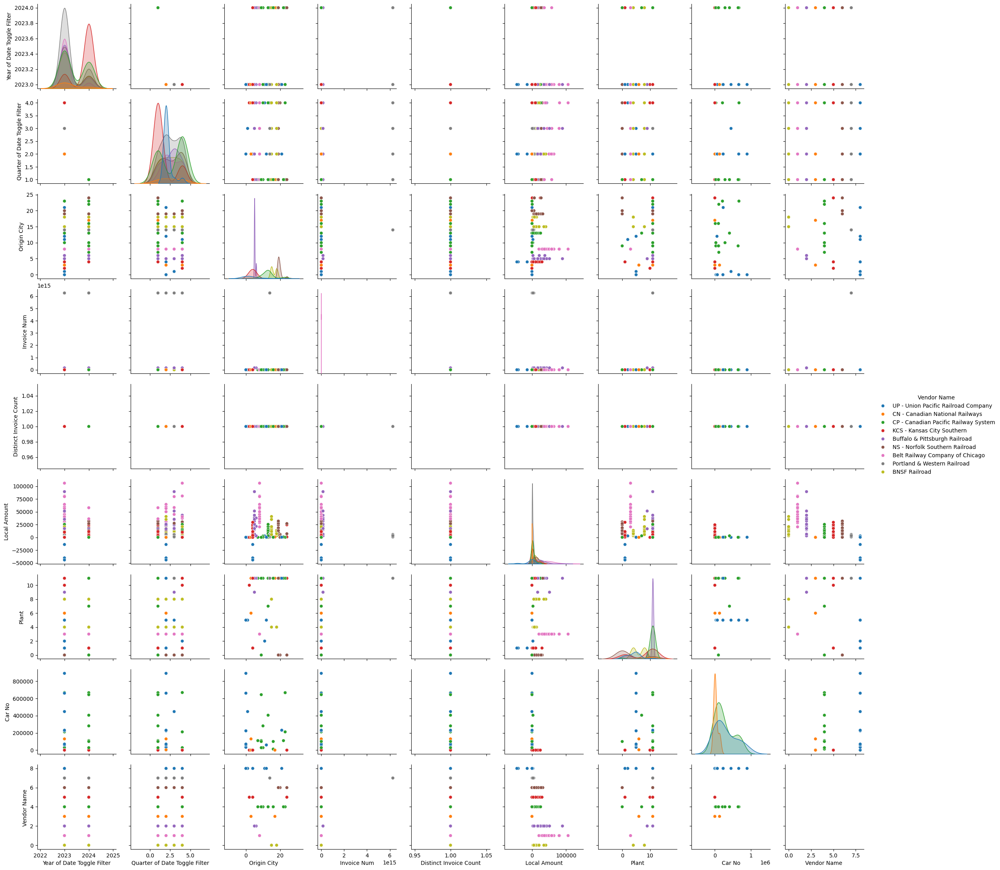

In [ ]:
import seaborn as sns
sns.pairplot(df, hue='Vendor Name')
plt.show()

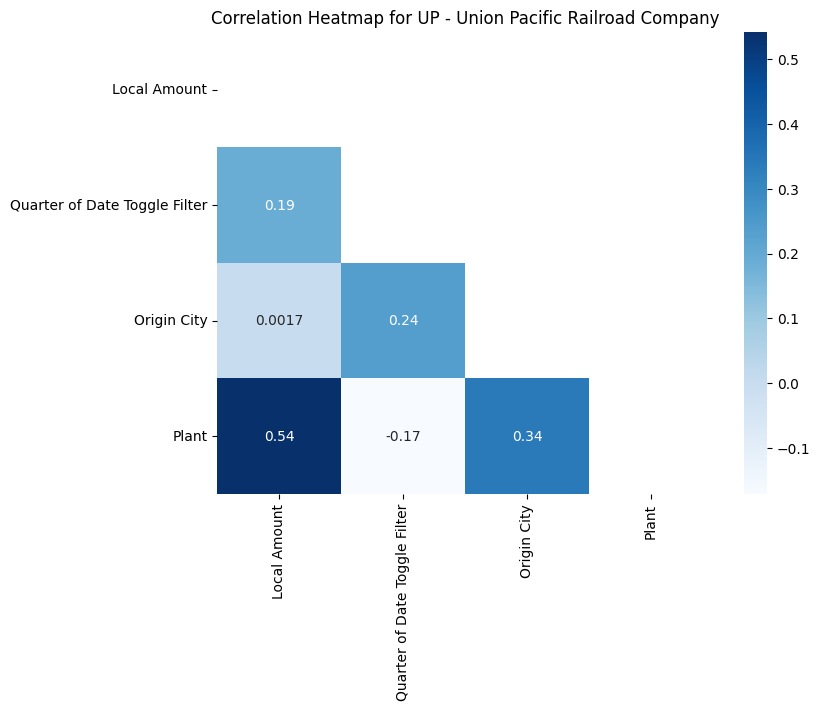

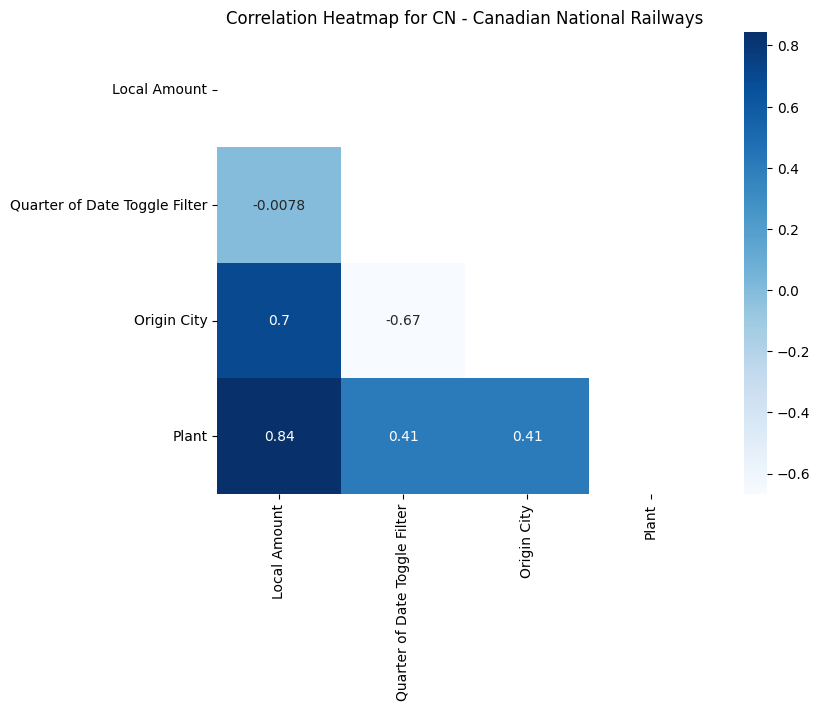

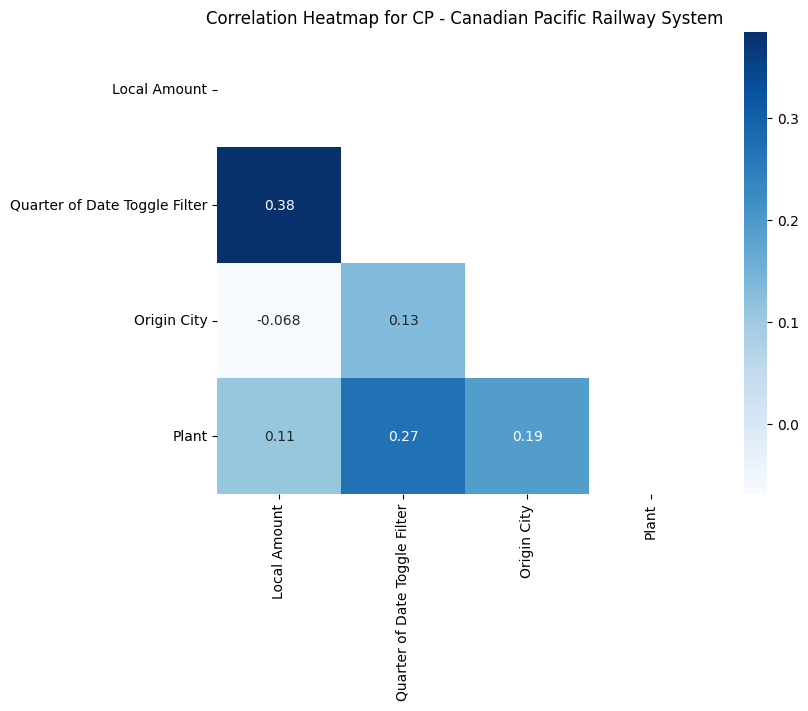

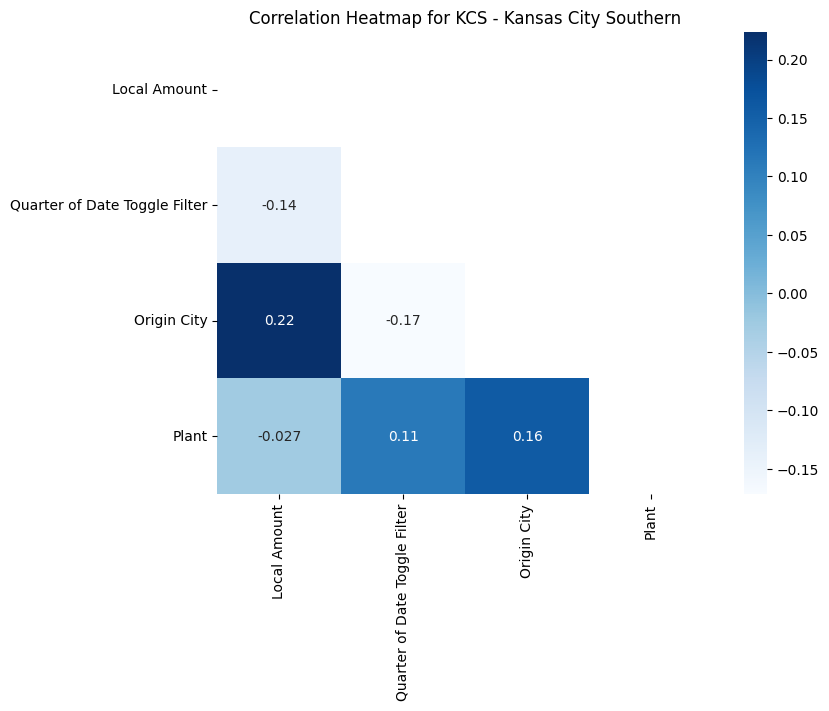

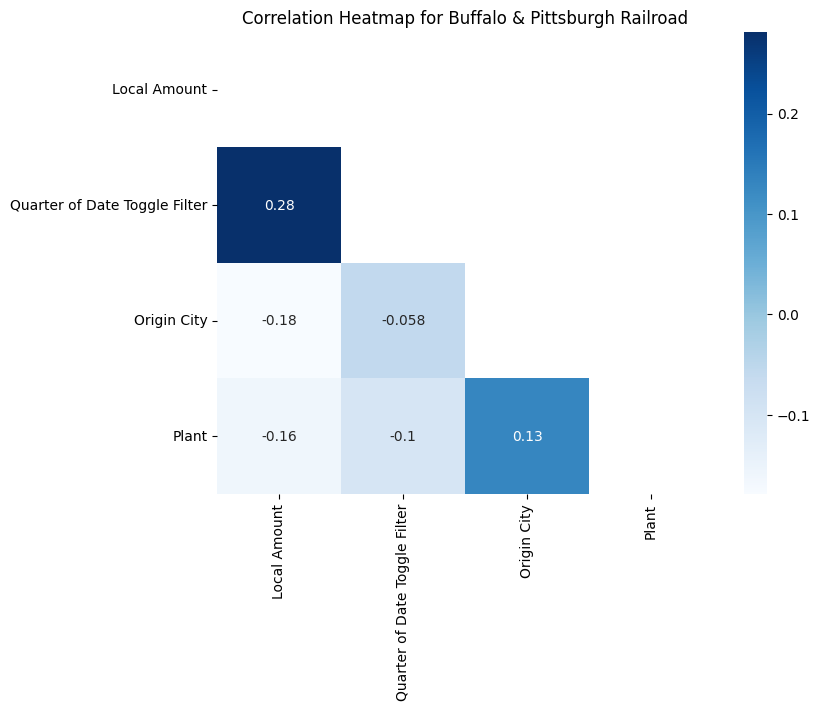

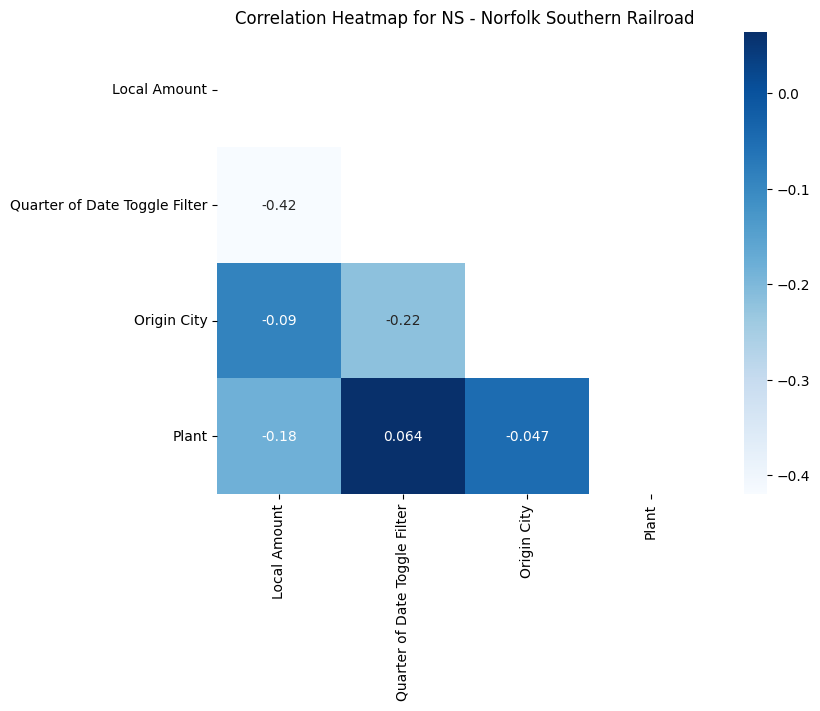

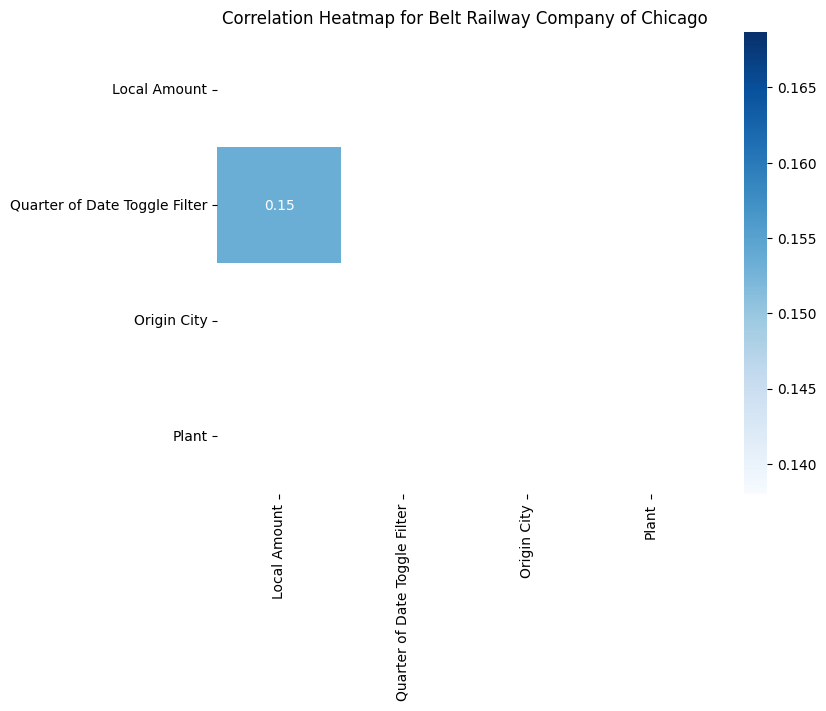

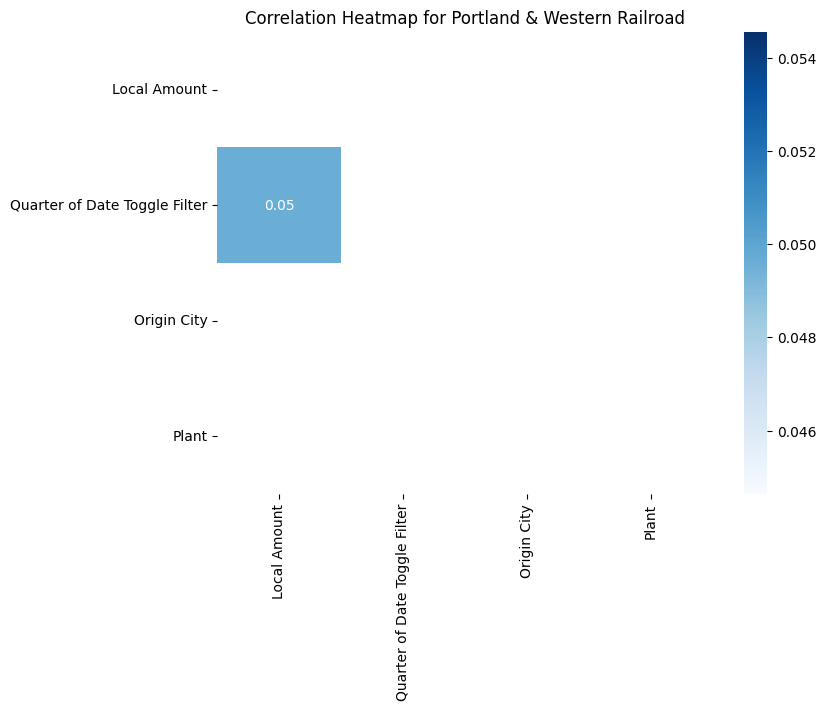

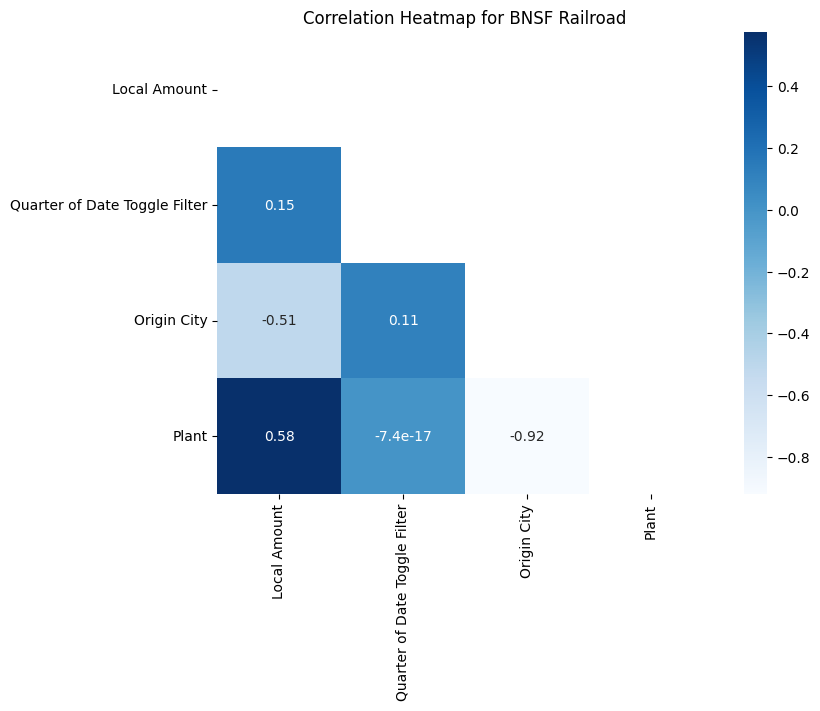

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'df' is your DataFrame containing the data including 'Vendor Name' and other numerical features
# Replace 'Other Numerical Feature 1', 'Other Numerical Feature 2', etc. with actual column names
numerical_features = ['Local Amount', 'Quarter of Date Toggle Filter', 'Origin City', "Plant"]

for vendor in df['Vendor Name'].unique():
    df_vendor = df[df['Vendor Name'] == vendor][numerical_features]

    plt.figure(figsize=(8, 6))  # Adjust figure size as needed
    sns.heatmap(df_vendor.corr(), cmap="Blues", mask=np.triu(df_vendor.corr()), annot=True)
    plt.title(f'Correlation Heatmap for {vendor}')
    plt.show()

In [ ]:
tdf.describe()

,Year of Date Toggle Filter,Quarter of Date Toggle Filter,Invoice Num,Distinct Invoice Count,Local Amount,Car No
count,97.000000,97.000000,9.700000e+01,97.0,97.000000,20.000000
mean,2023.247423,2.402062,3.189640e+12,1.0,16912.330619,198748.000000
std,0.433756,1.105477,2.204138e+13,0.0,23014.171937,270312.603563
min,2023.000000,1.000000,2.023188e+07,1.0,-44080.000000,0.000000
25%,2023.000000,2.000000,3.252686e+08,1.0,960.000000,0.000000
50%,2023.000000,2.000000,6.660742e+08,1.0,9720.000000,65080.000000
75%,2023.000000,3.000000,2.256161e+09,1.0,27660.000000,269939.750000
max,2024.000000,4.000000,1.543140e+14,1.0,106040.000000,892307.000000


In [ ]:
df['Plant'].unique()

array(['00UY', '00CX', '01UQ', '00A9', '00CY', '00FG', '02J4', '00FH',
       'USZ9', '02JR', '01UR'], dtype=object)

In [ ]:
# Print the names of the origin cities
print("Names of origin cities:", le_origin_city.classes_)

# Print the names of the vendors
print("Names of vendors:", le_vendor_name.classes_)

print("Names of Plants:", le_plant.classes_)


Names of origin cities: ['ANCHORAGE' 'ANGLETON' 'BATON ROUGE' 'BATONROUGE' 'BEAUMONT' 'BUTLER'
 'CICERO' 'COTE DES NEIGES' 'FAIRFAX' 'HOUSTON' 'LEDUC' 'LOS ANGELES'
 'OLATHE' 'PAVONIA' 'PAVONIA JCT' nan]
Names of vendors: ['BNSF Railroad' 'Belt Railway Company of Chicago'
 'Buffalo & Pittsburgh Railroad' 'CN - Canadian National Railways'
 'CP - Canadian Pacific Railway System' 'KCS - Kansas City Southern'
 'NS - Norfolk Southern Railroad' 'UP - Union Pacific Railroad Company']
Names of Plants: ['00A9' '00CX' '00CY' '00FG' '00FH' '00UY' '01UQ' '01UR' '02J4' '02JR'
 'USZ9']


## Destination City

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
url28 ="/content/IAU.Destination City.csv"

# Use pd.read_csv to read the CSV file
df = pd.read_csv(url28)

In [ ]:
df_clean=df.iloc[:11]  # Access the 10th row of the DataFrame

In [ ]:
df_clean

,Year of Date Toggle Filter,Quarter of Date Toggle Filter,Chart Selection,Business Line,Date Toggle Filter,Dest City,Invoice Company,Invoice Desk Company,Invoice Desk Type,Origin City,...,Invoice Date,Invoice Num,Invoice Type Descr,Distinct Invoice Count,Local Amount,Invoice Subtype Descr,Clearing Date,Plant,Car No,Vendor Name
0,2023.0,2.0,LUBES,LUBES,5/4/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/5/2023 0:00,3.257887e+08,EM Accessorial,1.0,510.0,Demurrage,5/4/2023 0:00,00UY,662348.0,UP - Union Pacific Railroad Company
1,2023.0,2.0,LUBES,LUBES,5/25/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/28/2023 0:00,3.261905e+08,EM Accessorial,1.0,340.0,Demurrage,5/25/2023 0:00,00UY,224754.0,UP - Union Pacific Railroad Company
2,2023.0,2.0,LUBES,LUBES,5/25/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/28/2023 0:00,3.261905e+08,EM Accessorial,1.0,340.0,Demurrage,5/25/2023 0:00,00UY,892307.0,UP - Union Pacific Railroad Company
3,2023.0,2.0,LUBES,LUBES,5/25/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/28/2023 0:00,3.261905e+08,EM Accessorial,1.0,255.0,Demurrage,5/25/2023 0:00,00UY,32963.0,UP - Union Pacific Railroad Company
4,2023.0,3.0,LUBES,LUBES,9/26/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANGLETON,...,8/28/2023 0:00,3.282886e+08,EM Accessorial,1.0,85.0,Demurrage,9/26/2023 0:00,00UY,448005.0,UP - Union Pacific Railroad Company
5,2024.0,1.0,LUBES,LUBES,2/26/2024 0:00,PAVONIA,EM,EM,Accessorial,PAVONIA,...,2/12/2024 0:00,3.043509e+09,EM Accessorial,1.0,27000.0,Demurrage,2/26/2024 0:00,00A9,NaN,NS - Norfolk Southern Railroad
6,2024.0,1.0,LUBES,LUBES,2/26/2024 0:00,PAVONIA,EM,EM,Accessorial,PAVONIA,...,2/12/2024 0:00,3.043509e+09,EM Accessorial,1.0,7140.0,Demurrage,2/26/2024 0:00,00A9,NaN,NS - Norfolk Southern Railroad
7,2023.0,2.0,LUBES,LUBES,5/9/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/10/2023 0:00,3.258618e+08,EM Accessorial,1.0,425.0,Demurrage,5/9/2023 0:00,00UY,70209.0,UP - Union Pacific Railroad Company
8,2023.0,2.0,LUBES,LUBES,5/25/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/28/2023 0:00,3.261905e+08,EM Accessorial,1.0,255.0,Demurrage,5/25/2023 0:00,00UY,661385.0,UP - Union Pacific Railroad Company
9,2023.0,2.0,LUBES,LUBES,5/25/2023 0:00,ANCHORAGE,EM,EM,Accessorial,ANCHORAGE,...,4/28/2023 0:00,3.261905e+08,EM Accessorial,1.0,255.0,Demurrage,5/25/2023 0:00,00UY,224104.0,UP - Union Pacific Railroad Company


In [ ]:
df.columns

Index(['Year of Date Toggle Filter', 'Quarter of Date Toggle Filter',
       'Chart Selection', 'Business Line', 'Date Toggle Filter', 'Dest City',
       'Invoice Company', 'Invoice Desk Company', 'Invoice Desk Type',
       'Origin City', 'Origin St', 'div_desc_costcenter', 'Invoice Date',
       'Invoice Num', 'Invoice Type Descr', 'Distinct Invoice Count',
       'Local Amount', 'Invoice Subtype Descr', 'Clearing Date', 'Plant',
       'Car No', 'Vendor Name'],
      dtype='object')

<ipython-input-237-7ffed2f5e561>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['Dest City'] = le_dest_city.fit_transform(df_clean['Dest City']) # Use df_clean instead of df
<ipython-input-237-7ffed2f5e561>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['Origin City'] = le_origin_city.fit_transform(df_clean['Origin City'])
<ipython-input-237-7ffed2f5e561>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Mean Squared Error: 131486397.6667
R-squared: 0.1649
Feature: Quarter of Date Toggle Filter, Importance: 0.0000
Feature: Dest City, Importance: 0.0000
Feature: Vendor Name, Importance: 0.0000
Feature: Plant, Importance: 0.9982
Feature: Origin City, Importance: 0.0018


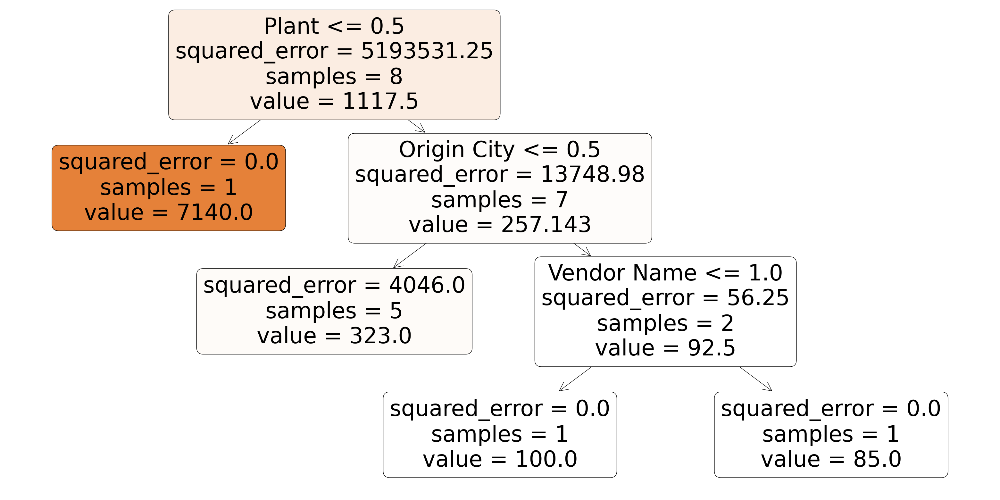


Decision tree structure:
Node 0 is a split node.
	Split feature: 3 with threshold 0.5
	Predicted value: [[1117.5]]
	Left child: 1, Right child: 2
Node 1 is a leaf node.
	Predicted value: [[7140.]]
Node 2 is a split node.
	Split feature: 4 with threshold 0.5
	Predicted value: [[257.14285714]]
	Left child: 3, Right child: 4
Node 3 is a leaf node.
	Predicted value: [[323.]]
Node 4 is a split node.
	Split feature: 2 with threshold 1.0
	Predicted value: [[92.5]]
	Left child: 5, Right child: 6
Node 5 is a leaf node.
	Predicted value: [[100.]]
Node 6 is a leaf node.
	Predicted value: [[85.]]


In [ ]:
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, r2_score
import joblib
import matplotlib.pyplot as plt

# Load the dataset
data =df_clean

# Initialize LabelEncoders
le_origin_city = LabelEncoder()
le_vendor_name = LabelEncoder()
le_plant = LabelEncoder()
le_dest_city= LabelEncoder()

# Fit and transform the categorical columns, replacing the original columns
df_clean['Dest City'] = le_dest_city.fit_transform(df_clean['Dest City']) # Use df_clean instead of df
df_clean['Origin City'] = le_origin_city.fit_transform(df_clean['Origin City'])
df_clean['Vendor Name'] = le_vendor_name.fit_transform(df_clean['Vendor Name'])
df_clean['Plant'] = le_plant.fit_transform(df_clean['Plant'])

# Select features and target variable, use the encoded columns
X = df_clean[['Quarter of Date Toggle Filter', 'Dest City','Vendor Name', 'Plant', 'Origin City']]
y = df_clean['Local Amount']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the model
model = DecisionTreeRegressor(random_state=42)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse:.4f}')
print(f'R-squared: {r2:.4f}')

# Get feature importances
importances = model.feature_importances_
feature_names = X.columns

# Print feature importances
for feature, importance in zip(feature_names, importances):
    print(f'Feature: {feature}, Importance: {importance:.4f}')

# Save the model
joblib.dump(model, 'demurrage_model.pkl')

# Load the model
loaded_model = joblib.load('demurrage_model.pkl')

# Predict using the loaded model
loaded_model.predict(X_test)

# Plot and display the decision tree with values
plt.figure(figsize=(40,20))
plot_tree(model, feature_names=feature_names, filled=True, rounded=True, impurity=True)
plt.show()

# Extract and print values and efficiencies for each node
n_nodes = model.tree_.node_count
children_left = model.tree_.children_left
children_right = model.tree_.children_right
feature = model.tree_.feature
threshold = model.tree_.threshold
value = model.tree_.value

print("\nDecision tree structure:")
for i in range(n_nodes):
    if children_left[i] == children_right[i]:  # leaf node
        print(f"Node {i} is a leaf node.")
        print(f"\tPredicted value: {value[i]}")
    else:
        print(f"Node {i} is a split node.")
        print(f"\tSplit feature: {feature[i]} with threshold {threshold[i]}")
        print(f"\tPredicted value: {value[i]}")
        print(f"\tLeft child: {children_left[i]}, Right child: {children_right[i]}")

In [ ]:
df['Dest City'].unique() # Replace 'Dest.city' with 'Dest City'

array(['ANCHORAGE', 'PAVONIA', 'BATONROUGE', nan], dtype=object)

In [ ]:
# Print the names of the origin cities
print("Names of origin cities:", le_origin_city.classes_)

# Print the names of the vendors
print("Names of vendors:", le_vendor_name.classes_)

print("Names of Plants:", le_plant.classes_)

print("Names of Destinations:", le_dest_city.classes_)

Names of origin cities: ['ANCHORAGE' 'ANGLETON' 'BATONROUGE' 'PAVONIA']
Names of vendors: ['CN - Canadian National Railways' 'NS - Norfolk Southern Railroad'
 'UP - Union Pacific Railroad Company']
Names of Plants: ['00A9' '00UY' '01UQ']
Names of Destinations: ['ANCHORAGE' 'BATONROUGE' 'PAVONIA']


## Snowflake Model

In [ ]:
import pandas as pd
df = pd.read_csv("/content/RPO data set.1.csv")

In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv('RPO data set.1.csv')

# Display the first few rows of the dataframe
print(df.head())

# Check for missing values
missing_values = df.isnull().sum()
print("\nMissing values in each column:")
print(missing_values)

# Check for inconsistent number of fields in each row
with open('RPO data set.1.csv', 'r') as file:
    lines = file.readlines()
    num_fields = [len(line.split(',')) for line in lines]
    inconsistent_rows = [i for i, count in enumerate(num_fields) if count != num_fields[0]]

print("\nRows with inconsistent number of fields:")
print(inconsistent_rows)


                     UPDATE_DATE      CAR_ID CAR_INIT      CAR_NO  \
0  2024-07-30T10:22:07.498-03:00  XOMX124124     XOMX   11/2/2239   
1  2024-07-30T10:22:07.498-03:00  XOMX124134     XOMX  11/12/2239   
2  2024-07-30T10:22:07.498-03:00  XOMX124137     XOMX  11/15/2239   
3  2024-07-30T10:22:07.498-03:00  XOMX124143     XOMX  11/21/2239   
4  2024-07-30T10:22:07.498-03:00  XOMX124146     XOMX  11/24/2239   

              SHIP_DATE_TIME FLEET_ID BUSINESS_GROUP DEPT_ID COST_CENTER  \
0  2024-05-24T00:00:00-07:00     LDPE           BRLD      PE  C021205906   
1  2024-06-17T00:00:00-07:00    LLDPE           BMLL      PE  C021205906   
2  2024-05-24T00:00:00-07:00     LDPE           BRLD      PE  C021205906   
3  2024-07-15T00:00:00-07:00    LLDPE           BMLL      PE  C021205906   
4  2024-04-12T00:00:00-07:00    LLDPE           BMLL      PE  C021205906   

  CAR_MECH_FLEET_ID  ... YM_PLANT_ID YM_CAR_STATUS YM_LE_IND SIT_YARD  \
0              LDPE  ...           0             0     

In [ ]:
df_real = df = pd.read_csv('RPO data set.1.csv')
print(df_real.head)

<bound method NDFrame.head of                       UPDATE_DATE      CAR_ID CAR_INIT      CAR_NO  \
0   2024-07-30T10:22:07.498-03:00  XOMX124124     XOMX   11/2/2239   
1   2024-07-30T10:22:07.498-03:00  XOMX124134     XOMX  11/12/2239   
2   2024-07-30T10:22:07.498-03:00  XOMX124137     XOMX  11/15/2239   
3   2024-07-30T10:22:07.498-03:00  XOMX124143     XOMX  11/21/2239   
4   2024-07-30T10:22:07.498-03:00  XOMX124146     XOMX  11/24/2239   
..                            ...         ...      ...         ...   
91  2024-07-30T10:22:07.498-03:00  XOMX130075     XOMX   2/17/2256   
92  2024-07-30T10:22:07.498-03:00  XOMX130076     XOMX   2/18/2256   
93  2024-07-30T10:22:07.498-03:00  XOMX130077     XOMX   2/19/2256   
94  2024-07-30T10:22:07.498-03:00  XOMX130078     XOMX   2/20/2256   
95  2024-07-30T10:22:07.498-03:00  XOMX130079     XOMX   2/21/2256   

               SHIP_DATE_TIME FLEET_ID BUSINESS_GROUP DEPT_ID COST_CENTER  \
0   2024-05-24T00:00:00-07:00     LDPE           BRL

In [ ]:
df_real.columns

Index(['UPDATE_DATE', 'CAR_ID', 'CAR_INIT', 'CAR_NO', 'SHIP_DATE_TIME',
       'FLEET_ID', 'BUSINESS_GROUP', 'DEPT_ID', 'COST_CENTER',
       'CAR_MECH_FLEET_ID',
       ...
       'YM_PLANT_ID', 'YM_CAR_STATUS', 'YM_LE_IND', 'SIT_YARD', 'LE_STATUS_FM',
       'DEFINITION', 'ASSOCIATED_AREA', 'ASSOCIATED_AREA_GROUPING', 'DEF_DATE',
       'DEF_AGE'],
      dtype='object', length=138)

## First Pass Using Time Oriented Data

Mean Squared Error: 363.3000
R-squared: 0.9264
Feature: UPDATE_DATE, Importance: 0.0000
Feature: CAR_ID, Importance: 0.0002
Feature: CAR_NO, Importance: 0.0001
Feature: SHIP_DATE_TIME, Importance: 0.0000
Feature: FLEET_ID, Importance: 0.0000
Feature: BUSINESS_GROUP, Importance: 0.0000
Feature: DEPT_ID, Importance: 0.0000
Feature: COST_CENTER, Importance: 0.0000
Feature: CAR_MECH_FLEET_ID, Importance: 0.0000
Feature: CAR_MECH_BUSINESS_GROUP, Importance: 0.0002
Feature: CM_BG_DEPT_ID, Importance: 0.0000
Feature: CM_BG_COST_CENTER, Importance: 0.0000
Feature: CLM_DATE_TIME, Importance: 0.0921
Feature: CLM_LE, Importance: 0.0000
Feature: CLM_ROAD, Importance: 0.0000
Feature: CLM_SIGHT_CODE, Importance: 0.0003
Feature: CLM_DEST_STATE, Importance: 0.0000
Feature: CUST_TYPE, Importance: 0.0000
Feature: CUST_NAME, Importance: 0.0000
Feature: ORIG_CITY, Importance: 0.0000
Feature: ORIG_STATE, Importance: 0.0001
Feature: DEST_CITY, Importance: 0.0001
Feature: DEST_STATE, Importance: 0.0346
Featu

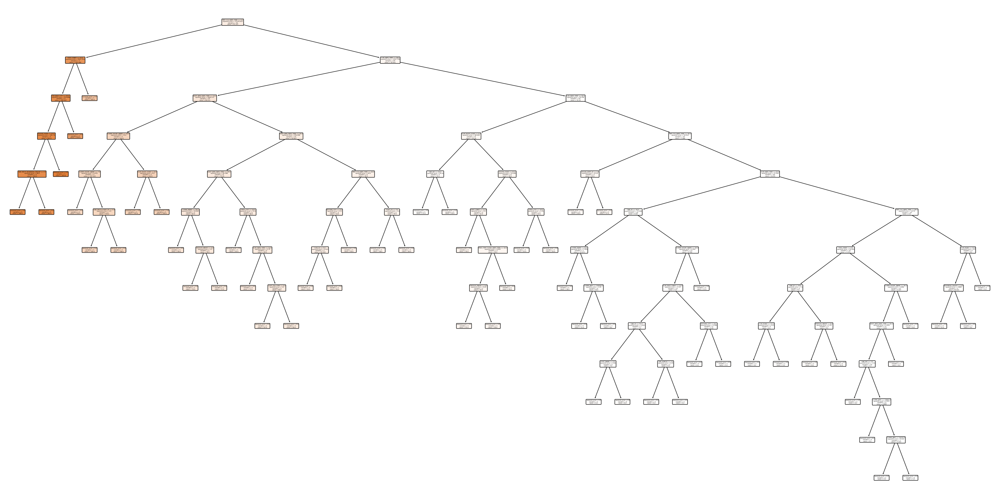


Decision tree structure:
Node 0 is a split node.
	Split feature: 32 with threshold 6.5
	Predicted value: [[61.19736842]]
	Left child: 1, Right child: 10
Node 1 is a split node.
	Split feature: 22 with threshold 15.5
	Predicted value: [[363.28571429]]
	Left child: 2, Right child: 9
Node 2 is a split node.
	Split feature: 23 with threshold 39.5
	Predicted value: [[389.66666667]]
	Left child: 3, Right child: 8
Node 3 is a split node.
	Split feature: 25 with threshold 57.0
	Predicted value: [[401.8]]
	Left child: 4, Right child: 7
Node 4 is a split node.
	Split feature: 9 with threshold 2.5
	Predicted value: [[394.]]
	Left child: 5, Right child: 6
Node 5 is a leaf node.
	Predicted value: [[398.]]
Node 6 is a leaf node.
	Predicted value: [[382.]]
Node 7 is a leaf node.
	Predicted value: [[433.]]
Node 8 is a leaf node.
	Predicted value: [[329.]]
Node 9 is a leaf node.
	Predicted value: [[205.]]
Node 10 is a split node.
	Split feature: 12 with threshold 28.5
	Predicted value: [[30.55072464]]

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, r2_score
import joblib
import matplotlib.pyplot as plt


# Select relevant columns for the model
relevant_columns_e3 = ['UPDATE_DATE', 'CAR_ID', 'CAR_NO', "SHIP_DATE_TIME",
                    'FLEET_ID', 'BUSINESS_GROUP', 'DEPT_ID', 'COST_CENTER',
                     'CAR_MECH_FLEET_ID', 'CAR_MECH_BUSINESS_GROUP', 'CM_BG_DEPT_ID',
                    'CM_BG_COST_CENTER', 'CLM_DATE_TIME', 'CLM_LE', 'CLM_ROAD',
                    'CLM_SIGHT_CODE','CLM_DEST_STATE', 'CUST_TYPE', 'CUST_NAME',
                    'ORIG_CITY', 'ORIG_STATE',  'DEST_CITY', 'DEST_STATE', 'RELEASE_CITY',
                    'RETURN_CITY', 'ROUTE_CODE', 'ROUTE_DESCRIPTION', 'ORIG_CARRIER', 'DLV_CARRIER',
                    'CUST_DLV_TYPE', 'DEST_ARR_DATE_TIME', 'CUST_REL_TYPE', 'TRIP_CLS_DATE_TIME', 'PREV_TRIP_CLOSE_DATE_TIME',
                    'COMM_NAME', 'COMM_SHORT_NAME', 'COMM_AMT', 'SHIPMENT_TYPE', 'CAR_STATUS', 'ONE_WAY_ROUND',
                    'FREIGHT_PAYER', 'SUPPLIER_SHIPMENT','DEF_AGE']

# Read the CSV file, ensuring all relevant columns are present
df = pd.read_csv('RPO data set.1.csv')  # Replace 'RPO data set.1.csv' with the actual file path

# Check if all relevant columns are in the DataFrame
missing_columns = set(relevant_columns_e3) - set(df.columns)
if missing_columns:
    print(f"Warning: The following columns are missing from the DataFrame: {missing_columns}")

# Filter the dataframe to include only the relevant columns that are present
df = df[[col for col in relevant_columns if col in df.columns]]

# Initialize LabelEncoders for categorical columns
label_encoders = {}
for column in df.select_dtypes(include=['object']).columns:
    # Check if the column is a Series (1-dimensional)
    if isinstance(df[column], pd.Series):
        le = LabelEncoder()
        df[column] = le.fit_transform(df[column])
        label_encoders[column] = le
    else:
        print(f"Skipping column '{column}' because it is not a 1-dimensional Series.")

# Select features and target variable (assuming DEF_AGE is the target variable)
X = df.drop('DEF_AGE', axis=1)  # Select all columns except 'DEF_AGE'
y = df['DEF_AGE']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the model
model = DecisionTreeRegressor(random_state=42)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse:.4f}')
print(f'R-squared: {r2:.4f}')

# Get feature
# Get feature importances
importances = model.feature_importances_
feature_names = X.columns

# Print feature importances
for feature, importance in zip(feature_names, importances):
    print(f'Feature: {feature}, Importance: {importance:.4f}')

# Save the model
joblib.dump(model, 'decision_tree_model.pkl')

loaded_model = joblib.load('decision_tree_model.pkl')

# Predict using the loaded model
loaded_model.predict(X_test)

# Plot and display the decision tree with values
plt.figure(figsize=(40,20))
plot_tree(model, feature_names=feature_names, filled=True, rounded=True, impurity=True)
plt.show()

# Extract and print values and efficiencies for each node
n_nodes = model.tree_.node_count
children_left = model.tree_.children_left
children_right = model.tree_.children_right
feature = model.tree_.feature
threshold = model.tree_.threshold
value = model.tree_.value


print("\nDecision tree structure:")
for i in range(n_nodes):
    if children_left[i] == children_right[i]:  # leaf node
        print(f"Node {i} is a leaf node.")
        print(f"\tPredicted value: {value[i]}")
    else:
        print(f"Node {i} is a split node.")
        print(f"\tSplit feature: {feature[i]} with threshold {threshold[i]}")
        print(f"\tPredicted value: {value[i]}")
        print(f"\tLeft child: {children_left[i]}, Right child: {children_right[i]}")

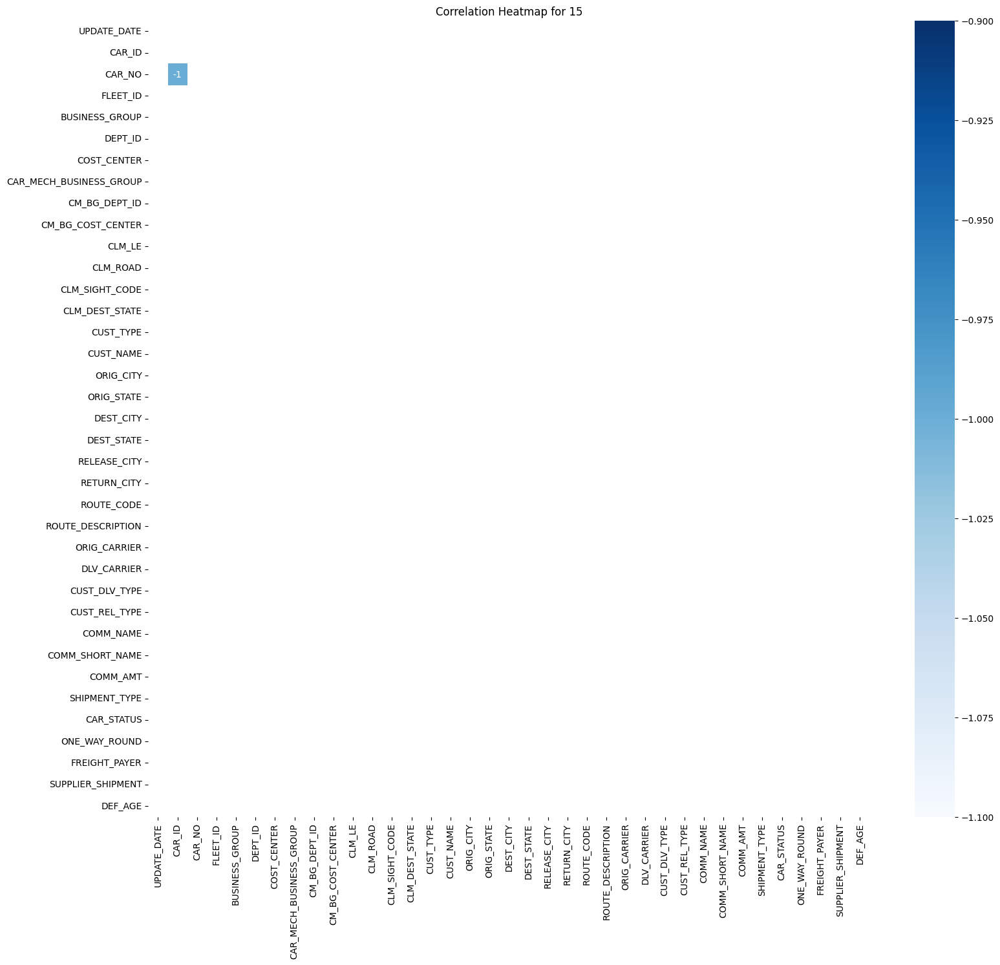

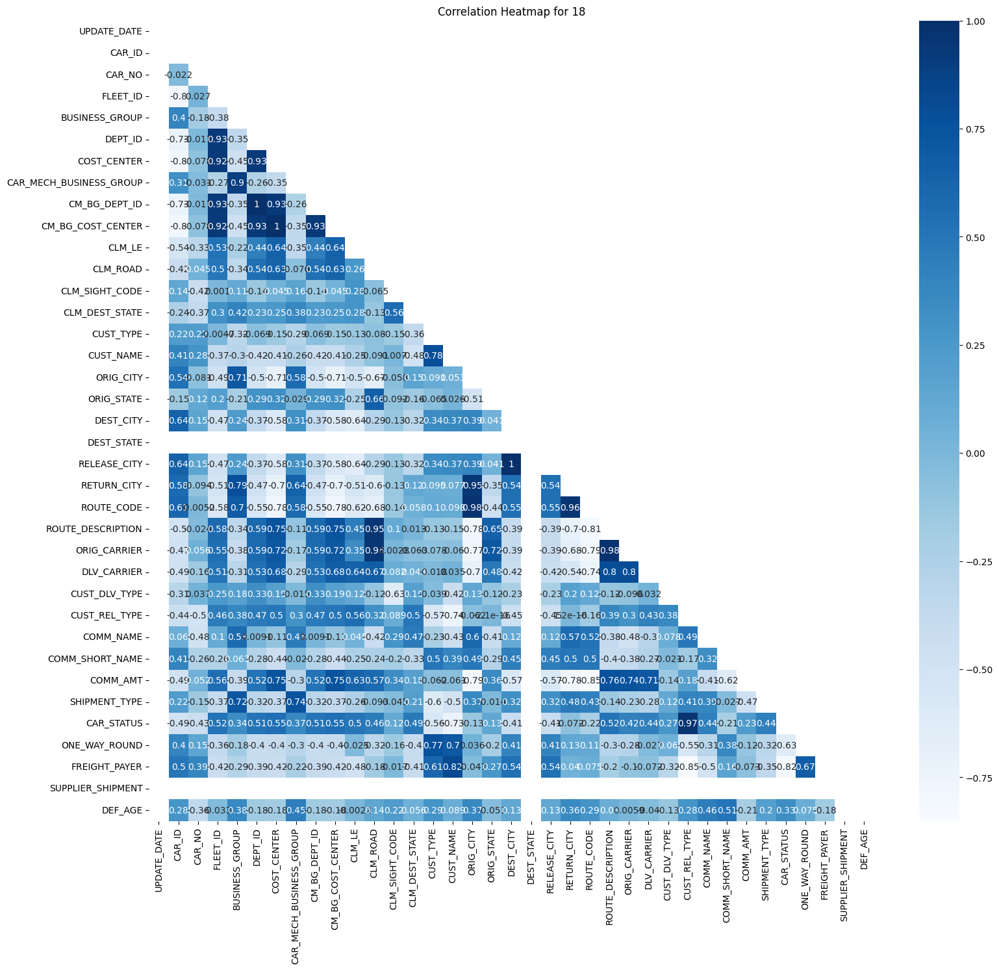

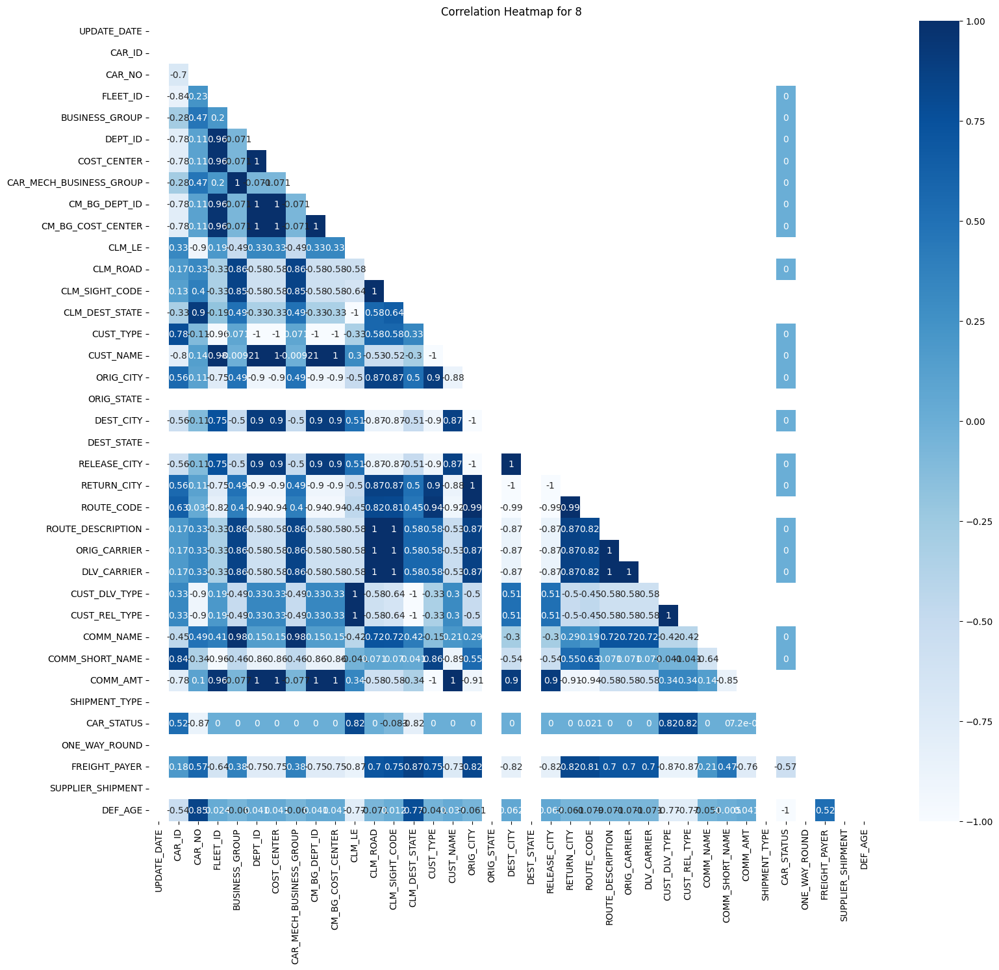

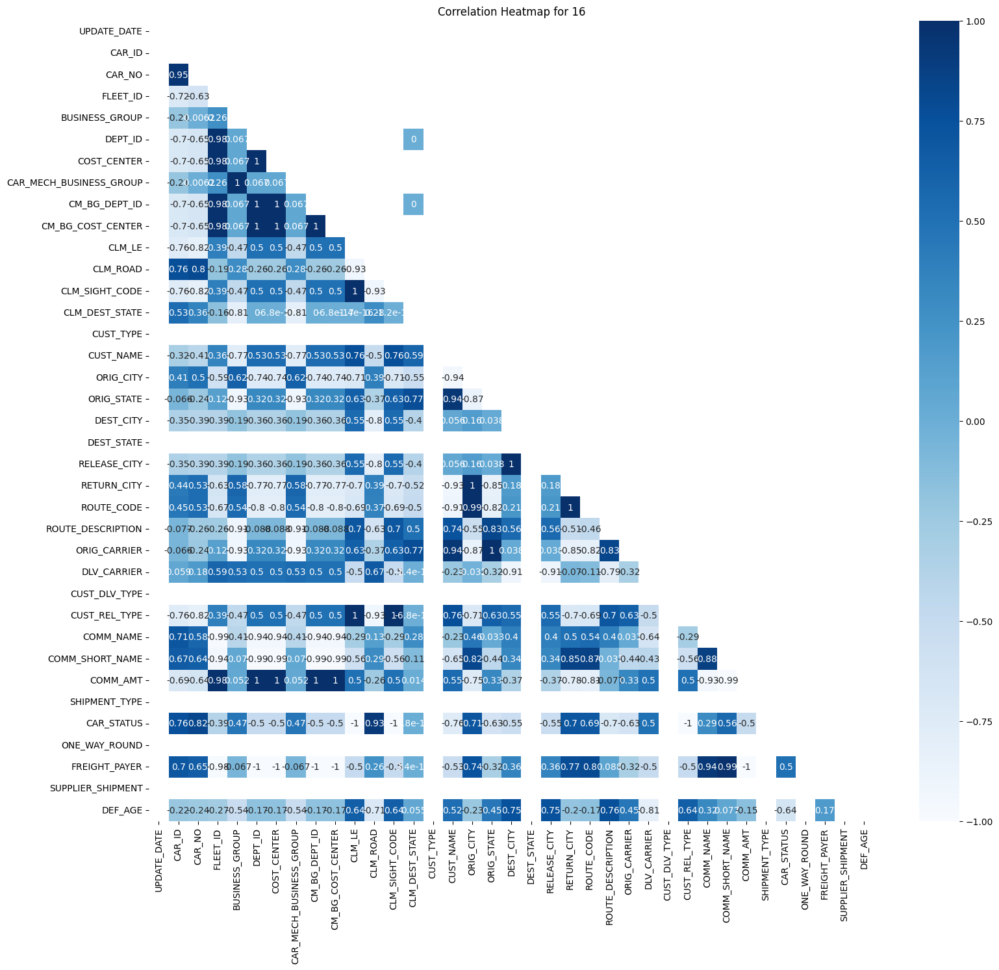

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


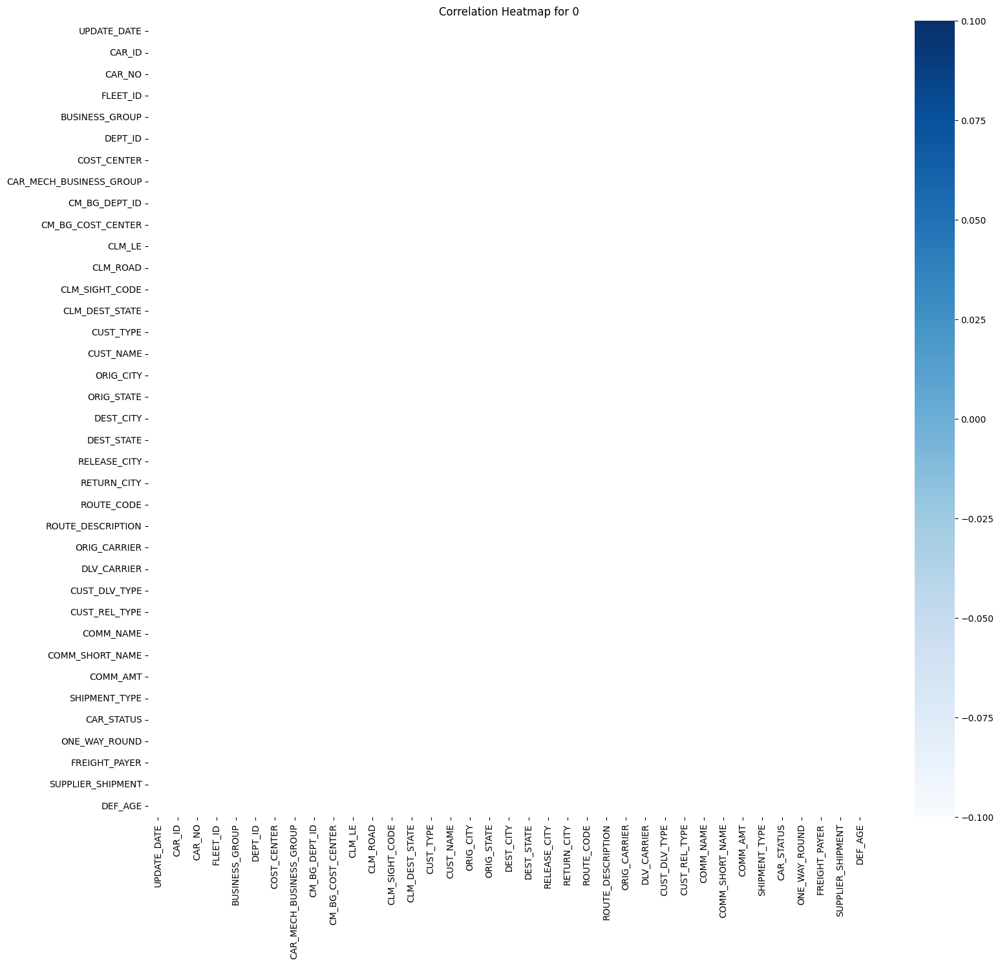

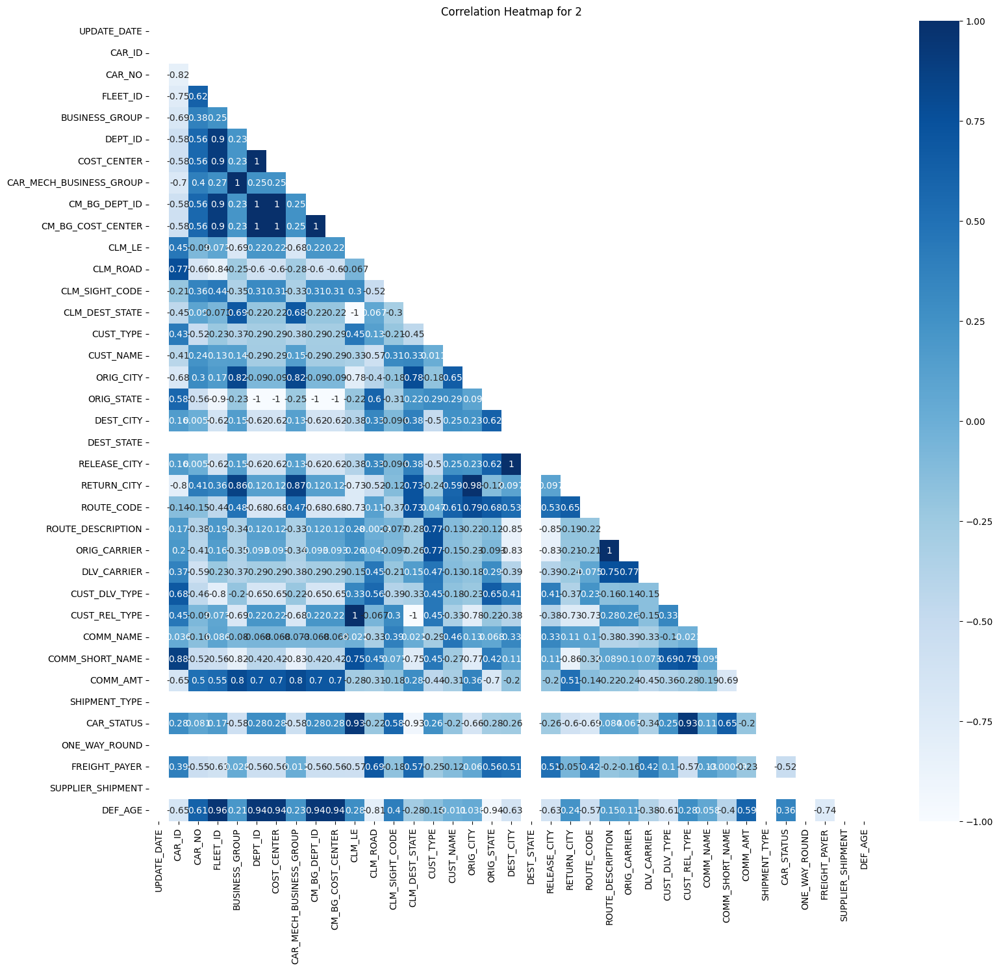

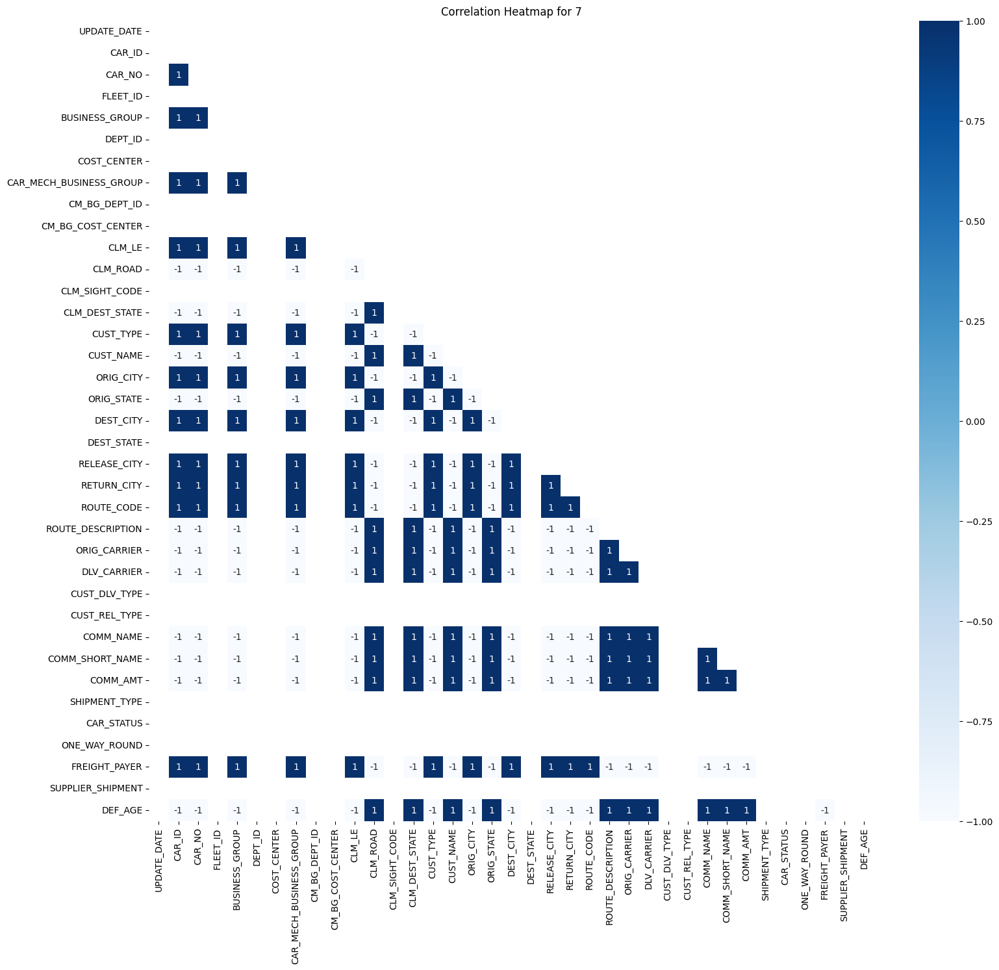

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


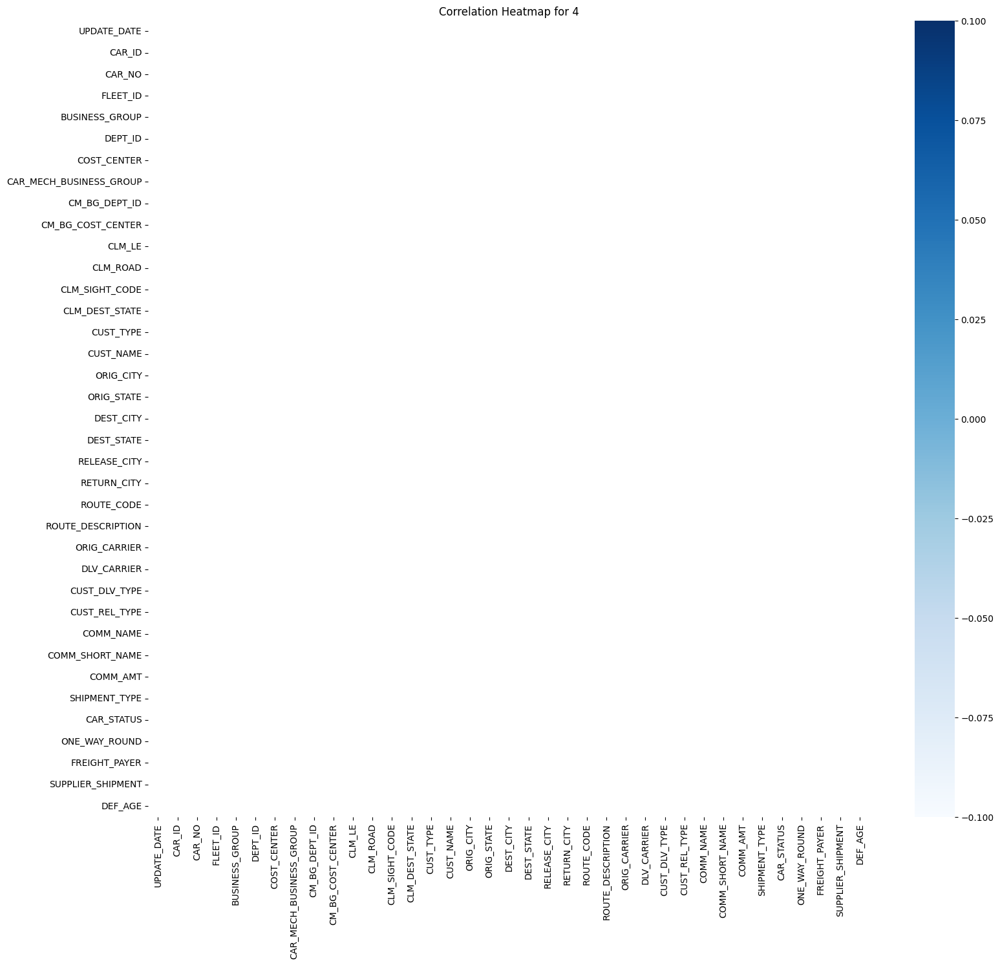

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


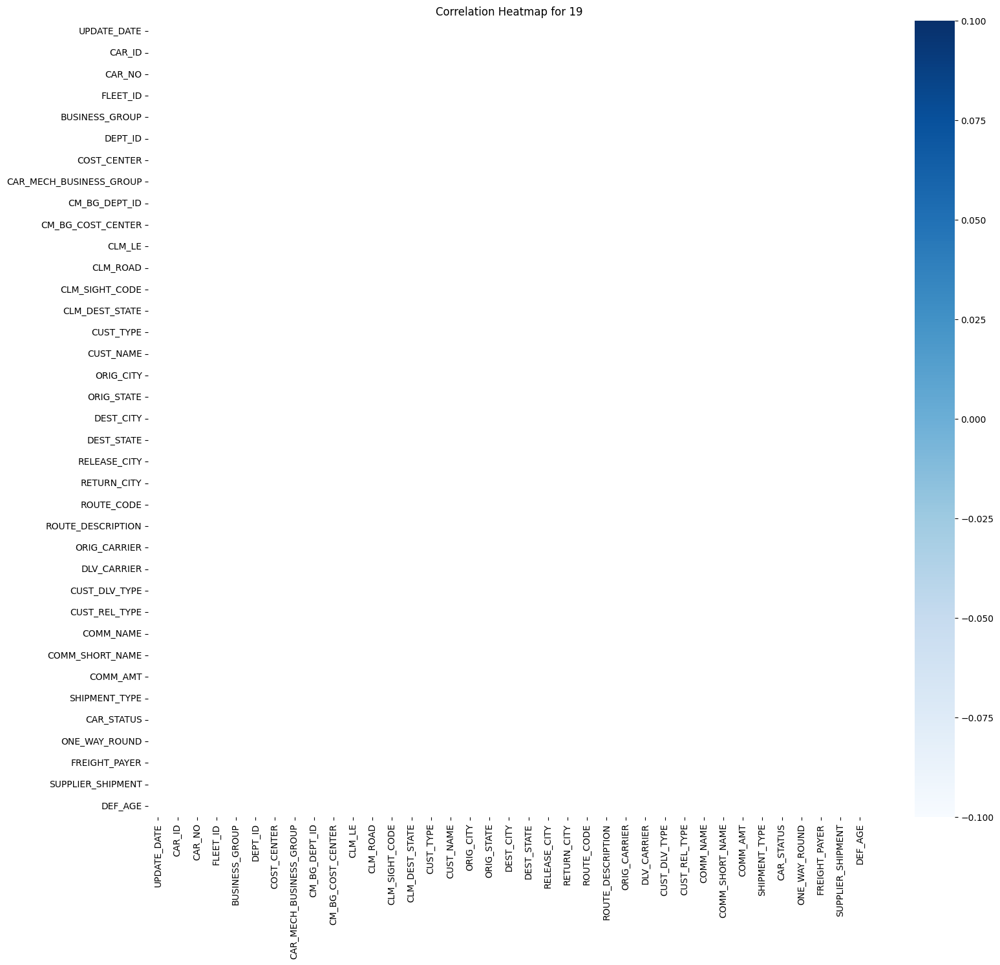

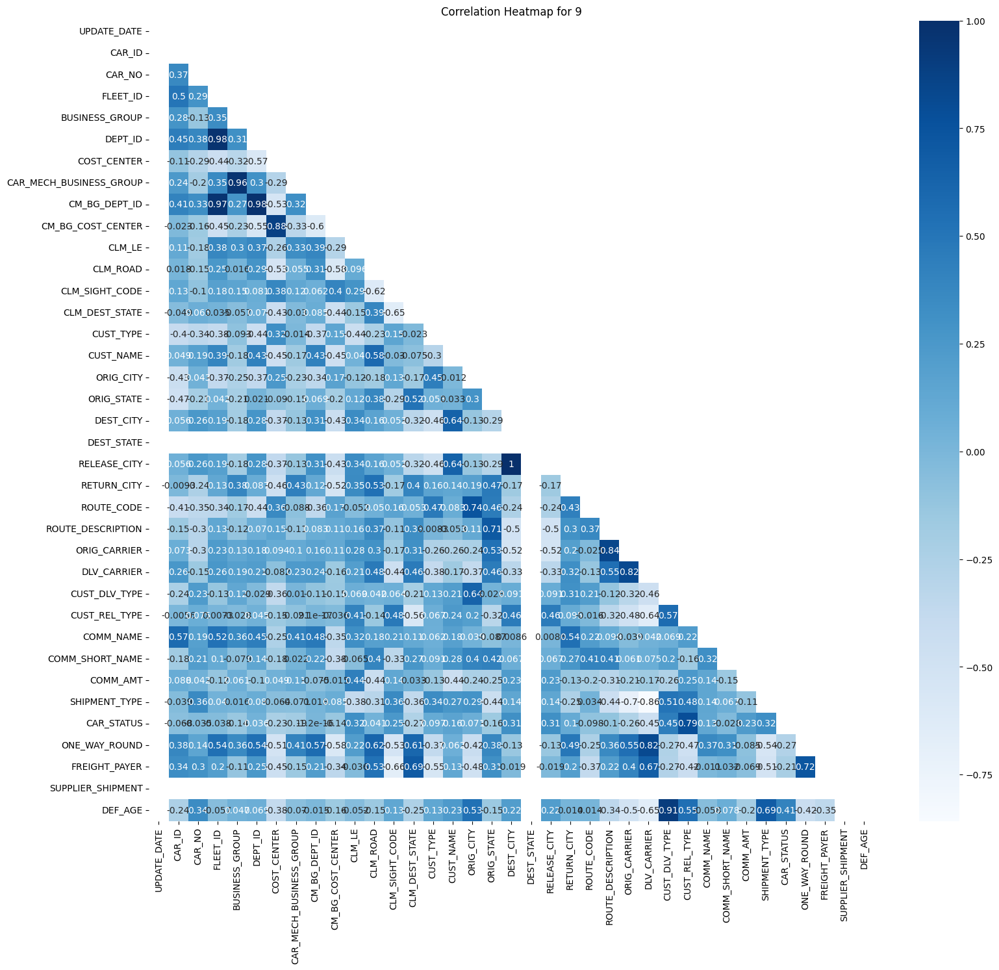

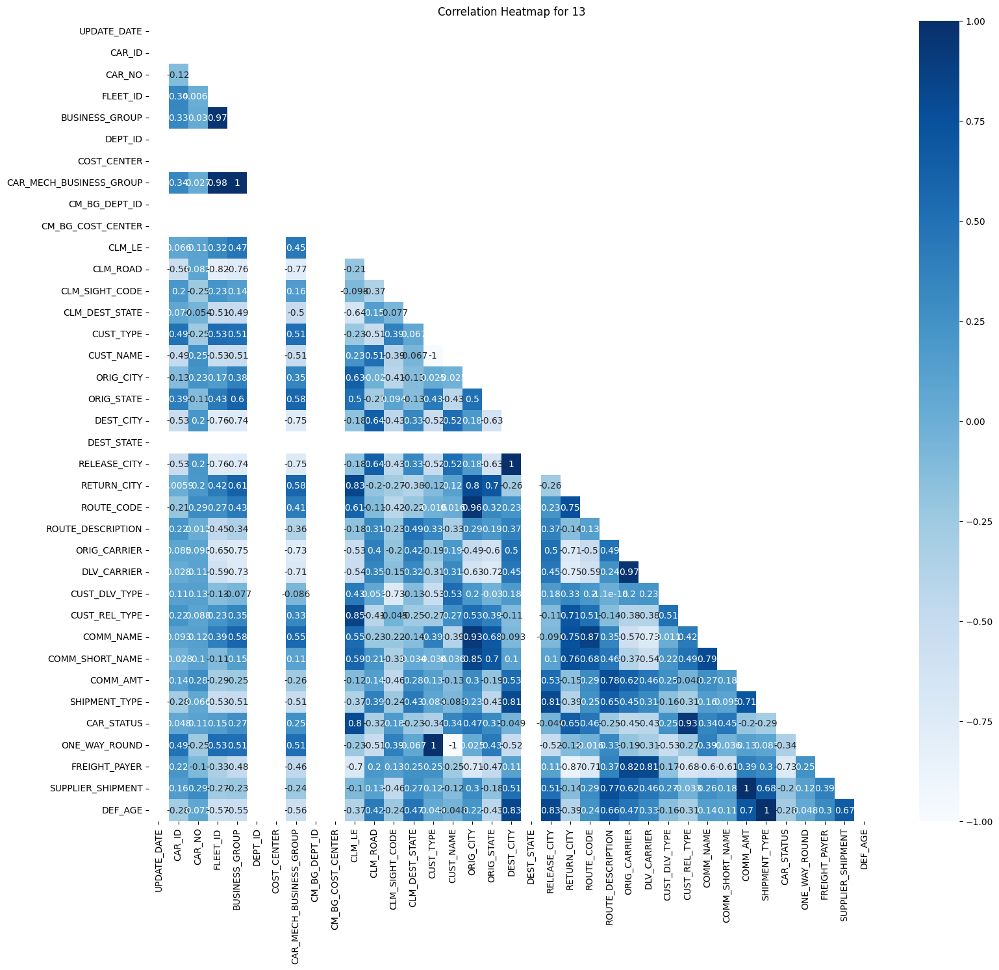

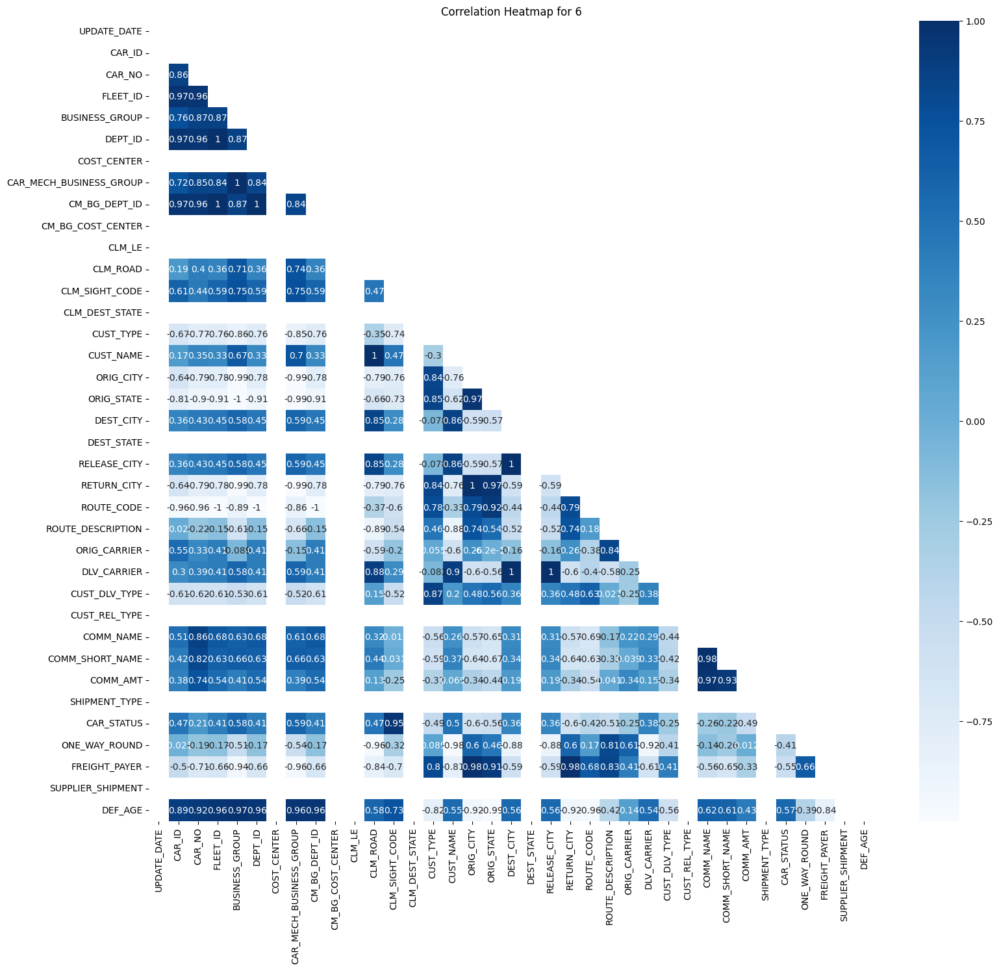

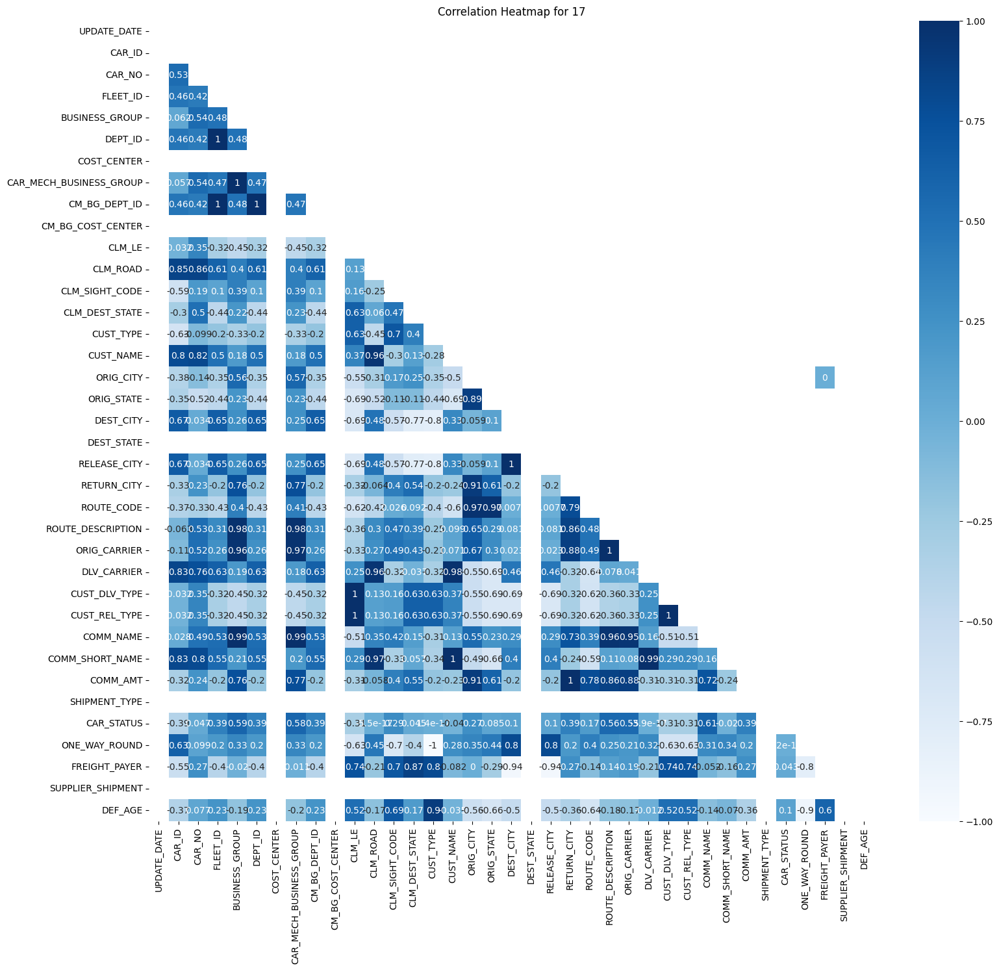

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


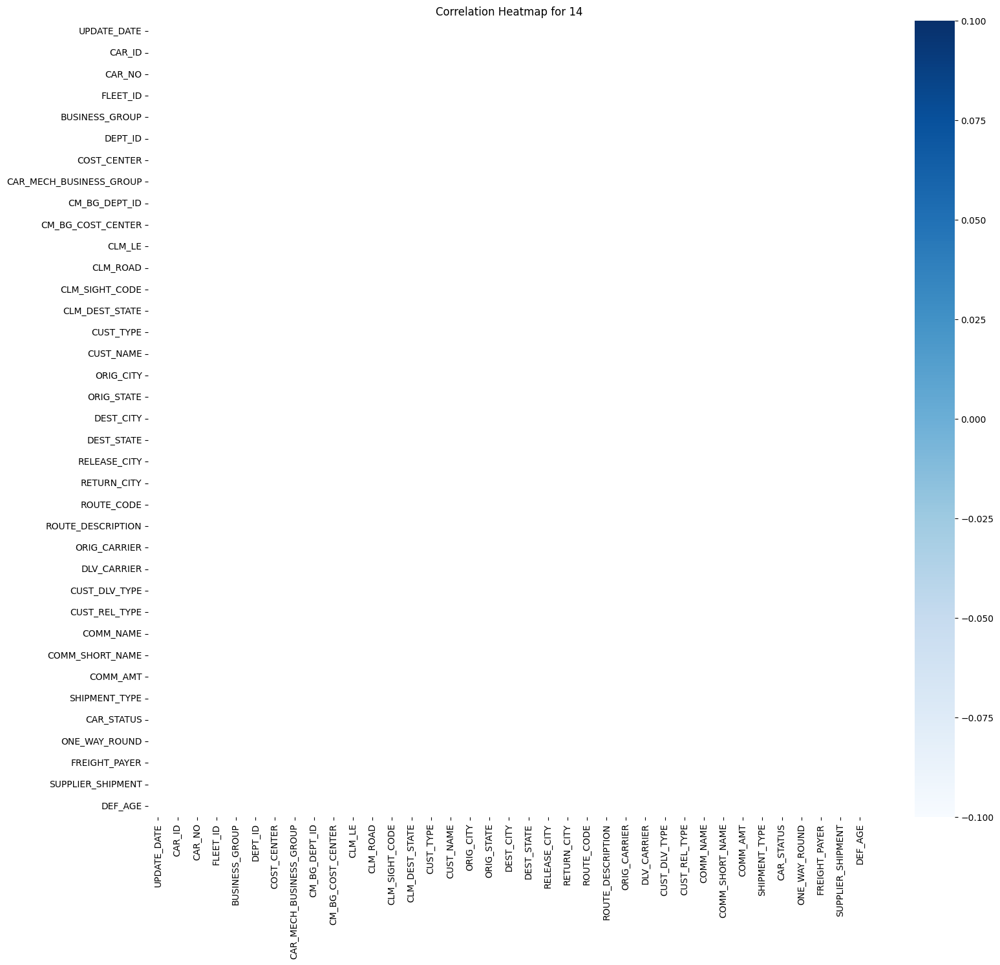

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


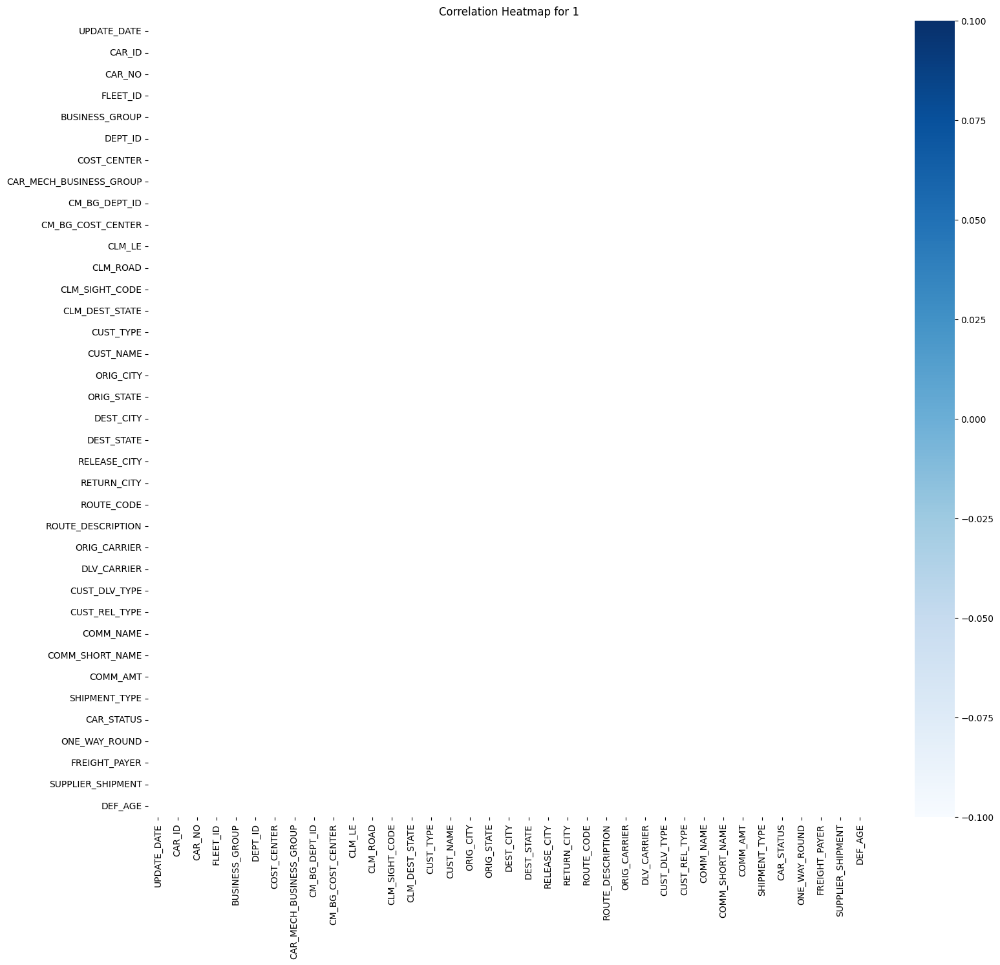

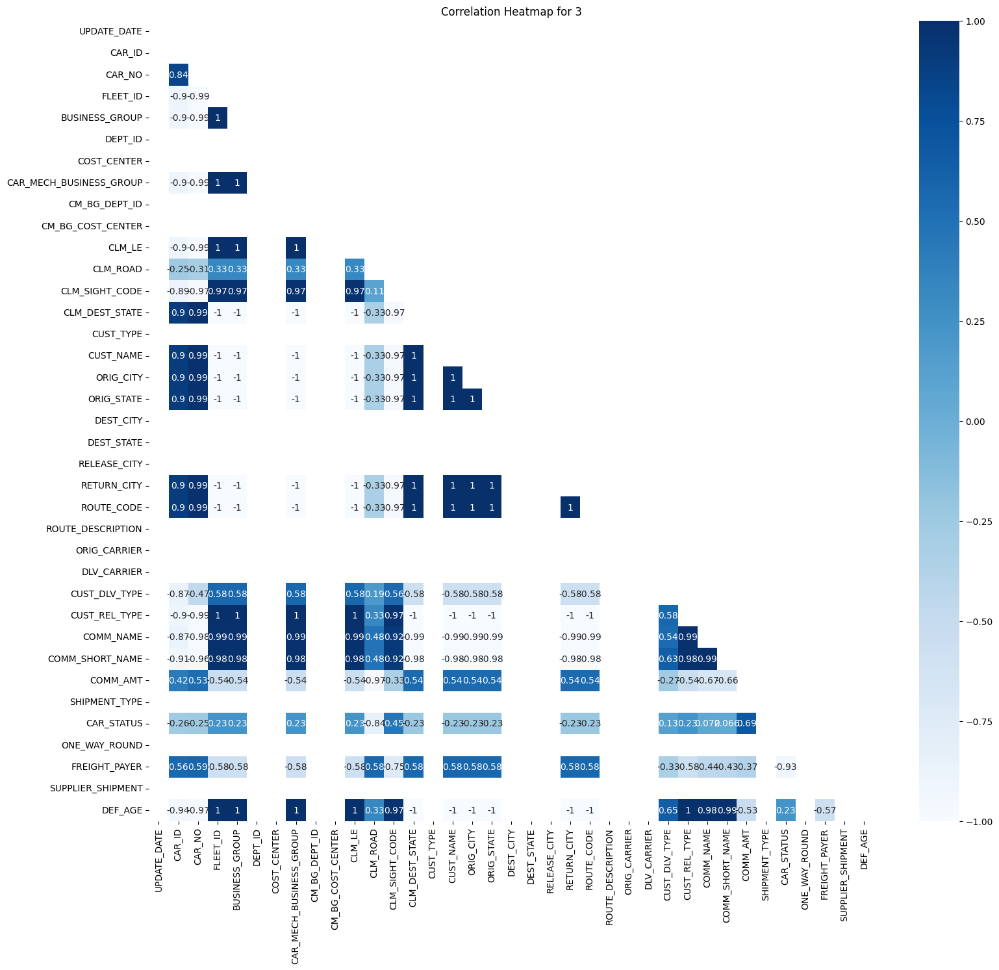

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


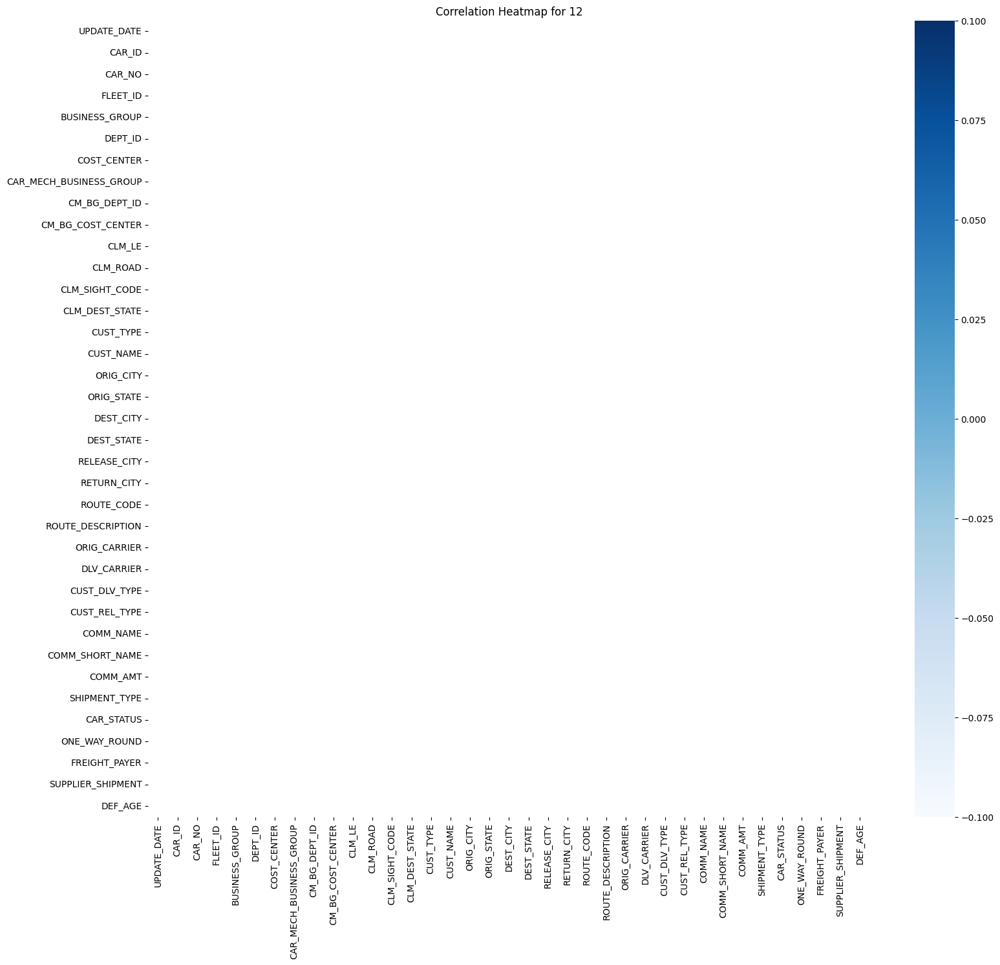

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


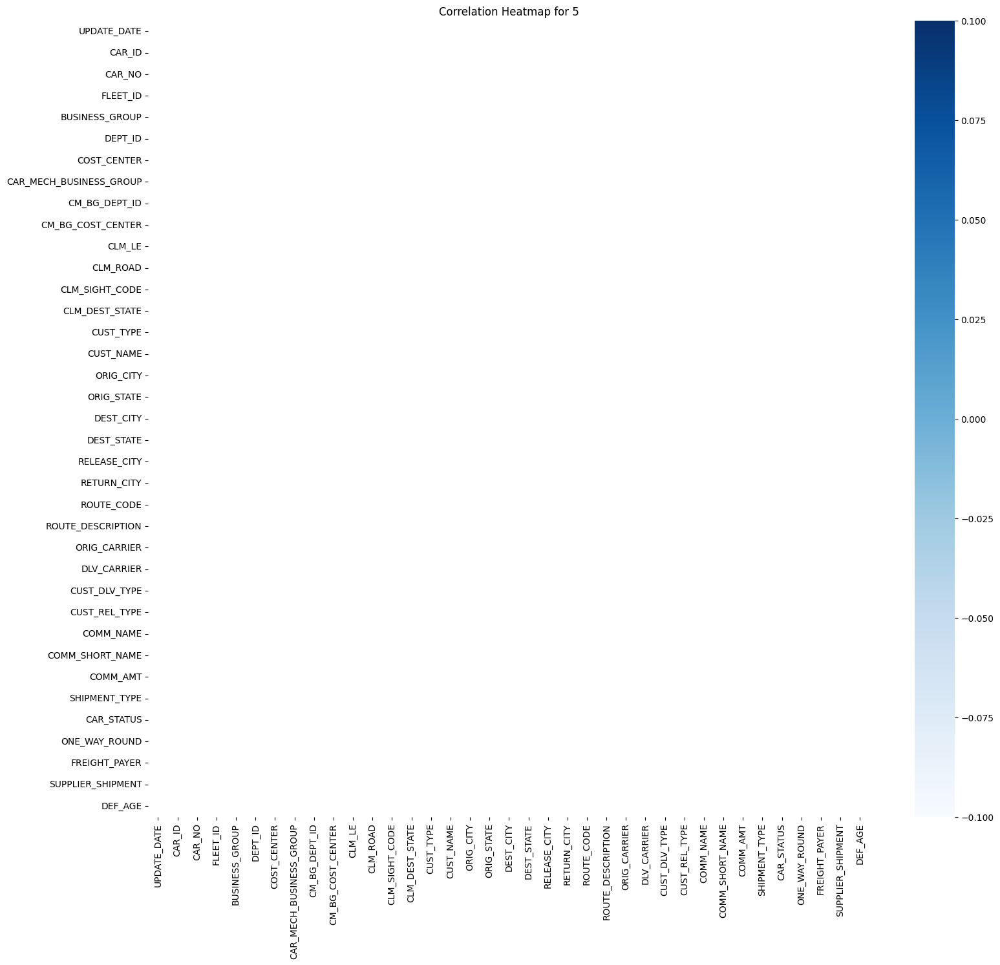

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


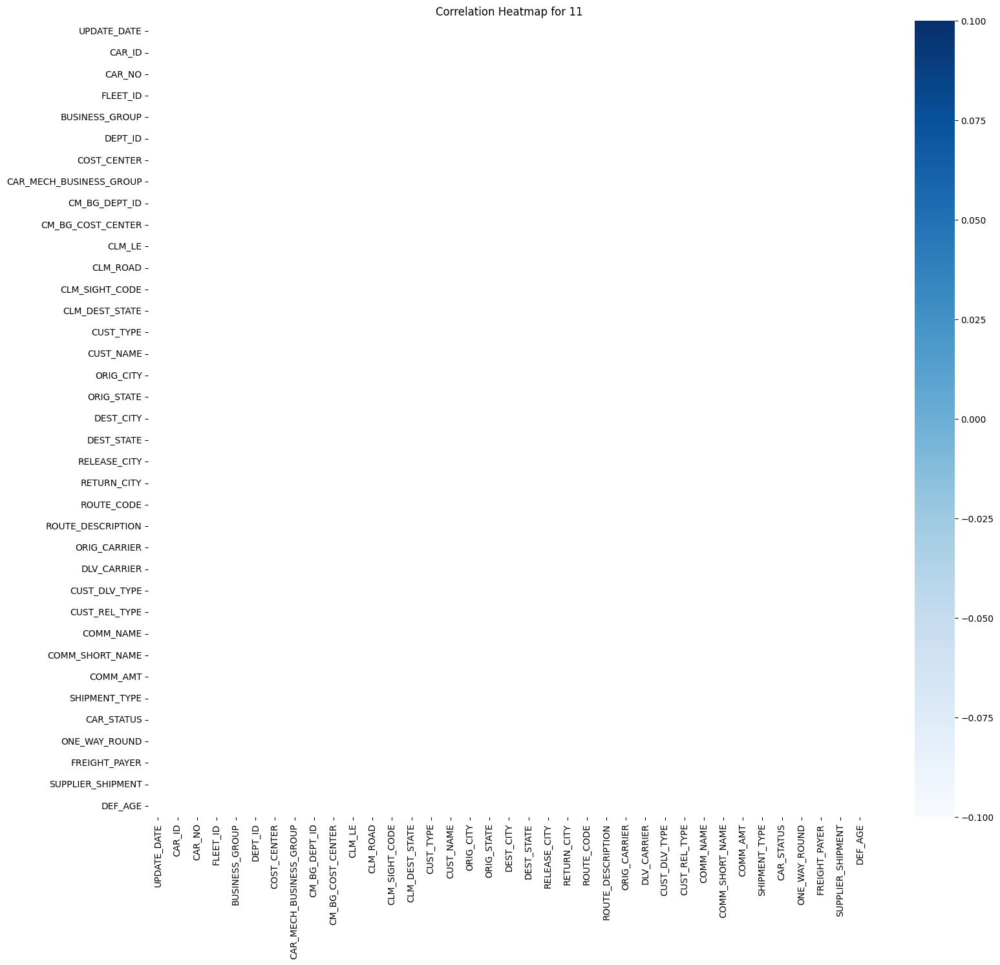

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


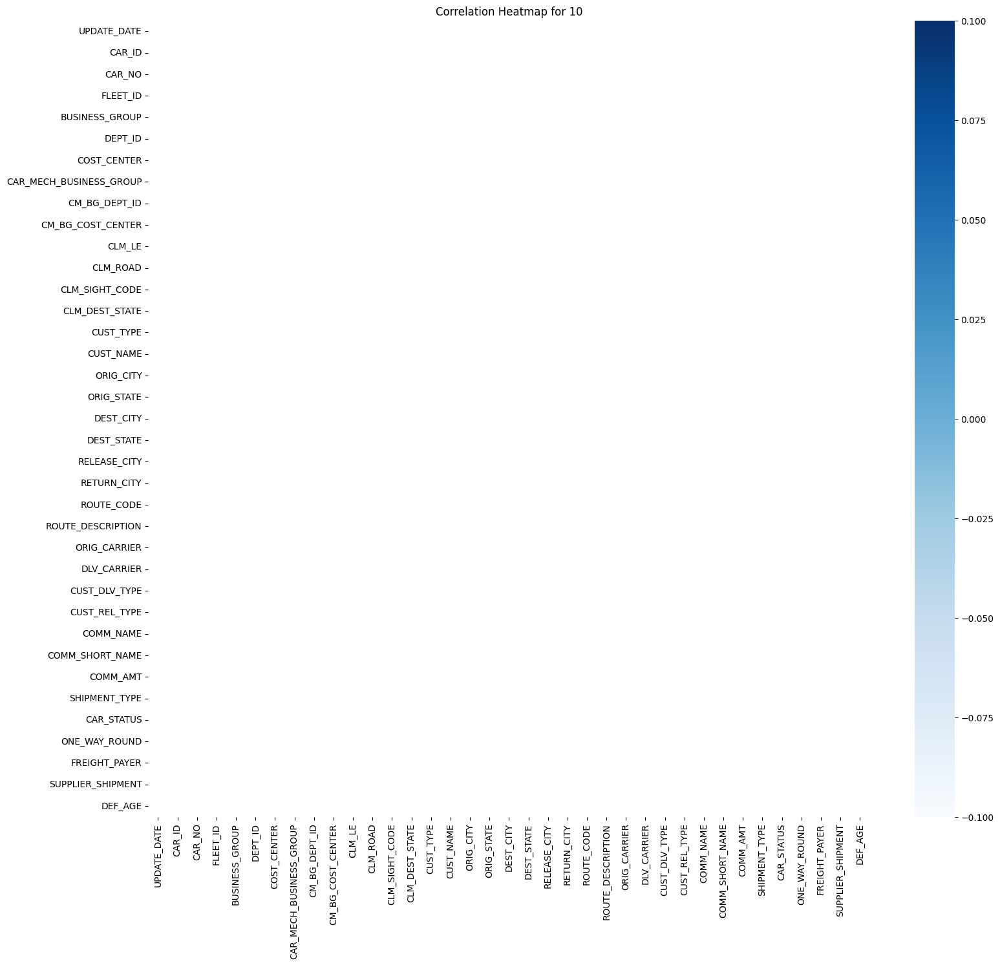

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'df' is your DataFrame containing the data including 'Vendor Name' and other numerical features
# Replace 'Other Numerical Feature 1', 'Other Numerical Feature 2', etc. with actual column names
numerical_features = ['TRIP_CLS_DATE_TIME', 'COMM_NAME', 'ROUTE_CODE']
for vendor in df['DEST_STATE'].unique():
    df_vendor = df[df['DEST_STATE'] == vendor]
    plt.figure(figsize=(18, 16))  # Adjust figure size as needed
    sns.heatmap(df_vendor.corr(), cmap="Blues", mask=np.triu(df_vendor.corr()), annot=True)
    plt.title(f'Correlation Heatmap for {vendor}')
    plt.show()

#Decoding States
#01 - AG
#02 - BC
#03 - CA
#04 - DF
#05 - GA
#06 - IA
#07 - IL
#08 - IN
#09 - KS
#10 - LA
#11 - MA
#12 - NJ
#13 - OH
#14 - OK
#15 - ON
#16 - PA
#17 _ TX
#18 _ VA
#19 - N/A)



## Eliminating Time Related Variables

---



<ipython-input-85-61bab21488ab>:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = le.fit_transform(df[column])
<ipython-input-85-61bab21488ab>:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = le.fit_transform(df[column])
<ipython-input-85-61bab21488ab>:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/sta

Fitting 3 folds for each of 243 candidates, totalling 729 fits
Mean Squared Error: 1171.4198
R-squared: 0.7628
Feature: UPDATE_DATE, Importance: 0.0090
Feature: CAR_ID, Importance: 0.0485
Feature: CAR_NO, Importance: 0.0160
Feature: FLEET_ID, Importance: 0.1169
Feature: BUSINESS_GROUP, Importance: 0.2670
Feature: DEPT_ID, Importance: 0.0143
Feature: COST_CENTER, Importance: 0.0004
Feature: CAR_MECH_BUSINESS_GROUP, Importance: 0.0062
Feature: CM_BG_DEPT_ID, Importance: 0.0403
Feature: CM_BG_COST_CENTER, Importance: 0.3171
Feature: CLM_LE, Importance: 0.0100
Feature: CLM_ROAD, Importance: 0.0207
Feature: CLM_SIGHT_CODE, Importance: 0.0155
Feature: CLM_DEST_STATE, Importance: 0.0208
Feature: CUST_TYPE, Importance: 0.0007
Feature: CUST_NAME, Importance: 0.0195
Feature: ORIG_CITY, Importance: 0.0505
Feature: ORIG_STATE, Importance: 0.0045
Feature: DEST_CITY, Importance: 0.0175
Feature: DEST_STATE, Importance: 0.0045


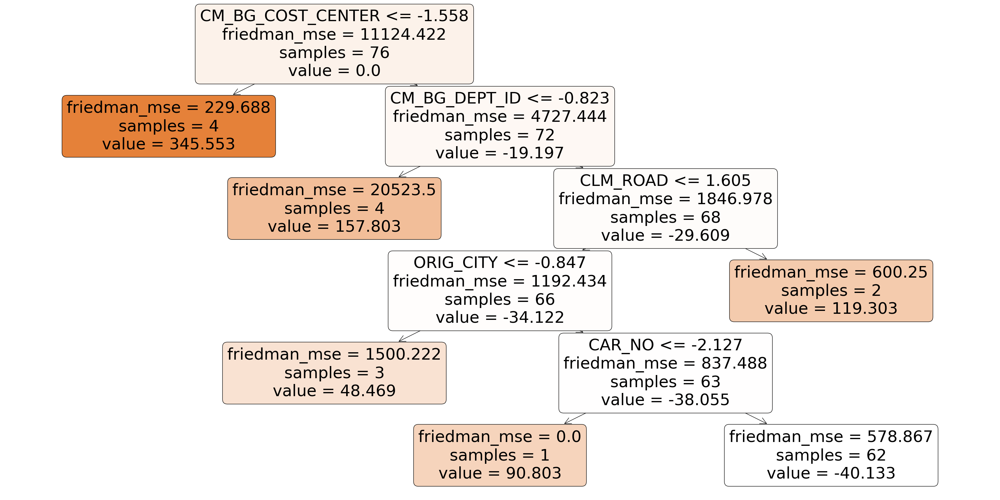

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler, PolynomialFeatures
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error, r2_score
import joblib
import matplotlib.pyplot as plt

# Select relevant columns for the model
relevant_columns = ['UPDATE_DATE', 'CAR_ID', 'CAR_NO',
                    'FLEET_ID', 'BUSINESS_GROUP', 'DEPT_ID', 'COST_CENTER',
                    'CAR_MECH_BUSINESS_GROUP', 'CM_BG_DEPT_ID',
                    'CM_BG_COST_CENTER', 'CLM_LE', 'CLM_ROAD',
                    'CLM_SIGHT_CODE','CLM_DEST_STATE', 'CUST_TYPE', 'CUST_NAME',
                    'ORIG_CITY', 'ORIG_STATE',  'DEST_CITY', 'DEST_STATE', 'RELEASE_CITY',
                    'RETURN_CITY', 'ROUTE_CODE', 'ROUTE_DESCRIPTION', 'ORIG_CARRIER', 'DLV_CARRIER',
                    'CUST_DLV_TYPE', 'CUST_REL_TYPE','COMM_NAME', 'COMM_SHORT_NAME', 'COMM_AMT',
                    'SHIPMENT_TYPE', 'CAR_STATUS', 'ONE_WAY_ROUND', 'FREIGHT_PAYER', 'SUPPLIER_SHIPMENT','DEF_AGE']

# Read the CSV file, ensuring all relevant columns are present
df = pd.read_csv('RPO data set.1.csv')  # Replace 'RPO data set.1.csv' with the actual file path

# Check if all relevant columns are in the DataFrame
missing_columns = set(relevant_columns) - set(df.columns)
if missing_columns:
    print(f"Warning: The following columns are missing from the DataFrame: {missing_columns}")

# Filter the dataframe to include only the relevant columns that are present
df = df[[col for col in relevant_columns if col in df.columns]]

# Initialize LabelEncoders for categorical columns
label_encoders = {}
for column in df.select_dtypes(include=['object']).columns:
    # Check if the column is a Series (1-dimensional)
    if isinstance(df[column], pd.Series):
        le = LabelEncoder()
        df[column] = le.fit_transform(df[column])
        label_encoders[column] = le
    else:
        print(f"Skipping column '{column}' because it is not a 1-dimensional Series.")

# Select features and target variable (assuming DEF_AGE is the target variable)
X = df.drop('DEF_AGE', axis=1)  # Select all columns except 'DEF_AGE'
y = df['DEF_AGE']

# Feature scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Polynomial features
poly = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)
X_poly = poly.fit_transform(X_scaled)

# Feature selection
selector = RFE(estimator=GradientBoostingRegressor(), n_features_to_select=20, step=1)
X_selected = selector.fit_transform(X_poly, y)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

# Create and train the model with hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

model = GradientBoostingRegressor(random_state=42)
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

# Best model
best_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse:.4f}')
print(f'R-squared: {r2:.4f}')

# Get feature importances
importances = best_model.feature_importances_
feature_names = poly.get_feature_names_out(input_features=X.columns)

# Print feature importances
for feature, importance in zip(feature_names, importances):
    print(f'Feature: {feature}, Importance: {importance:.4f}')


# Save the model
joblib.dump(best_model, 'gradient_boosting_model.pkl')

# Load the model
loaded_model = joblib.load('gradient_boosting_model.pkl')

# Predict using the loaded model
loaded_model.predict(X_test)

# Plot and display the decision tree with values
plt.figure(figsize=(40,20))
plot_tree(best_model.estimators_[0, 0], feature_names=feature_names, filled=True, rounded=True, impurity=True)
plt.show()


## Metric Testing

In [ ]:
import seaborn as sns
sns.pairplot(df, hue='BUSINESS_GROUP')
plt.show()

In [ ]:
#The associated variables are: Fleet_IDs BS and WXFDA, Cost Center C021205516 Lubes and Wax

import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder

# 1 Select Varaibles
X = df[['FLEET_ID']]

# Convert categorical feature to numerical using one-hot encoding
encoder = OneHotEncoder()
X_encoded = encoder.fit_transform(X)

y = df["DEF_AGE"]

#2. Creating the ML model
line_reg = LinearRegression()

#Training Model (fitting)
line_reg.fit(X_encoded, y)  # Use the encoded features


# Get feature names from the encoder
feature_names = encoder.get_feature_names_out(['FLEET_ID'])

# Print slopes with corresponding vendor names
for feature, coef in zip(feature_names, line_reg.coef_):
    print(f"{feature}: {coef:.2f}")

FLEET_ID_0: -34.94
FLEET_ID_1: 21.62
FLEET_ID_2: -15.38
FLEET_ID_3: -45.94
FLEET_ID_4: -12.17
FLEET_ID_5: -15.94
FLEET_ID_6: -24.94
FLEET_ID_7: 131.31
FLEET_ID_8: -3.61


In [ ]:
#The associated customer(s) for days sitting include Exxon Mobil Mexico SA DCV, Exxon Mobil Refining and Supply Co, GEAUX GEAUX RR, New Orleans Public Belt, Stolthaven Houston, Rail Logix, Hase Petroleum
#Identifies where railcars have been sitting over 100 days

import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder

# 1 Select Varaibles
X = df[['CUST_NAME']]

# Convert categorical feature to numerical using one-hot encoding
encoder = OneHotEncoder()
X_encoded = encoder.fit_transform(X)

y = df["DEF_AGE"]

#2. Creating the ML model
line_reg = LinearRegression()

#Training Model (fitting)
line_reg.fit(X_encoded, y)  # Use the encoded features


# Get feature names from the encoder
feature_names = encoder.get_feature_names_out(['CUST_NAME'])
feature_names = encoder.get_feature_names_out(['CUST_NAME'])

# Print slopes with corresponding vendor names
for feature, coef in zip(feature_names, line_reg.coef_):
    print(f"{feature}: {coef:.2f}")

CUST_NAME_0: 7.52
CUST_NAME_1: -34.48
CUST_NAME_2: -58.48
CUST_NAME_3: -58.48
CUST_NAME_4: -6.48
CUST_NAME_5: -62.48
CUST_NAME_6: -59.48
CUST_NAME_7: -52.48
CUST_NAME_8: -34.48
CUST_NAME_9: -11.08
CUST_NAME_10: -57.48
CUST_NAME_11: -52.48
CUST_NAME_12: -53.48
CUST_NAME_13: 21.02
CUST_NAME_14: -59.48
CUST_NAME_15: -46.48
CUST_NAME_16: -8.48
CUST_NAME_17: -27.04
CUST_NAME_18: 74.52
CUST_NAME_19: 318.52
CUST_NAME_20: -62.48
CUST_NAME_21: 252.52
CUST_NAME_22: -55.48
CUST_NAME_23: -36.48
CUST_NAME_24: -55.48
CUST_NAME_25: -60.48
CUST_NAME_26: 76.52
CUST_NAME_27: -52.48
CUST_NAME_28: 334.52
CUST_NAME_29: -57.08
CUST_NAME_30: -55.48
CUST_NAME_31: -52.48
CUST_NAME_32: -3.48
CUST_NAME_33: 141.52
CUST_NAME_34: 8.52
CUST_NAME_35: -62.48
CUST_NAME_36: 92.52
CUST_NAME_37: 164.02
CUST_NAME_38: -52.48
CUST_NAME_39: -58.48
CUST_NAME_40: 5.52
CUST_NAME_41: -13.48
CUST_NAME_42: -8.48
CUST_NAME_43: -52.48
CUST_NAME_44: -7.48
CUST_NAME_45: -35.48
CUST_NAME_46: -32.08


In [ ]:
#Original Carrier 0 Represents null value not inputted, other original carriers: WW, KCS, XIHT

import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder

# 1 Select Varaibles
X = df[['ORIG_CARRIER']]

# Convert categorical feature to numerical using one-hot encoding
encoder = OneHotEncoder()
X_encoded = encoder.fit_transform(X)

y = df["DEF_AGE"]

#2. Creating the ML model
line_reg = LinearRegression()

#Training Model (fitting)
line_reg.fit(X_encoded, y)  # Use the encoded features


# Get feature names from the encoder
feature_names = encoder.get_feature_names_out(['ORIG_CARRIER'])
feature_names = encoder.get_feature_names_out(['ORIG_CARRIER'])

# Print slopes with corresponding vendor names
for feature, coef in zip(feature_names, line_reg.coef_):
    print(f"{feature}: {coef:.2f}")

ORIG_CARRIER_0: 36.22
ORIG_CARRIER_1: -69.70
ORIG_CARRIER_2: -71.03
ORIG_CARRIER_3: -24.78
ORIG_CARRIER_4: -31.03
ORIG_CARRIER_5: -42.03
ORIG_CARRIER_6: 5.16
ORIG_CARRIER_7: -35.03
ORIG_CARRIER_8: -5.03
ORIG_CARRIER_9: -52.53
ORIG_CARRIER_10: -41.62
ORIG_CARRIER_11: 356.97
ORIG_CARRIER_12: 32.97
ORIG_CARRIER_13: -58.53


In [ ]:
#Original Carrier Represents null value not inputted, other carriers include: BFPRR, FXE, KCSM, NS, XIHT

import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder

# 1 Select Varaibles
X = df[['DLV_CARRIER']]

# Convert categorical feature to numerical using one-hot encoding
encoder = OneHotEncoder()
X_encoded = encoder.fit_transform(X)

y = df["DEF_AGE"]

#2. Creating the ML model
line_reg = LinearRegression()

#Training Model (fitting)
line_reg.fit(X_encoded, y)  # Use the encoded features


# Get feature names from the encoder
feature_names = encoder.get_feature_names_out(['DLV_CARRIER'])
feature_names = encoder.get_feature_names_out(['DLV_CARRIER'])

# Print slopes with corresponding vendor names
for feature, coef in zip(feature_names, line_reg.coef_):
    print(f"{feature}: {coef:.2f}")

DLV_CARRIER_0: 57.18
DLV_CARRIER_1: -26.57
DLV_CARRIER_2: -38.07
DLV_CARRIER_3: 73.81
DLV_CARRIER_4: -38.27
DLV_CARRIER_5: -0.82
DLV_CARRIER_6: -51.07
DLV_CARRIER_7: 19.15
DLV_CARRIER_8: -10.82
DLV_CARRIER_9: 4.11
DLV_CARRIER_10: 15.93
DLV_CARRIER_11: -20.94
DLV_CARRIER_12: 53.93
DLV_CARRIER_13: -37.57


In [ ]:
#Definition outputs are based upon associated rail companies: CN, CSXT, Divert to Storage, (KCS-BATON-CN), (KCS-JCKSN-CN), (WW-MLVNJ-NS), XIHT

import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder

# 1 Select Varaibles
X = df[['ROUTE_DESCRIPTION']]

# Convert categorical feature to numerical using one-hot encoding
encoder = OneHotEncoder()
X_encoded = encoder.fit_transform(X)

y = df["DEF_AGE"]

#2. Creating the ML model
line_reg = LinearRegression()

#Training Model (fitting)
line_reg.fit(X_encoded, y)  # Use the encoded features


# Get feature names from the encoder
feature_names = encoder.get_feature_names_out(['ROUTE_DESCRIPTION'])
feature_names = encoder.get_feature_names_out(['ROUTE_DESCRIPTION'])

# Print slopes with corresponding vendor names
for feature, coef in zip(feature_names, line_reg.coef_):
    print(f"{feature}: {coef:.2f}")

ROUTE_DESCRIPTION_0: -57.19
ROUTE_DESCRIPTION_1: -58.52
ROUTE_DESCRIPTION_2: 70.48
ROUTE_DESCRIPTION_3: -55.52
ROUTE_DESCRIPTION_4: -6.52
ROUTE_DESCRIPTION_5: -57.52
ROUTE_DESCRIPTION_6: 62.48
ROUTE_DESCRIPTION_7: -58.52
ROUTE_DESCRIPTION_8: -59.52
ROUTE_DESCRIPTION_9: 187.88
ROUTE_DESCRIPTION_10: -29.52
ROUTE_DESCRIPTION_11: 53.08
ROUTE_DESCRIPTION_12: 285.48
ROUTE_DESCRIPTION_13: -52.52
ROUTE_DESCRIPTION_14: -55.52
ROUTE_DESCRIPTION_15: 31.48
ROUTE_DESCRIPTION_16: -40.02
ROUTE_DESCRIPTION_17: -55.52
ROUTE_DESCRIPTION_18: 5.48
ROUTE_DESCRIPTION_19: -41.19
ROUTE_DESCRIPTION_20: -48.85
ROUTE_DESCRIPTION_21: -58.52
ROUTE_DESCRIPTION_22: 92.48
ROUTE_DESCRIPTION_23: 7.48
ROUTE_DESCRIPTION_24: -50.66
ROUTE_DESCRIPTION_25: -25.12
ROUTE_DESCRIPTION_26: -40.02
ROUTE_DESCRIPTION_27: -55.52
ROUTE_DESCRIPTION_28: -43.77
ROUTE_DESCRIPTION_29: -59.52
ROUTE_DESCRIPTION_30: -52.52
ROUTE_DESCRIPTION_31: -29.85
ROUTE_DESCRIPTION_32: -19.27
ROUTE_DESCRIPTION_33: 8.48
ROUTE_DESCRIPTION_34: -62.52
ROUTE_D

Shapiro-Wilk Test: Statistic=0.584, p-value=0.000


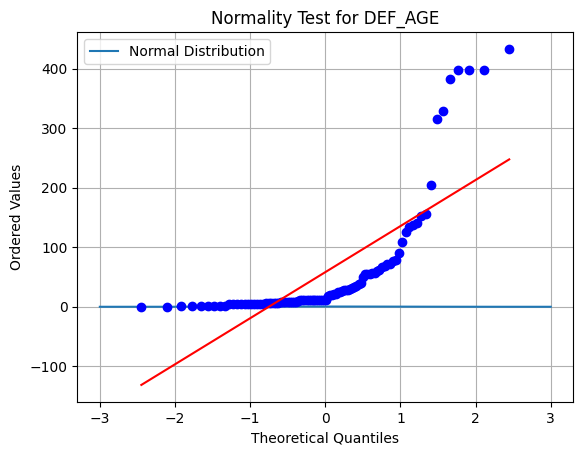

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
from scipy.stats import norm # Import the norm object

url26 = "/content/RPO data set.1.csv"
df = pd.read_csv(url26)

# Assuming 'Local Amount' is the column of interest
column_to_plot = 'DEF_AGE'
data = df[column_to_plot]

# Perform Shapiro-Wilk test for normality
statistic, p_value = stats.shapiro(data)
print(f"Shapiro-Wilk Test: Statistic={statistic:.3f}, p-value={p_value:.3f}")

# Calculate z-score for the obtained p-value (two-tailed test)
z_score = norm.ppf(1 - p_value / 2)

# Generate x-values and y-values for the normal distribution curve
x = np.linspace(-3, 3, 100) # x should be an array of numeric values
y = norm.pdf(x)

# Plot the normal distribution curve
plt.plot(x, y, label='Normal Distribution')

# Plot the probability plot of the data
stats.probplot(data, plot=plt)

# Customize the plot
plt.title(f"Normality Test for {column_to_plot}")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Values")
plt.legend()
plt.grid(True)
plt.show()

#There is not a normal distribution for DEF_AGE

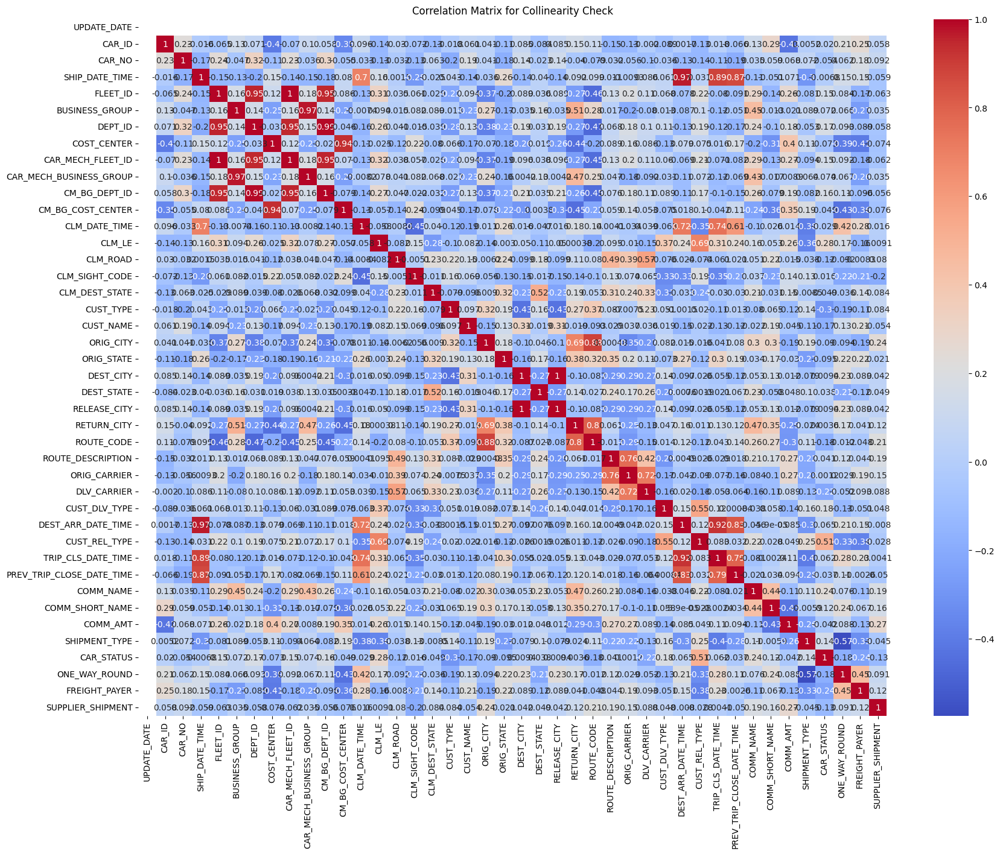

Highly correlated features (correlation > 0.8):
('SHIP_DATE_TIME', 'DEST_ARR_DATE_TIME')
('SHIP_DATE_TIME', 'TRIP_CLS_DATE_TIME')
('SHIP_DATE_TIME', 'PREV_TRIP_CLOSE_DATE_TIME')
('FLEET_ID', 'DEPT_ID')
('FLEET_ID', 'CAR_MECH_FLEET_ID')
('FLEET_ID', 'CM_BG_DEPT_ID')
('BUSINESS_GROUP', 'CAR_MECH_BUSINESS_GROUP')
('DEPT_ID', 'CAR_MECH_FLEET_ID')
('DEPT_ID', 'CM_BG_DEPT_ID')
('COST_CENTER', 'CM_BG_COST_CENTER')
('CAR_MECH_FLEET_ID', 'CM_BG_DEPT_ID')
('ORIG_CITY', 'ROUTE_CODE')
('DEST_CITY', 'RELEASE_CITY')
('RETURN_CITY', 'ROUTE_CODE')
('DEST_ARR_DATE_TIME', 'TRIP_CLS_DATE_TIME')
('DEST_ARR_DATE_TIME', 'PREV_TRIP_CLOSE_DATE_TIME')


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

# Define relevant columns
relevant_columns = ['UPDATE_DATE', 'CAR_ID', 'CAR_NO', "SHIP_DATE_TIME",
                    'FLEET_ID', 'BUSINESS_GROUP', 'DEPT_ID', 'COST_CENTER',
                    'CAR_MECH_FLEET_ID', 'CAR_MECH_BUSINESS_GROUP', 'CM_BG_DEPT_ID',
                    'CM_BG_COST_CENTER', 'CLM_DATE_TIME', 'CLM_LE', 'CLM_ROAD',
                    'CLM_SIGHT_CODE','CLM_DEST_STATE', 'CUST_TYPE', 'CUST_NAME',
                    'ORIG_CITY', 'ORIG_STATE',  'DEST_CITY', 'DEST_STATE', 'RELEASE_CITY',
                    'RETURN_CITY', 'ROUTE_CODE', 'ROUTE_DESCRIPTION', 'ORIG_CARRIER', 'DLV_CARRIER',
                    'CUST_DLV_TYPE', 'DEST_ARR_DATE_TIME', 'CUST_REL_TYPE', 'TRIP_CLS_DATE_TIME',
                    'PREV_TRIP_CLOSE_DATE_TIME', 'COMM_NAME', 'COMM_SHORT_NAME',
                    'COMM_AMT', 'SHIPMENT_TYPE', 'CAR_STATUS', 'ONE_WAY_ROUND',
                    'FREIGHT_PAYER', 'SUPPLIER_SHIPMENT','DEF_AGE']

# Read the CSV file, ensuring all relevant columns are present
df = pd.read_csv('RPO data set.1.csv')  # Replace with the actual file path

# Check if all relevant columns are in the DataFrame
missing_columns = set(relevant_columns) - set(df.columns)
if missing_columns:
    print(f"Warning: The following columns are missing from the DataFrame: {missing_columns}")

# Filter the dataframe to include only the relevant columns that are present
df = df[[col for col in relevant_columns if col in df.columns]]

# Initialize LabelEncoders for categorical columns
label_encoders = {}
for column in df.select_dtypes(include=['object']).columns:
    # Check if the column is a Series (1-dimensional)
    if isinstance(df[column], pd.Series):
        le = LabelEncoder()
        df[column] = le.fit_transform(df[column])
        label_encoders[column] = le
    else:
        print(f"Skipping column '{column}' because it is not a 1-dimensional Series.")

# Select features and target variable (assuming DEF_AGE is the target variable)
X = df.drop('DEF_AGE', axis=1)  # Select all columns except 'DEF_AGE'
y = df['DEF_AGE']

# Calculate the correlation matrix
corr_matrix = X.corr()

# Plot the heatmap for collinearity check
plt.figure(figsize=(20, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix for Collinearity Check')
plt.show()

# Identify highly correlated features (threshold > 0.8)
high_corr_var = np.where(corr_matrix > 0.8)
high_corr_var = [(corr_matrix.index[x], corr_matrix.columns[y]) for x, y in zip(*high_corr_var) if x != y and x < y]

print("Highly correlated features (correlation > 0.8):")
for var_pair in high_corr_var:
    print(var_pair)


## Cost Application

UP = $85/day

BFPR = $70-90/day

BRC = $52-104/day

NS = $60/day